# Pipeline inicial para BCL-2

## Carga de los datos y exploración inicial

Comenzaremos importando los datos en formato csv, descargados de la base de datos ChEMBL, en principio se han seleccionado solo aquellas moleculas cuyo valor de IC50 frente a BCL2 está documentado:


In [ ]:
import pandas as pd
set_bcl2= pd.read_csv("C:/Users/jorge/Desktop/proyecto_TFM/data/set_BCL-2.csv", sep=";")
set_bcl2

,Molecule ChEMBL ID,Molecule Name,Molecule Max Phase,Molecular Weight,#RO5 Violations,AlogP,Compound Key,Smiles,Standard Type,Standard Relation,...,Document ChEMBL ID,Source ID,Source Description,Document Journal,Document Year,Cell ChEMBL ID,Properties,Action Type,Standard Text Value,Value
0,CHEMBL343296,NaN,NaN,239.28,0.0,0.69,33,OC1C[n+]2cc3ccccn3c2-c2cccc[n+]21,IC50,NaN,...,CHEMBL1134645,1,Scientific Literature,J Med Chem,2001,NaN,NaN,NaN,NaN,NaN
1,CHEMBL3904423,NaN,NaN,862.29,2.0,8.18,BDBM232388,CCCCN(CCCC)C(=O)c1nn(-c2ccc(C(=O)NS(=O)(=O)c3c...,IC50,'=',...,CHEMBL3886736,37,BindingDB Patent Bioactivity Data,NaN,2016,NaN,NaN,NaN,NaN,30.0
2,CHEMBL2031009,NaN,NaN,746.72,2.0,6.91,BDBM50384340,CCCN(CCC)c1ncc(Cl)c(-c2ccc(C(=O)NS(=O)(=O)c3cc...,IC50,'=',...,CHEMBL3886736,37,BindingDB Patent Bioactivity Data,NaN,2016,NaN,NaN,NaN,NaN,8.78
3,CHEMBL2031003,NaN,NaN,704.90,2.0,6.35,4e,CCCCN(CCCC)c1nccc(-c2ccc(C(=O)NS(=O)(=O)c3ccc4...,IC50,'=',...,CHEMBL2029199,1,Scientific Literature,Bioorg Med Chem Lett,2012,NaN,NaN,NaN,NaN,0.43
4,CHEMBL2031017,NaN,NaN,866.22,2.0,7.95,17,CCCCN(CCCC)C(=O)c1nn(-c2ccc(C(=O)NS(=O)(=O)c3c...,IC50,'=',...,CHEMBL2029223,1,Scientific Literature,Bioorg Med Chem Lett,2012,NaN,NaN,NaN,NaN,35.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1099,CHEMBL4228713,A-1211212,NaN,896.51,3.0,9.44,EUB0000263,CO[C@H]1CC[C@H](CNc2ccc(S(=O)(=O)NC(=O)c3ccc(N...,IC50,'=',...,CHEMBL4507310,54,SGC Frankfurt - Donated Chemical Probes,NaN,2021,NaN,Num of experiments None 3.0 None,NaN,NaN,1.4
1100,CHEMBL1269107,NaN,NaN,586.60,2.0,5.78,27; BI-97D6,CC1=C(C2=C(C)C(=O)c3c(cc(O)c(O)c3Cc3ccccc3)C2=...,IC50,'=',...,CHEMBL5241079,1,Scientific Literature,Eur J Med Chem,2021,NaN,NaN,INHIBITOR,NaN,31.0
1101,CHEMBL1269107,NaN,NaN,586.60,2.0,5.78,BDBM142756,CC1=C(C2=C(C)C(=O)c3c(cc(O)c(O)c3Cc3ccccc3)C2=...,IC50,'=',...,CHEMBL3638406,37,BindingDB Patent Bioactivity Data,NaN,2015,NaN,NaN,NaN,NaN,290.0
1102,CHEMBL5196783,NaN,NaN,344.42,0.0,4.14,20,CCCn1cc(/C=N/N=C2\C(=O)Nc3ccc(C)cc32)c2ccccc21,IC50,'=',...,CHEMBL5149978,1,Scientific Literature,Eur J Med Chem,2021,NaN,NaN,INHIBITOR,NaN,0.46


In [ ]:
print(set_bcl2.columns)

Index(['Molecule ChEMBL ID', 'Molecule Name', 'Molecule Max Phase',
       'Molecular Weight', '#RO5 Violations', 'AlogP', 'Compound Key',
       'Smiles', 'Standard Type', 'Standard Relation', 'Standard Value',
       'Standard Units', 'pChEMBL Value', 'Data Validity Comment', 'Comment',
       'Uo Units', 'Ligand Efficiency BEI', 'Ligand Efficiency LE',
       'Ligand Efficiency LLE', 'Ligand Efficiency SEI', 'Potential Duplicate',
       'Assay ChEMBL ID', 'Assay Description', 'Assay Type', 'BAO Format ID',
       'BAO Label', 'Assay Organism', 'Assay Tissue ChEMBL ID',
       'Assay Tissue Name', 'Assay Cell Type', 'Assay Subcellular Fraction',
       'Assay Parameters', 'Assay Variant Accession', 'Assay Variant Mutation',
       'Target ChEMBL ID', 'Target Name', 'Target Organism', 'Target Type',
       'Document ChEMBL ID', 'Source ID', 'Source Description',
       'Document Journal', 'Document Year', 'Cell ChEMBL ID', 'Properties',
       'Action Type', 'Standard Text Value', 'V

In [ ]:
print(set_bcl2.shape)

(1104, 48)


A continuación, se comprobará si las variables más importantes identificativas de las moleculas se encuentran en el set descargado:

In [ ]:
columnas_requeridas = [
    "Molecule ChEMBL ID", "Standard Type", "Standard Relation",
    "Standard Value", "Standard Units", "Smiles",
    "Target ChEMBL ID", "Target Name", "Target Organism", "Target Type"
]
faltantes = [col for col in columnas_requeridas if col not in set_bcl2.columns]
if faltantes:
    print("Columnas requeridas faltantes:", faltantes)
else:
    print("Todas las columnas requeridas están presentes.")

Todas las columnas requeridas están presentes.


Vamos a comprobar y seleccionar todas las moléculas que presentan como Standard Type el parámetro IC50 y como Target Name "Apoptosis Regulator Bcl-2"

In [ ]:
set_ic50_bcl2= set_bcl2[
    (set_bcl2["Standard Type"] == "IC50") &
    (set_bcl2["Target Name"] == "Apoptosis regulator Bcl-2")
]
print(set_ic50_bcl2.shape[0])

1104


Vamos a comprobar si la unidad de todos los standard value es nM

In [ ]:
(set_ic50_bcl2["Standard Units"]=="nM").all()

np.False_

Observamos que las **1104 moléculas** cumplían todos los requisitos

## Primeros pasos del preprocesado o cribado inicial de moléculas

Ahora vamos a filtrar aquellas moleculas que no presenten valores nulos en las siguientes variables:

-Standard Value, que representa en este caso el valor de IC50 frente a bcl-2 no sea nulo.

-Smiles: representa la estructura quimica de una molécula de manera muy simplificada.


In [ ]:
set_ic50_bcl2= set_ic50_bcl2[
    (set_ic50_bcl2["Standard Value"].notna())&
    (set_ic50_bcl2["Smiles"].notna())
]
print(set_ic50_bcl2.shape[0])
set_ic50_bcl2.reset_index(drop=True, inplace=True)


1055


Observamos que **49 moléculas** presentaban un valor nulo de Standard Value o de Smiles

Vamos a comprobar si existen entradas que presentan el mismo ID

In [ ]:
set_ic50_bcl2["Molecule ChEMBL ID"].value_counts().head()

Molecule ChEMBL ID
CHEMBL51483      7
CHEMBL376408     7
CHEMBL3137309    7
CHEMBL1269107    5
CHEMBL503454     3
Name: count, dtype: int64

Vamos a observan si presentan diferentes valores de standard value:

In [ ]:
set_ic50_bcl2[set_ic50_bcl2['Molecule ChEMBL ID'] == 'CHEMBL51483']["Standard Value"]

820     1191.0
879      260.0
900      600.0
944      300.0
955      500.0
972     2110.0
1037     600.0
Name: Standard Value, dtype: float64

Observamos que hay hasta 7 entradas diferentes para el mismo ID y que ademas 6 de ellas presentan diferentes valores de Standard Value. De entre todas las que presentan el mismo ID, vamos a quedarnos con aquella molécula que presenta el menor valor de Standard Value:

In [ ]:
set_ic50_bcl2=set_ic50_bcl2.sort_values(by="Standard Value").drop_duplicates(subset="Molecule ChEMBL ID", keep="first")# Ordenamos las moléculas de menor a mayor Standar Value
set_ic50_bcl2.reset_index(drop=True,inplace=True) # restauramos indices
# Nos quedamos con la primera aparición de cada duplicado
print("El número de moléculas se ha reducido a:", set_ic50_bcl2.shape[0])
print(set_ic50_bcl2["Molecule ChEMBL ID"].value_counts().head()) # Mostramos que el maximo de registros que hay para un mismo ID es 1
set_ic50_bcl2[set_ic50_bcl2['Molecule ChEMBL ID'] == 'CHEMBL51483']["Standard Value"]# Mostramos los diferentes para la primera molecula para comprobar que solo hay uno

El número de moléculas se ha reducido a: 877
Molecule ChEMBL ID
CHEMBL449132     1
CHEMBL3703599    1
CHEMBL3966290    1
CHEMBL3703600    1
CHEMBL3911725    1
Name: count, dtype: int64


561    260.0
Name: Standard Value, dtype: float64

Observamos que se han eliminado **178 moléculas**

Vamos a probar a representar la primera de las moléculas a partir de su estructura SMILES usando Rdkit

In [ ]:
# Nombre de la primera molecula
set_ic50_bcl2["Molecule ChEMBL ID"][0]

'CHEMBL3703599'

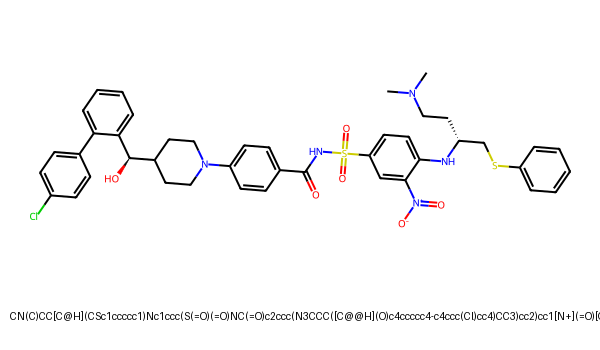

In [ ]:
from rdkit import Chem
from rdkit.Chem import Draw
from PIL import Image, ImageDraw, ImageFont

# Almacenamos la estructura smile en una variable
smiles = set_ic50_bcl2["Smiles"][0]

# La convertimos a objeto tipo mol con Rdkit
mol = Chem.MolFromSmiles(smiles)

# Usamos la funcion draw para representar la molecula y la almacenamos en una variable
img = Draw.MolToImage(mol, size=(600,300))

# Añadimos el texto de la cadena SMILE
new_img = Image.new("RGB", (600, 350), "white")
new_img.paste(img, (0, 0))

# Creamos una imagen con la representación
draw = ImageDraw.Draw(new_img)
draw.text((10, 310), smiles, fill="black")

display(new_img)

#new_img.show()


Ahora vamos a crear una función para extraer una serie de descriptores moleculares usando la librería Rdkit:

## Extracción de los descriptores moleculares con Rdkit

In [ ]:
from rdkit import RDLogger
RDLogger.DisableLog('rdApp.*')

# Extracción de todos los descriptores de rdkit

from rdkit import Chem
from rdkit.Chem import Descriptors

def get_descriptors(smiles):
    mol = Chem.MolFromSmiles(smiles)  # Convertimos el valor de SMILES en un objeto mol
    if mol:
        descriptor_values = Descriptors.CalcMolDescriptors(mol)  # Extrae todos los descriptores disponibles
        return list(descriptor_values.values())  # Retorna solo los valores de los descriptores
    else:
        # Si la molécula no puede ser creada (SMILES inválido), retornar una lista vacía
        # en lugar de None.
        print(f"Advertencia: No se pudo procesar el SMILES inválido: {smiles}")
        return []

# Aplicamos la función a cada valor de Smile en nuestro set y creamos un nuevo DataFrame
descriptor_names = list(Descriptors._descList)  # Obtiene los nombres de los descriptores
descriptores_rdkit = pd.DataFrame(set_ic50_bcl2["Smiles"].apply(get_descriptors).tolist(),
                                  columns=[name[0] for name in descriptor_names],  # Nombres de los descriptores
                                  index=set_ic50_bcl2.index)

# Agregar identificador de molécula
descriptores_rdkit = pd.concat([set_ic50_bcl2[["Molecule ChEMBL ID"]], descriptores_rdkit], axis=1)# pd.concat necesita recibir varios df en una tupla
descriptores_rdkit


,Molecule ChEMBL ID,MaxAbsEStateIndex,MaxEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,HeavyAtomMolWt,ExactMolWt,...,fr_sulfide,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea
0,CHEMBL3703599,13.360891,13.360891,0.049791,-4.449887,0.050316,14.578947,828.457,782.089,827.257804,...,1,1,0,0,0,0,0,0,0,0
1,CHEMBL3966290,13.360891,13.360891,0.049791,-4.449887,0.050316,14.578947,828.457,782.089,827.257804,...,1,1,0,0,0,0,0,0,0,0
2,CHEMBL3703600,14.092350,14.092350,0.022305,-6.088687,0.062795,14.952381,945.548,897.164,944.232575,...,1,1,1,0,0,0,0,0,0,0
3,CHEMBL3911725,14.092350,14.092350,0.022305,-6.088687,0.062795,14.952381,945.548,897.164,944.232575,...,1,1,1,0,0,0,0,0,0,0
4,CHEMBL3703616,14.358094,14.358094,0.020728,-6.101338,0.063843,17.314286,1042.709,983.237,1041.321725,...,1,1,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
872,CHEMBL4572199,10.952274,10.952274,0.618241,-0.892819,0.879810,12.578947,279.365,262.229,279.104148,...,0,0,0,0,0,0,0,1,0,0
873,CHEMBL2063880,13.681523,13.681523,0.142655,-0.846244,0.334016,15.567568,525.093,487.797,524.255419,...,0,0,0,0,0,0,0,0,0,0
874,CHEMBL106708,12.694640,12.694640,0.241539,-0.953096,0.836512,10.062500,216.211,207.139,216.058658,...,0,0,0,0,0,0,0,0,0,0
875,CHEMBL2063891,13.151686,13.151686,0.068437,-4.036613,0.153195,14.625000,584.768,548.480,584.223946,...,1,1,0,0,0,0,0,0,0,0


Ahora por ultimo unimos los descriptores con el valor de Standard Value, que como ya hemos comprobado corresponde al valor calculado de IC50 frente a BCL-2 de cada molécula.

In [ ]:
datos_BCL2=pd.concat([descriptores_rdkit,set_ic50_bcl2["Standard Value"]],axis=1)
datos_BCL2


,Molecule ChEMBL ID,MaxAbsEStateIndex,MaxEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,HeavyAtomMolWt,ExactMolWt,...,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea,Standard Value
0,CHEMBL3703599,13.360891,13.360891,0.049791,-4.449887,0.050316,14.578947,828.457,782.089,827.257804,...,1,0,0,0,0,0,0,0,0,0.3
1,CHEMBL3966290,13.360891,13.360891,0.049791,-4.449887,0.050316,14.578947,828.457,782.089,827.257804,...,1,0,0,0,0,0,0,0,0,0.3
2,CHEMBL3703600,14.092350,14.092350,0.022305,-6.088687,0.062795,14.952381,945.548,897.164,944.232575,...,1,1,0,0,0,0,0,0,0,0.3
3,CHEMBL3911725,14.092350,14.092350,0.022305,-6.088687,0.062795,14.952381,945.548,897.164,944.232575,...,1,1,0,0,0,0,0,0,0,0.3
4,CHEMBL3703616,14.358094,14.358094,0.020728,-6.101338,0.063843,17.314286,1042.709,983.237,1041.321725,...,1,1,0,0,0,0,0,0,0,0.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
872,CHEMBL4572199,10.952274,10.952274,0.618241,-0.892819,0.879810,12.578947,279.365,262.229,279.104148,...,0,0,0,0,0,0,1,0,0,164000.0
873,CHEMBL2063880,13.681523,13.681523,0.142655,-0.846244,0.334016,15.567568,525.093,487.797,524.255419,...,0,0,0,0,0,0,0,0,0,213000.0
874,CHEMBL106708,12.694640,12.694640,0.241539,-0.953096,0.836512,10.062500,216.211,207.139,216.058658,...,0,0,0,0,0,0,0,0,0,300000.0
875,CHEMBL2063891,13.151686,13.151686,0.068437,-4.036613,0.153195,14.625000,584.768,548.480,584.223946,...,1,0,0,0,0,0,0,0,0,534000.0


### Preprocesado de los descriptores moleculares

Comprobamos de que tipo son las 219 variables y si hay valores nulos

In [ ]:
datos_BCL2.info()
columna_object = datos_BCL2.select_dtypes(include=['object']).columns
print(columna_object)

# Comprobacion si hay valores nulos
print(datos_BCL2.isna().sum().any())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 877 entries, 0 to 876
Columns: 212 entries, Molecule ChEMBL ID to Standard Value
dtypes: float64(107), int64(104), object(1)
memory usage: 1.4+ MB
Index(['Molecule ChEMBL ID'], dtype='object')
False


Observamos que todas las columnas son numérica, a excepción del ChEMBL ID. Obtenemos False asi que hay **0 moléculas** con valores nulos





Una vez que hemos obtenidos los descriptores podemos continuar con el preprocesado de los datos. En primer lugar vamos a eliminar aquellas filas que esten duplicadas (mismo valor para todos los descriptores)

In [ ]:
datos_BCL2_no_dup=datos_BCL2.loc[~datos_BCL2.duplicated(subset=datos_BCL2.columns[1:-1],keep="first")]# No tenemos en cuenta el ID y el Standard Value
# En caso de que hayan duplicados, nos quedamos con el primero, ya que las moléculas estan ordenadas de menor a mayor Standard Value
print(datos_BCL2_no_dup.shape)
datos_BCL2_no_dup

(833, 212)


,Molecule ChEMBL ID,MaxAbsEStateIndex,MaxEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,HeavyAtomMolWt,ExactMolWt,...,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea,Standard Value
0,CHEMBL3703599,13.360891,13.360891,0.049791,-4.449887,0.050316,14.578947,828.457,782.089,827.257804,...,1,0,0,0,0,0,0,0,0,0.3
2,CHEMBL3703600,14.092350,14.092350,0.022305,-6.088687,0.062795,14.952381,945.548,897.164,944.232575,...,1,1,0,0,0,0,0,0,0,0.3
4,CHEMBL3703616,14.358094,14.358094,0.020728,-6.101338,0.063843,17.314286,1042.709,983.237,1041.321725,...,1,1,0,0,0,0,0,0,0,0.3
6,CHEMBL4852442,13.914224,13.914224,0.019374,-4.595073,0.046240,15.969231,917.068,861.628,916.391737,...,1,0,0,0,0,0,0,0,0,0.3
7,CHEMBL4111781,14.295305,14.295305,0.020318,-6.095009,0.058529,17.382353,1014.655,959.215,1013.290424,...,1,1,0,0,0,0,0,0,0,0.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
872,CHEMBL4572199,10.952274,10.952274,0.618241,-0.892819,0.879810,12.578947,279.365,262.229,279.104148,...,0,0,0,0,0,0,1,0,0,164000.0
873,CHEMBL2063880,13.681523,13.681523,0.142655,-0.846244,0.334016,15.567568,525.093,487.797,524.255419,...,0,0,0,0,0,0,0,0,0,213000.0
874,CHEMBL106708,12.694640,12.694640,0.241539,-0.953096,0.836512,10.062500,216.211,207.139,216.058658,...,0,0,0,0,0,0,0,0,0,300000.0
875,CHEMBL2063891,13.151686,13.151686,0.068437,-4.036613,0.153195,14.625000,584.768,548.480,584.223946,...,1,0,0,0,0,0,0,0,0,534000.0


Observamos que se han eliminados **44 moléculas** por tener todos los descriptores identicos. A continuación, para evitar problemas de multicolinealidad que puedan derivar coeficientes inestables o sobreajustes de los modelos, procederemos a eliminar aquellas columnas con una correlación superior a 0.8. Previamente estandarizaremos los datos, dejando fuera Standard Value, que se trata de la variable respuesta.

In [ ]:
from sklearn.preprocessing import StandardScaler
def estandarizar_datos(datos):
    datos_a_escalar=datos.iloc[:,1:-1] # Seleccionamos todas las columnas excepto la primera y la última
    scaler=StandardScaler()
    datos_escalados= scaler.fit_transform(datos_a_escalar)
    datos_escalados=pd.DataFrame(datos_escalados,columns=datos_a_escalar.columns,index=datos.index)
    datos_escalados=pd.concat([datos[['Molecule ChEMBL ID']], datos_escalados, datos[['Standard Value']]], axis=1)
    return datos_escalados
datos_BCL2_estandar=estandarizar_datos(datos_BCL2_no_dup)
datos_BCL2_estandar

,Molecule ChEMBL ID,MaxAbsEStateIndex,MaxEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,HeavyAtomMolWt,ExactMolWt,...,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea,Standard Value
0,CHEMBL3703599,-0.594737,-0.594737,-0.263918,-0.883716,-0.906563,-0.291169,0.156412,0.160322,0.155818,...,1.051559,-0.388083,-0.049059,0.0,-0.1536,0.0,-0.115681,-0.570179,-0.115681,0.3
2,CHEMBL3703600,0.047007,0.047007,-0.620159,-1.642252,-0.832865,-0.167623,0.482877,0.504664,0.482194,...,1.051559,2.524290,-0.049059,0.0,-0.1536,0.0,-0.115681,-0.570179,-0.115681,0.3
4,CHEMBL3703616,0.280156,0.280156,-0.640594,-1.648107,-0.826676,0.613783,0.753774,0.762223,0.753087,...,1.051559,2.524290,-0.049059,0.0,-0.1536,0.0,-0.115681,-0.570179,-0.115681,0.3
6,CHEMBL4852442,-0.109272,-0.109272,-0.658146,-0.950917,-0.930633,0.168789,0.403471,0.398329,0.404515,...,1.051559,-0.388083,-0.049059,0.0,-0.1536,0.0,-0.115681,-0.570179,-0.115681,0.3
7,CHEMBL4111781,0.225069,0.225069,-0.645919,-1.645178,-0.858060,0.636302,0.675556,0.690342,0.674876,...,1.051559,2.524290,-0.049059,0.0,-0.1536,0.0,-0.115681,-0.570179,-0.115681,0.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
872,CHEMBL4572199,-2.707930,-2.707930,7.103679,0.762711,3.992182,-0.952844,-1.374524,-1.395271,-1.373607,...,-0.890678,-0.388083,-0.049059,0.0,-0.1536,0.0,8.644494,-0.570179,-0.115681,164000.0
873,CHEMBL2063880,-0.313431,-0.313431,0.939682,0.784269,0.768886,0.035903,-0.689404,-0.720297,-0.689601,...,-0.890678,-0.388083,-0.049059,0.0,-0.1536,0.0,-0.115681,-0.570179,-0.115681,213000.0
874,CHEMBL106708,-1.179270,-1.179270,2.221296,0.734812,3.736480,-1.785379,-1.550606,-1.560118,-1.549513,...,-0.890678,-0.388083,-0.049059,0.0,-0.1536,0.0,-0.115681,-0.570179,-0.115681,300000.0
875,CHEMBL2063891,-0.778282,-0.778282,-0.022250,-0.692428,-0.298989,-0.275933,-0.523023,-0.538713,-0.522280,...,1.051559,-0.388083,-0.049059,0.0,-0.1536,0.0,-0.115681,-0.570179,-0.115681,534000.0


In [ ]:
import numpy as np

def eliminar_columnas_alta_correlacion (descriptores,threshold):
    matriz_cor= descriptores.iloc[:,1:].corr().abs() # Obtenemos la matriz de correlación en términos absolutos
    matriz_cor_superior=matriz_cor.where(np.triu(np.ones(matriz_cor.shape),k=1).astype(bool)) # Necesitamos solo la parte superior de la matriz
    #np.ones(matriz_cor.shape): Crea una matriz del mismo tamaño llena de 1s.
    #np.triu(..., k=1): Extrae la parte superior de la matriz (por encima de la diagonal principal).
    #.astype(bool): Convierte la matriz en una de True/False, donde la parte superior es True y el resto False.
    #matriz_cor.where(...): Sustituye los valores de matriz_cor donde True, y pone NaN donde False.
    #Fuente:https://stackoverflow.com/questions/17778394/list-highest-correlation-pairs-from-a-large-correlation-matrix-in-pandas
    columnas_alta_correlacion=[column for column in matriz_cor_superior.columns if any(matriz_cor_superior[column]>threshold)]
    print(columnas_alta_correlacion)
    print("Numero de columnas con alta correlación:",len(columnas_alta_correlacion))
    descriptores_correlacionados_eliminados=descriptores.drop(columns=columnas_alta_correlacion)
    return descriptores_correlacionados_eliminados

datos_BCL2_sin_columnas_corr=eliminar_columnas_alta_correlacion(datos_BCL2_estandar,0.8)
print(datos_BCL2_sin_columnas_corr.shape)

['MaxEStateIndex', 'HeavyAtomMolWt', 'ExactMolWt', 'NumValenceElectrons', 'MaxAbsPartialCharge', 'MinAbsPartialCharge', 'FpDensityMorgan2', 'FpDensityMorgan3', 'BCUT2D_LOGPLOW', 'BCUT2D_MRHI', 'BertzCT', 'Chi0', 'Chi0n', 'Chi0v', 'Chi1', 'Chi1n', 'Chi1v', 'Chi2n', 'Chi2v', 'Chi3n', 'Chi3v', 'Chi4n', 'Chi4v', 'HallKierAlpha', 'Kappa1', 'Kappa2', 'Kappa3', 'LabuteASA', 'PEOE_VSA1', 'PEOE_VSA10', 'PEOE_VSA12', 'PEOE_VSA2', 'PEOE_VSA3', 'PEOE_VSA7', 'SMR_VSA1', 'SMR_VSA10', 'SMR_VSA3', 'SMR_VSA4', 'SMR_VSA5', 'SlogP_VSA1', 'SlogP_VSA2', 'SlogP_VSA3', 'SlogP_VSA5', 'SlogP_VSA6', 'TPSA', 'EState_VSA1', 'EState_VSA10', 'VSA_EState1', 'VSA_EState10', 'VSA_EState2', 'VSA_EState3', 'VSA_EState4', 'VSA_EState5', 'VSA_EState9', 'HeavyAtomCount', 'NHOHCount', 'NOCount', 'NumAliphaticRings', 'NumAromaticCarbocycles', 'NumAromaticRings', 'NumHAcceptors', 'NumHDonors', 'NumHeteroatoms', 'NumRotatableBonds', 'NumSaturatedHeterocycles', 'NumSaturatedRings', 'MolLogP', 'MolMR', 'fr_Al_COO', 'fr_Al_OH_noT

Se han eliminado **97 columnas** altamente correlacionadas. El siguiente paso del preprocesamiento será eliminar aquellos descriptores con baja varianza, para no incluir en los modelos variables que no ayuden a discriminar entre clases.

In [ ]:
from sklearn.feature_selection import VarianceThreshold
def eliminar_baja_varianza(datos, threshold=0.1):
    datos_sin_id_respuesta=datos.iloc[:,1:-1]
    selection = VarianceThreshold(threshold)  # Se crea una instancia de VarianceThreshold con el umbral
    selection.fit(datos_sin_id_respuesta)  # Calculamos la varianza de cada columna en datos

    # Obtener las columnas que se conservan
    columnas_conservadas = datos_sin_id_respuesta.columns[selection.get_support(indices=True)]

    # Identificar las columnas eliminadas (baja varianza)
    columnas_eliminadas = [col for col in datos_sin_id_respuesta.columns if col not in columnas_conservadas]

    # Mostrar las columnas eliminadas
    if columnas_eliminadas:
        print(f"Se eliminaron {len(columnas_eliminadas)} columnas por baja varianza (< {threshold}): {columnas_eliminadas}")
    else:
        print(f"No se eliminaron columnas con baja varianza < {threshold}")

    datos_baja_varianza=pd.concat([datos[['Molecule ChEMBL ID']], datos[columnas_conservadas], datos[['Standard Value']]], axis=1)

    return datos_baja_varianza

datos_BCL2_sin_columnas_baja_var=eliminar_baja_varianza(datos_BCL2_sin_columnas_corr)
#Código basado en:https://github.com/herrynguyen1706/Selecting-the-best-molecular-descriptor/blob/main/Cleaning_Molecular_descriptors.ipynb

print(datos_BCL2_sin_columnas_baja_var.shape)

Se eliminaron 16 columnas por baja varianza (< 0.1): ['NumRadicalElectrons', 'SMR_VSA8', 'SlogP_VSA9', 'fr_C_S', 'fr_azide', 'fr_barbitur', 'fr_benzodiazepine', 'fr_epoxide', 'fr_isocyan', 'fr_isothiocyan', 'fr_lactam', 'fr_nitroso', 'fr_oxime', 'fr_prisulfonamd', 'fr_tetrazole', 'fr_thiocyan']
(833, 99)


Se han eliminado **16 columnas** por baja varianza.

## Creación de la columna actividad

A continuación, definiremos una nueva variable binaria denominada Actividad, aquellas moléculas cuyo Standard Value esté por encima de un umbral se les asignara un 0 (inactivas) y aquellas cuyo Standard Value esté por debajo de se les asignará un 1 (activas). Dicho umbral será la mediana de los datos de Standard Value.

In [ ]:
def crear_columna_binaria_actividad (datos):
    mediana=datos["Standard Value"].median()
    print("El umbral de corte de Standard Value (mediana ) es:",mediana)
    datos["Actividad"]=np.where(datos["Standard Value"]<=mediana,1,0)
    return datos

datos_BCL2_curados=crear_columna_binaria_actividad(datos_BCL2_sin_columnas_baja_var)

# Eliminamos la columna Standard Value
datos_BCL2_curados=datos_BCL2_curados.drop(columns=["Standard Value"])

# Una vez realizado todo el proceso de limpieza podemos reasignar los índices
datos_BCL2_curados.reset_index(drop=True, inplace=True)

El umbral de corte de Standard Value (mediana ) es: 68.2


## Division del conjunto en entrenamiento y prueba

Una vez tenemos el conjunto de datos curado podemos comenzar a dividir el conjunto en entrenamiento y prueba.

In [ ]:
from sklearn.model_selection import train_test_split
# En primer lugar separamos los IDs y las etiquetas
X=datos_BCL2_curados.iloc[:,1:-1]
y=datos_BCL2_curados["Actividad"]
# Realizamos una división 80/20
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=999,stratify=y)# indicamos stratify=y para mantener las clases balanceadas
# Verificamos los tamaños
print("Entrenamiento:", X_train.shape)
print("Prueba:", X_test.shape)
X_train
y_train.value_counts()

Entrenamiento: (666, 97)
Prueba: (167, 97)


Actividad
0    333
1    333
Name: count, dtype: int64

## Modelos de machine learning

### Regresion logística

Se emplearan una serie de modelos de machine learning. El primero de ellos, la regresión logística. La regresión logística es un modelo lineal que predice la probabilidad de que una muestra pertenezca a una clase (en nuestro caso, será la probabilidad de que Actividad=1).Usa una función sigmoide para transformar una combinación lineal de los descriptores en una probabilidad entre 0 y 1, y clasifica según un umbral (típicamente 0.5).

Para evaluar en primer lugar el modelo usaremos validación cruzada de 5 pliegues, de forma que cada vez que se entrena el modelo usa 4 pliegues parea entrenar y 1 para validar, para asegurarnos de que no se está produciendo un sobreajuste al conjunto de entrenamientoy obtener una estimación del rendimiento.

Se realizará tambien una busqueda de los mejores hiperparamtros mediante la función GridSearchCV. Algunos de los hiperparametros más importantes en regresión logística son:

- C (inverso de la fuerza de regularización): Controla la intensidad de la regularización. Valores pequeños de C implican una regularización más fuerte (penalizan más los coeficientes).

- Penalty(tipo de regularización): controla el tipo de penalización impuesta para evitar elñ sobreajuste. Los más comunes son  'l1' (Lasso), 'l2' (Ridge), 'elasticnet' y 'none'.

Fuentes :https://evidenciasenpediatria.es/files/41-14126-RUTA/11_Fundamentos_Regresion_logistica.pdf , https://www.datacamp.com/es/tutorial/parameter-optimization-machine-learning-models

Las metricas de evaluación seran las siguientes:

- Exactitud (Accuracy):  es el porcentaje de predicciones correctas (tanto positivas como negativas) sobre el total de muestras evaluadas. Es util cuando las clases están balanceadas, como en nuestro caso.

$$
\text{Exactitud} = \frac{TP + TN}{TP + TN + FP + FN}
$$

- Precisión (Precision): Indica qué proporción de las predicciones positivas hechas por el modelo son realmente positivas.


$$
\text{Precisión} = \frac{TP}{TP + FP}
$$

- Sensibilidad (Recall): mide la capacidad del modelo para encontrar todos los casos positivos reales.

$$
\text{Sensibilidad} = \frac{TP}{TP + FN}
$$

- F1 score: Es la media armónica entre la precisión y el recall. Busca un equilibrio entre ambas métricas.


$$
F_1 = 2 \cdot \frac{\text{Precision} \cdot \text{Recall}}{\text{Precision} + \text{Recall}}
$$


- ROC_AUC: : la curva ROC representa gráficamente la relación entre la tasa de verdaderos positivos (TPR o recall) y la tasa de falsos positivos (FPR) para diferentes umbrales de decisión. Por otro lado, el valor AUC (Área bajo la curva) valor entre 0 y 1 que resume la capacidad del modelo para distinguir entre clases. Un AUC de 1 indica un modelo perfecto; un AUC de 0.5 indica un modelo sin capacidad discriminatoria (equivalente al azar).

$$
\text{TPR} = \frac{TP}{TP + FN}
$$

$$
\text{FPR} = \frac{FP}{FP + TN}
$$

$$
\text{AUC} = \int_{0}^{1} \text{TPR}(\text{FPR}) \, d(\text{FPR})
$$

Fuente:Fuente:Lantz, B. (2015) Machine Learning with R. Mathematical & Statistical Softwar

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

def evaluar_lr(X_train, y_train, X_test, y_test):
    # Modelo base
    lr = LogisticRegression(max_iter=1000)

    # Ajuste de hiperparámetros con GridSearchCV
    param_grid = {
        'C': [0.001, 0.01, 0.1, 1, 10, 100],
        'penalty': ['l1', 'l2'],
        'solver': ['liblinear']
    }
    metricas = ['accuracy', 'precision', 'recall', 'f1', 'roc_auc']
    grid_lr = GridSearchCV(lr, param_grid, cv=5, scoring=metricas, refit='roc_auc', n_jobs=-1)# se selecciona accuracy como métrica a la hora de seleccionar el mejor modelo
    grid_lr.fit(X_train, y_train)

    # Mostrar los mejores parámetros y la exactitud (accuracy)
    print("Mejores parámetros:", grid_lr.best_params_)
    print("Mejor Exactitud (accuracy) en CV (GridSearch):", grid_lr.best_score_)

    # Extraer métricas de validación cruzada para el mejor modelo
    resultados = {
        'Mejores hiperparámetros': ', '.join([f'{k}={v}' for k, v in grid_lr.best_params_.items()]), # Por cada par (k, v) (clave, valor) en el diccionario, se crea una cadena con formato clave=valor.
        'Exactitud (CV)': f"{grid_lr.cv_results_['mean_test_accuracy'][grid_lr.best_index_]:.3f} (±{grid_lr.cv_results_['std_test_accuracy'][grid_lr.best_index_]:.3f})",
        'Precisión (CV)': f"{grid_lr.cv_results_['mean_test_precision'][grid_lr.best_index_]:.3f} (±{grid_lr.cv_results_['std_test_precision'][grid_lr.best_index_]:.3f})",
        'Sensibilidad (CV)': f"{grid_lr.cv_results_['mean_test_recall'][grid_lr.best_index_]:.3f} (±{grid_lr.cv_results_['std_test_recall'][grid_lr.best_index_]:.3f})",
        'F1-score (CV)': f"{grid_lr.cv_results_['mean_test_f1'][grid_lr.best_index_]:.3f} (±{grid_lr.cv_results_['std_test_f1'][grid_lr.best_index_]:.3f})",
        'AUC (CV)': f"{grid_lr.cv_results_['mean_test_roc_auc'][grid_lr.best_index_]:.3f} (±{grid_lr.cv_results_['std_test_roc_auc'][grid_lr.best_index_]:.3f})"
    }

    # Evaluación en el conjunto de prueba
    modelo_optimizado = grid_lr.best_estimator_
    y_pred = modelo_optimizado.predict(X_test)
    y_pred_proba = modelo_optimizado.predict_proba(X_test)[:, 1]  # Probabilidades para la clase positiva
    resultados['Exactitud (Prueba)'] = f"{accuracy_score(y_test, y_pred):.3f}"
    resultados['Precisión (Prueba)'] = f"{precision_score(y_test, y_pred):.3f}"
    resultados['Sensibilidad (Prueba)'] = f"{recall_score(y_test, y_pred):.3f}"
    resultados['F1-score (Prueba)'] = f"{f1_score(y_test, y_pred):.3f}"
    resultados['AUC (Prueba)'] = f"{roc_auc_score(y_test, y_pred_proba):.3f}"

    # Cálculo de la curva ROC para el conjunto de prueba
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

    # Visualización de la curva ROC
    fig = plt.figure()
    plt.plot(fpr, tpr, color='blue', lw=2, label=f'Curva ROC (AUC = {roc_auc_score(y_test, y_pred_proba):.3f})')
    plt.plot([0, 1], [0, 1], color='gray', lw=1, linestyle='--')  # Línea diagonal
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('Tasa de Falsos Positivos',fontsize=16)
    plt.ylabel('Tasa de Verdaderos Positivos',fontsize=16)
    plt.title('Curva ROC - Conjunto de Prueba (Regresión Logística)',fontsize=16)
    plt.legend(loc="lower right",fontsize=16)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.grid(True)

    # Tabla de resultados
    tabla_resultados = pd.DataFrame.from_dict(resultados, orient='index', columns=['Valor'])
    tabla_resultados.index.name = 'Métrica'

    return tabla_resultados, fig, modelo_optimizado

Mejores parámetros: {'C': 0.1, 'penalty': 'l2', 'solver': 'liblinear'}
Mejor Exactitud (accuracy) en CV (GridSearch): 0.9287578390273868


,Valor
Métrica,
Mejores hiperparámetros,"C=0.1, penalty=l2, solver=liblinear"
Exactitud (CV),0.857 (±0.004)
Precisión (CV),0.855 (±0.015)
Sensibilidad (CV),0.862 (±0.028)
F1-score (CV),0.858 (±0.007)
AUC (CV),0.929 (±0.017)
Exactitud (Prueba),0.844
Precisión (Prueba),0.882
Sensibilidad (Prueba),0.798


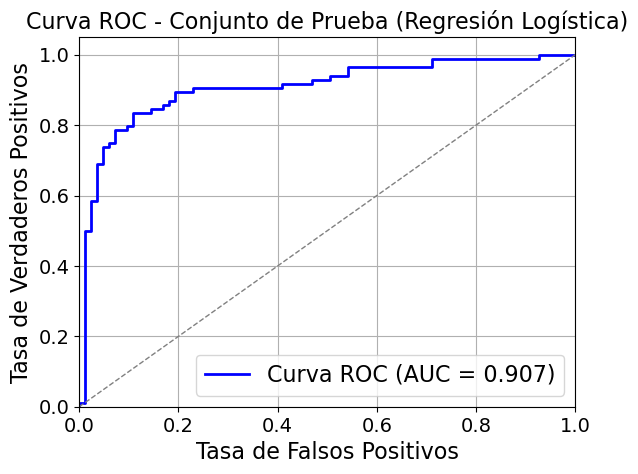

In [ ]:
# Resultados lr
resultados_lr, figura_lr, modelo_optimizado_lr = evaluar_lr(X_train, y_train, X_test, y_test)
resultados_lr

### K vecinos más cercanos



El siguiente modelo será KNN que clasifica un ejemplo según las clases de sus "k" vecinos más cercanos, usando una métrica de distancia (típicamente euclidiana).

Hiperparámetros clave:

- n_neighbors (k): Número de vecinos a considerar. Valores pequeños hacen el modelo más sensible al ruido; valores grandes lo hacen más suave.

- weights: Peso de los vecinos ('uniform' o 'distance'). 'uniform' trata a todos los vecinos igual; 'distance' da más peso a los más cercanos.

- metric: Métrica de distancia ('euclidean', 'manhattan', etc.). 'euclidean' es la más común.

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

def evaluar_knn(X_train, y_train, X_test, y_test):
    # Modelo base
    knn = KNeighborsClassifier()

    # Ajuste de hiperparámetros con GridSearchCV
    param_grid = {
        'n_neighbors': [3, 5, 7, 9, 11],
        'weights': ['uniform', 'distance'],
        'metric': ['euclidean', 'manhattan']
    }
    metricas = ['accuracy', 'precision', 'recall', 'f1', 'roc_auc']
    grid_knn = GridSearchCV(knn, param_grid, cv=5, scoring=metricas, refit='roc_auc', n_jobs=-1)
    grid_knn.fit(X_train, y_train)

    # Mostrar mejores parámetros y la exactitud (accuracy)
    print("Mejores parámetros:", grid_knn.best_params_)
    print("Mejor precisión en CV (GridSearch):", grid_knn.best_score_)

    # Extraer métricas de validación cruzada para el mejor modelo
    resultados = {
        'Mejores hiperparámetros': ', '.join([f'{k}={v}' for k, v in grid_knn.best_params_.items()]), # Por cada par (k, v) (clave, valor) en el diccionario, se crea una cadena con formato clave=valor.
        'Exactitud (CV)': f"{grid_knn.cv_results_['mean_test_accuracy'][grid_knn.best_index_]:.3f} (±{grid_knn.cv_results_['std_test_accuracy'][grid_knn.best_index_]:.3f})",
        'Precisión (CV)': f"{grid_knn.cv_results_['mean_test_precision'][grid_knn.best_index_]:.3f} (±{grid_knn.cv_results_['std_test_precision'][grid_knn.best_index_]:.3f})",
        'Sensibilidad (CV)': f"{grid_knn.cv_results_['mean_test_recall'][grid_knn.best_index_]:.3f} (±{grid_knn.cv_results_['std_test_recall'][grid_knn.best_index_]:.3f})",
        'F1-score (CV)': f"{grid_knn.cv_results_['mean_test_f1'][grid_knn.best_index_]:.3f} (±{grid_knn.cv_results_['std_test_f1'][grid_knn.best_index_]:.3f})",
        'AUC (CV)': f"{grid_knn.cv_results_['mean_test_roc_auc'][grid_knn.best_index_]:.3f} (±{grid_knn.cv_results_['std_test_roc_auc'][grid_knn.best_index_]:.3f})"
    }

    # Evaluación en el conjunto de prueba
    modelo_optimizado = grid_knn.best_estimator_
    y_pred = modelo_optimizado.predict(X_test)
    y_pred_proba = modelo_optimizado.predict_proba(X_test)[:, 1]  # Probabilidades para la clase positiva
    resultados['Exactitud (Prueba)'] = f"{accuracy_score(y_test, y_pred):.3f}"
    resultados['Precisión (Prueba)'] = f"{precision_score(y_test, y_pred):.3f}"
    resultados['Sensibilidad (Prueba)'] = f"{recall_score(y_test, y_pred):.3f}"
    resultados['F1-score (Prueba)'] = f"{f1_score(y_test, y_pred):.3f}"
    resultados['AUC (Prueba)'] = f"{roc_auc_score(y_test, y_pred_proba):.3f}"

    # Cálculo de la curva ROC para el conjunto de prueba
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

    # Visualización de la curva ROC
    fig = plt.figure()
    plt.plot(fpr, tpr, color='blue', lw=2, label=f'Curva ROC (AUC = {roc_auc_score(y_test, y_pred_proba):.3f})')
    plt.plot([0, 1], [0, 1], color='gray', lw=1, linestyle='--')  # Línea diagonal
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('Tasa de Falsos Positivos',fontsize=16)
    plt.ylabel('Tasa de Verdaderos Positivos',fontsize=16)
    plt.title('Curva ROC - Conjunto de Prueba (k-NN)',fontsize=16)
    plt.legend(loc="lower right",fontsize=16)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.grid(True)

    # Tabla de resultados
    tabla_resultados = pd.DataFrame.from_dict(resultados, orient='index', columns=['Valor'])
    tabla_resultados.index.name = 'Métrica'

    return tabla_resultados, fig, modelo_optimizado

Mejores parámetros: {'metric': 'euclidean', 'n_neighbors': 9, 'weights': 'distance'}
Mejor precisión en CV (GridSearch): 0.940105105409182


,Valor
Métrica,
Mejores hiperparámetros,"metric=euclidean, n_neighbors=9, weights=distance"
Exactitud (CV),0.866 (±0.024)
Precisión (CV),0.849 (±0.030)
Sensibilidad (CV),0.892 (±0.025)
F1-score (CV),0.870 (±0.023)
AUC (CV),0.940 (±0.026)
Exactitud (Prueba),0.862
Precisión (Prueba),0.877
Sensibilidad (Prueba),0.845


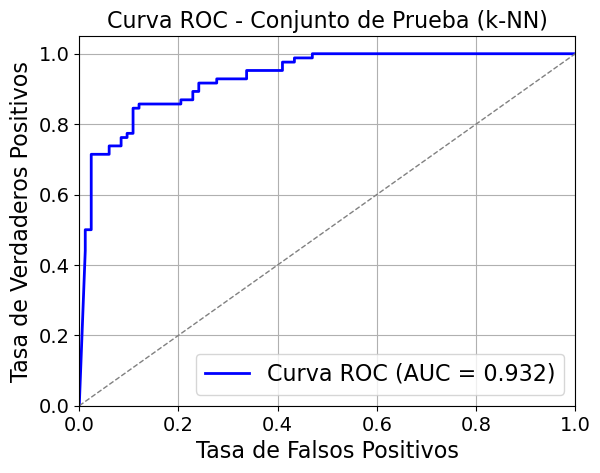

In [ ]:
# Resultados knn
resultados_knn, figura_knn, modelo_optimizado_knn= evaluar_knn(X_train, y_train, X_test, y_test)
resultados_knn

### Naive Bayes

Naive Bayes es un modelo probabilístico basado en el teorema de Bayes, que asume que los descriptores son independientes entre sí. Hay diferentes variantes de NaiveBaiyes es sckit-learn dado que los descriptores en su mayoria son variables continuas, utilizaremos el Gaussian NB.

In [ ]:
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import cross_validate
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

def evaluar_naive_bayes(X_train, y_train, X_test, y_test):
    # Modelo base
    nb = GaussianNB()

    # Validación cruzada con el modelo optimizado
    metricas = ['accuracy', 'precision', 'recall', 'f1', 'roc_auc']
    resultados_cv = cross_validate(nb, X_train, y_train, cv=5, scoring=metricas)
    resultados = {
        'Exactitud (CV)': f"{resultados_cv['test_accuracy'].mean():.3f} (±{resultados_cv['test_accuracy'].std():.3f})",
        'Precisión (CV)': f"{resultados_cv['test_precision'].mean():.3f} (±{resultados_cv['test_precision'].std():.3f})",
        'Sensibilidad (CV)': f"{resultados_cv['test_recall'].mean():.3f} (±{resultados_cv['test_recall'].std():.3f})",
        'F1-score (CV)': f"{resultados_cv['test_f1'].mean():.3f} (±{resultados_cv['test_f1'].std():.3f})",
        'AUC (CV)': f"{resultados_cv['test_roc_auc'].mean():.3f} (±{resultados_cv['test_roc_auc'].std():.3f})"
    }

    # Evaluación en el conjunto de prueba
    nb.fit(X_train, y_train)
    y_pred = nb.predict(X_test)
    y_pred_proba = nb.predict_proba(X_test)[:, 1]  # Probabilidades para la clase positiva
    y_pred_proba = nb.predict_proba(X_test)[:, 1]  # Probabilidades para la clase positiva
    resultados['Exactitud (Prueba)'] = f"{accuracy_score(y_test, y_pred):.3f}"
    resultados['Precisión (Prueba)'] = f"{precision_score(y_test, y_pred):.3f}"
    resultados['Sensibilidad (Prueba)'] = f"{recall_score(y_test, y_pred):.3f}"
    resultados['F1-score (Prueba)'] = f"{f1_score(y_test, y_pred):.3f}"
    resultados['AUC (Prueba)'] = f"{roc_auc_score(y_test, y_pred_proba):.3f}"

    # Cálculo de la curva ROC para el conjunto de prueba
    fpr, tpr, _ = roc_curve(y_test, y_pred_proba)

    # Visualización de la curva ROC
    fig = plt.figure()
    plt.plot(fpr, tpr, color='blue', lw=2, label=f'Curva ROC (AUC = {roc_auc_score(y_test, y_pred_proba):.3f})')
    plt.plot([0, 1], [0, 1], color='gray', lw=1, linestyle='--')  # Línea diagonal
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('Tasa de Falsos Positivos',fontsize=16)
    plt.ylabel('Tasa de Verdaderos Positivos',fontsize=16)
    plt.title('Curva ROC - Conjunto de Prueba (Naive Bayes)',fontsize=16)
    plt.legend(loc="lower right",fontsize=16)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.grid(True)

    # Tabla de resultados
    tabla_resultados = pd.DataFrame.from_dict(resultados, orient='index', columns=['Valor'])
    tabla_resultados.index.name = 'Métrica'

    return tabla_resultados,fig,nb

,Valor
Métrica,
Exactitud (CV),0.697 (±0.038)
Precisión (CV),0.631 (±0.030)
Sensibilidad (CV),0.955 (±0.010)
F1-score (CV),0.760 (±0.022)
AUC (CV),0.751 (±0.046)
Exactitud (Prueba),0.659
Precisión (Prueba),0.608
Sensibilidad (Prueba),0.905
F1-score (Prueba),0.727


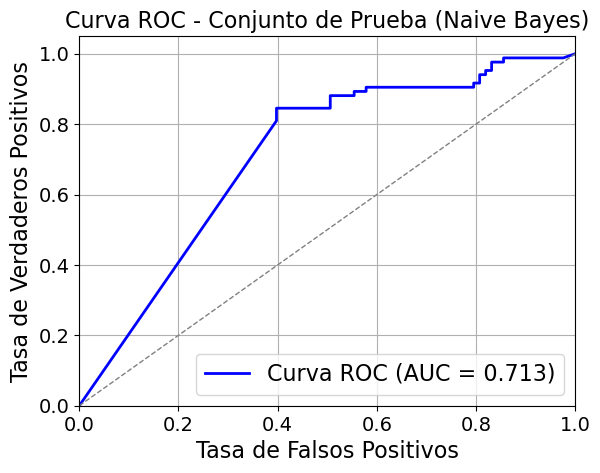

In [ ]:
# Resultados naive bayes
resultados_naive_bayes,figura_nb, modelo_optimizado_nb = evaluar_naive_bayes(X_train, y_train, X_test, y_test)
resultados_naive_bayes

### Gradient Boosting

El gradient boosting es una técnica de aprendizaje automático (machine learning) que se utiliza principalmente para tareas de regresión y clasificación. Pertenece a la familia de los métodos de ensemble, lo que significa que combina las predicciones de múltiples modelos más simples (generalmente árboles de decisión) para mejorar la precisión y la robustez del resultado final.

El gradient boosting construye un modelo predictivo de forma iterativa. En lugar de entrenar un solo modelo complejo desde el inicio, comienza con un modelo simple (como una predicción constante) y luego va añadiendo modelos adicionales que corrigen los errores del modelo anterior. Estos modelos adicionales suelen ser árboles de decisión débiles (weak learners), que individualmente no son muy precisos, pero juntos forman un modelo fuerte.

Hay que tener en cuenta la función de pérdida que cuantifica el fallo en las predicciones, que en problemas de clasificación suele ser de tipo logarítmico. Para ello indicamos la opción loss=exponential. Otros hiperparametros que se deberian tener en cuenta son:

- n_estimators: número de árboles de decisión en el ensamblado.

- lerning_rate: tasa de aprendizaje que controla la distribución en cada arbol.medida de la aportación de cada árbol al modelo final; está ligado a n_estimators. Cuanto mayor la aportación de cada árbol al ajuste del modelo final

- max_depth: profundidad máxima de cada árbol.

-min_samples_split: número mínimo de muestras necesarias para dividir un nodo.

Fuente:https://machinelearningmastery.com/gentle-introduction-gradient-boosting-algorithm-machine-learning/

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

def evaluar_gradient_boosting(X_train, y_train, X_test, y_test):
    # Modelo base
    gb = GradientBoostingClassifier(random_state=999)

    # Ajuste de hiperparámetros con GridSearchCV
    param_grid = {
        'n_estimators': [50, 100, 200],
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [3, 5, 7],
        'min_samples_split': [2, 5]
    }
    metricas = ['accuracy', 'precision', 'recall', 'f1', 'roc_auc']
    grid_gb = GridSearchCV(gb, param_grid, cv=5, scoring=metricas, refit='roc_auc', n_jobs=-1)
    grid_gb.fit(X_train, y_train)

    # Mostrar mejores parámetros y la exactitud (accuracy)
    print("Mejores parámetros:", grid_gb.best_params_)
    print("Mejor precisión en CV (GridSearch):", grid_gb.best_score_)

    # Extraer métricas de validación cruzada para el mejor modelo
    resultados = {
        'Mejores hiperparámetros': ', '.join([f'{k}={v}' for k, v in grid_gb.best_params_.items()]), # Por cada par (k, v) (clave, valor) en el diccionario, se crea una cadena con formato clave=valor.
        'Exactitud (CV)': f"{grid_gb.cv_results_['mean_test_accuracy'][grid_gb.best_index_]:.3f} (±{grid_gb.cv_results_['std_test_accuracy'][grid_gb.best_index_]:.3f})",
        'Precisión (CV)': f"{grid_gb.cv_results_['mean_test_precision'][grid_gb.best_index_]:.3f} (±{grid_gb.cv_results_['std_test_precision'][grid_gb.best_index_]:.3f})",
        'Sensibilidad (CV)': f"{grid_gb.cv_results_['mean_test_recall'][grid_gb.best_index_]:.3f} (±{grid_gb.cv_results_['std_test_recall'][grid_gb.best_index_]:.3f})",
        'F1-score (CV)': f"{grid_gb.cv_results_['mean_test_f1'][grid_gb.best_index_]:.3f} (±{grid_gb.cv_results_['std_test_f1'][grid_gb.best_index_]:.3f})",
        'AUC (CV)': f"{grid_gb.cv_results_['mean_test_roc_auc'][grid_gb.best_index_]:.3f} (±{grid_gb.cv_results_['std_test_roc_auc'][grid_gb.best_index_]:.3f})"
    }

    # Evaluación en el conjunto de prueba
    modelo_optimizado = grid_gb.best_estimator_
    y_pred = modelo_optimizado.predict(X_test)
    y_pred_proba = modelo_optimizado.predict_proba(X_test)[:, 1]  # Probabilidades para la clase positiva
    resultados['Exactitud (Prueba)'] = f"{accuracy_score(y_test, y_pred):.3f}"
    resultados['Precisión (Prueba)'] = f"{precision_score(y_test, y_pred):.3f}"
    resultados['Sensibilidad (Prueba)'] = f"{recall_score(y_test, y_pred):.3f}"
    resultados['F1-score (Prueba)'] = f"{f1_score(y_test, y_pred):.3f}"
    resultados['AUC (Prueba)'] = f"{roc_auc_score(y_test, y_pred_proba):.3f}"

    # Cálculo de la curva ROC para el conjunto de prueba
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

    # Visualización de la curva ROC
    fig = plt.figure()
    plt.plot(fpr, tpr, color='blue', lw=2, label=f'Curva ROC (AUC = {roc_auc_score(y_test, y_pred_proba):.3f})')
    plt.plot([0, 1], [0, 1], color='gray', lw=1, linestyle='--')  # Línea diagonal
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('Tasa de Falsos Positivos',fontsize=16)
    plt.ylabel('Tasa de Verdaderos Positivos',fontsize=16)
    plt.title('Curva ROC - Conjunto de Prueba (Gradient Boosting)',fontsize=16)
    plt.legend(loc="lower right",fontsize=16)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.grid(True)

    # Tabla de resultados
    tabla_resultados = pd.DataFrame.from_dict(resultados, orient='index', columns=['Valor'])
    tabla_resultados.index.name = 'Métrica'

    return tabla_resultados, fig, modelo_optimizado

Mejores parámetros: {'learning_rate': 0.2, 'max_depth': 7, 'min_samples_split': 5, 'n_estimators': 200}
Mejor precisión en CV (GridSearch): 0.9490755179327245


,Valor
Métrica,
Mejores hiperparámetros,"learning_rate=0.2, max_depth=7, min_samples_sp..."
Exactitud (CV),0.877 (±0.017)
Precisión (CV),0.884 (±0.012)
Sensibilidad (CV),0.868 (±0.031)
F1-score (CV),0.875 (±0.018)
AUC (CV),0.949 (±0.016)
Exactitud (Prueba),0.844
Precisión (Prueba),0.863
Sensibilidad (Prueba),0.821


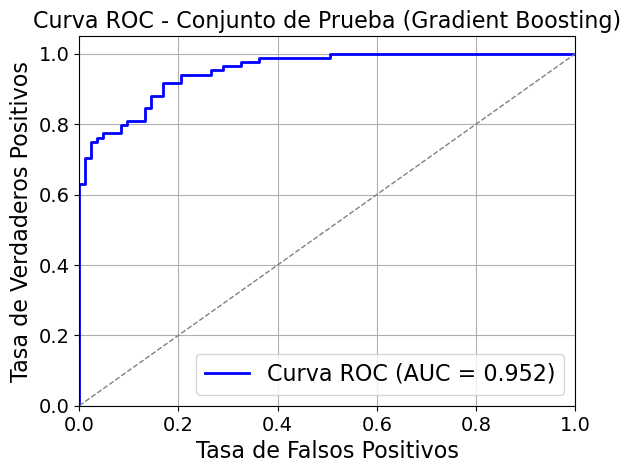

In [ ]:
# Resultados Gradient Boosting
resultados_gradient_boosting,figura_gb, modelo_optimizado_gb = evaluar_gradient_boosting(X_train, y_train, X_test, y_test)
resultados_gradient_boosting

### Support Vector Machine

SVM (Support Vector Machine) es un algoritmo de aprendizaje supervisado utilizado principalmente para clasificación, aunque también puede aplicarse a regresión. Su objetivo es encontrar el hiperplano óptimo que separe las clases en el espacio de características con el mayor margen posible.Este margen es la distancia entre el hiperplano y los puntos más cercanos de cada clase, conocidos como vectores de soporte. Existen una serie de parámetros que es muy importante controlar:

- C(parámetro de regularización): controla el equlibrio entre maximizar el margen (evitando overfitting al conjunto de entrenamiento) y minimizar los errores de clasificaciópn. C pequeño prioriza margen grande, tolerando errores. C grande penaliza más los errores, pero se ajusta mas a los datos.

- Kernel: define la función que transforma los datos para hacerlos separables en el espacio. Como los descriptores fisicoquimicos normalmente no son linealmente separables la opción más comun seria rbf aunque tambien probaremos lineal

Fuente:Lantz, B. (2015) Machine Learning with R. Mathematical & Statistical Softwar

In [ ]:
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

def evaluar_svm(X_train, y_train, X_test, y_test):
    # Modelo base
    svm = SVC(probability=True, random_state=999)  # probability=True para predict_proba

    # Ajuste de hiperparámetros con GridSearchCV
    param_grid = {
        'C': [0.1, 1.0, 10.0, 100],
        'kernel': ['linear', 'rbf'],
    }
    metricas = ['accuracy', 'precision', 'recall', 'f1', 'roc_auc']
    grid_svm = GridSearchCV(svm, param_grid, cv=5, scoring=metricas, refit='roc_auc', n_jobs=-1)
    grid_svm.fit(X_train, y_train)

    # Mostrar mejores parámetros y la exactitud (accuracy)
    print("Mejores parámetros:", grid_svm.best_params_)
    print("Mejor precisión en CV (GridSearch):", grid_svm.best_score_)

    # Extraer métricas de validación cruzada para el mejor modelo
    resultados = {
        'Mejores hiperparámetros': ', '.join([f'{k}={v}' for k, v in grid_svm.best_params_.items()]), # Por cada par (k, v) (clave, valor) en el diccionario, se crea una cadena con formato clave=valor.
        'Exactitud (CV)': f"{grid_svm.cv_results_['mean_test_accuracy'][grid_svm.best_index_]:.3f} (±{grid_svm.cv_results_['std_test_accuracy'][grid_svm.best_index_]:.3f})",
        'Precisión (CV)': f"{grid_svm.cv_results_['mean_test_precision'][grid_svm.best_index_]:.3f} (±{grid_svm.cv_results_['std_test_precision'][grid_svm.best_index_]:.3f})",
        'Sensibilidad (CV)': f"{grid_svm.cv_results_['mean_test_recall'][grid_svm.best_index_]:.3f} (±{grid_svm.cv_results_['std_test_recall'][grid_svm.best_index_]:.3f})",
        'F1-score (CV)': f"{grid_svm.cv_results_['mean_test_f1'][grid_svm.best_index_]:.3f} (±{grid_svm.cv_results_['std_test_f1'][grid_svm.best_index_]:.3f})",
        'AUC (CV)': f"{grid_svm.cv_results_['mean_test_roc_auc'][grid_svm.best_index_]:.3f} (±{grid_svm.cv_results_['std_test_roc_auc'][grid_svm.best_index_]:.3f})"
    }

    # Evaluación en el conjunto de prueba
    modelo_optimizado = grid_svm.best_estimator_
    y_pred = modelo_optimizado.predict(X_test)
    y_pred_proba = modelo_optimizado.predict_proba(X_test)[:, 1]  # Probabilidades para la clase positiva
    resultados['Exactitud (Prueba)'] = f"{accuracy_score(y_test, y_pred):.3f}"
    resultados['Precisión (Prueba)'] = f"{precision_score(y_test, y_pred):.3f}"
    resultados['Sensibilidad (Prueba)'] = f"{recall_score(y_test, y_pred):.3f}"
    resultados['F1-score (Prueba)'] = f"{f1_score(y_test, y_pred):.3f}"
    resultados['AUC (Prueba)'] = f"{roc_auc_score(y_test, y_pred_proba):.3f}"

    # Cálculo de la curva ROC para el conjunto de prueba
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

    # Visualización de la curva ROC
    fig = plt.figure()
    plt.plot(fpr, tpr, color='blue', lw=2, label=f'Curva ROC (AUC = {roc_auc_score(y_test, y_pred_proba):.3f})')
    plt.plot([0, 1], [0, 1], color='gray', lw=1, linestyle='--')  # Línea diagonal
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('Tasa de Falsos Positivos',fontsize=16)
    plt.ylabel('Tasa de Verdaderos Positivos',fontsize=16)
    plt.title('Curva ROC - Conjunto de Prueba (SVM)',fontsize=16)
    plt.legend(loc="lower right",fontsize=16)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.grid(True)

    # Tabla de resultados
    tabla_resultados = pd.DataFrame.from_dict(resultados, orient='index', columns=['Valor'])
    tabla_resultados.index.name = 'Métrica'

    return tabla_resultados, fig,modelo_optimizado

Mejores parámetros: {'C': 0.1, 'kernel': 'linear'}
Mejor precisión en CV (GridSearch): 0.9296806334676685


,Valor
Métrica,
Mejores hiperparámetros,"C=0.1, kernel=linear"
Exactitud (CV),0.868 (±0.014)
Precisión (CV),0.859 (±0.007)
Sensibilidad (CV),0.880 (±0.028)
F1-score (CV),0.869 (±0.015)
AUC (CV),0.930 (±0.016)
Exactitud (Prueba),0.856
Precisión (Prueba),0.875
Sensibilidad (Prueba),0.833


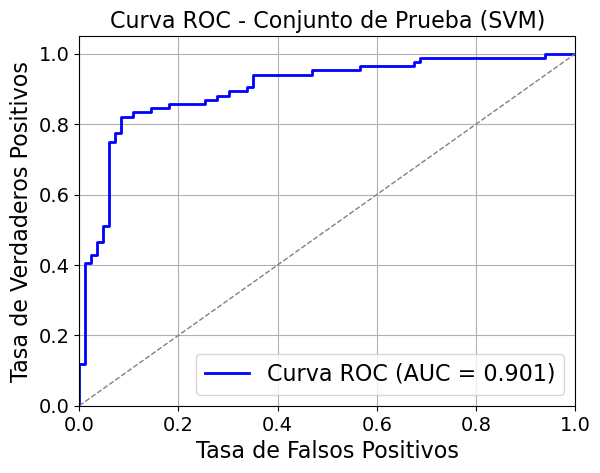

In [ ]:
# Resultados SVM
resultados_svm,figura_svm,modelo_optimizado_svm= evaluar_svm(X_train, y_train, X_test, y_test)
resultados_svm

### Random Forest

Random Forest es un algoritmo de aprendizaje supervisado basado en el ensamblaje de múltiples árboles de decisión. Funciona mediante el principio de bagging (Bootstrap Aggregating) y agrega aleatoriedad adicional para mejorar la robustez y reducir el sobreajuste. El algoritmo comienza tomando multiples submuestras aleatorias con reemplazo del conjunto de datos original, despues se entrena un arbol ded deicsion en cada submuestra, pero con una restricción: en cada división solo se considera un subconjunto aleatorio de caracteristicas y finalmente la agregacion donde se combinan las prediccines de todos los arboles, en nuestro caso dado que nos encontramos en un problema de clasificacion, se da por votación mayoritaria: la clase más votada gana.

En cuanto a diferencias con Gradient Boosting, Random Forest entrena árboles independientes en paralelo (bagging), mientras que Gradient Boosting los entrena secuencialmente para corregir errores (boosting). Random Forest es más rápido y menos propenso a sobreajustar, pero Gradient Boosting puede ser más preciso con un ajuste fino.

Los hiperparametros que se deben tener en cuenta son:

-n_estimartors: número de árboles

-max_depth: profundidad máxima de cada árbol (None es sin limite)

-min_samples_split: número mínimo de muestras requeridas para dividir un nodo

-max_features: número de caracteristicas consideradas en cada división.



In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

def evaluar_random_forest(X_train, y_train, X_test, y_test):
    # Modelo base
    rf = RandomForestClassifier(random_state=999)

    # Ajuste de hiperparámetros con GridSearchCV
    param_grid = {
        'n_estimators': [100, 200, 300],
        'max_depth': [None, 10, 20],
        'min_samples_split': [2, 5],
        'min_samples_leaf': [1, 2],
        'max_features': [0.5, 'sqrt', 'log2']
    }
    metricas = ['accuracy', 'precision', 'recall', 'f1', 'roc_auc']
    grid_rf = GridSearchCV(rf, param_grid, cv=5, scoring=metricas, refit='roc_auc', n_jobs=-1)
    grid_rf.fit(X_train, y_train)

    # Mostrar mejores parámetros y la exactitud (accuracy)
    print("Mejores parámetros:", grid_rf.best_params_)
    print("Mejor precisión en CV (GridSearch):", grid_rf.best_score_)

    # Extraer métricas de validación cruzada para el mejor modelo
    resultados = {
        'Mejores hiperparámetros': ', '.join([f'{k}={v}' for k, v in grid_rf.best_params_.items()]), # Por cada par (k, v) (clave, valor) en el diccionario, se crea una cadena con formato clave=valor.
        'Exactitud (CV)': f"{grid_rf.cv_results_['mean_test_accuracy'][grid_rf.best_index_]:.3f} (±{grid_rf.cv_results_['std_test_accuracy'][grid_rf.best_index_]:.3f})",
        'Precisión (CV)': f"{grid_rf.cv_results_['mean_test_precision'][grid_rf.best_index_]:.3f} (±{grid_rf.cv_results_['std_test_precision'][grid_rf.best_index_]:.3f})",
        'Sensibilidad (CV)': f"{grid_rf.cv_results_['mean_test_recall'][grid_rf.best_index_]:.3f} (±{grid_rf.cv_results_['std_test_recall'][grid_rf.best_index_]:.3f})",
        'F1-score (CV)': f"{grid_rf.cv_results_['mean_test_f1'][grid_rf.best_index_]:.3f} (±{grid_rf.cv_results_['std_test_f1'][grid_rf.best_index_]:.3f})",
        'AUC (CV)': f"{grid_rf.cv_results_['mean_test_roc_auc'][grid_rf.best_index_]:.3f} (±{grid_rf.cv_results_['std_test_roc_auc'][grid_rf.best_index_]:.3f})"
    }

    # Evaluación en el conjunto de prueba
    modelo_optimizado = grid_rf.best_estimator_
    y_pred = modelo_optimizado.predict(X_test)
    y_pred_proba = modelo_optimizado.predict_proba(X_test)[:, 1]  # Probabilidades para la clase positiva
    resultados['Exactitud (Prueba)'] = f"{accuracy_score(y_test, y_pred):.3f}"
    resultados['Precisión (Prueba)'] = f"{precision_score(y_test, y_pred):.3f}"
    resultados['Sensibilidad (Prueba)'] = f"{recall_score(y_test, y_pred):.3f}"
    resultados['F1-score (Prueba)'] = f"{f1_score(y_test, y_pred):.3f}"
    resultados['AUC (Prueba)'] = f"{roc_auc_score(y_test, y_pred_proba):.3f}"

    # Cálculo de la curva ROC para el conjunto de prueba
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

    # Visualización de la curva ROC
    fig = plt.figure()
    plt.plot(fpr, tpr, color='blue', lw=2, label=f'Curva ROC (AUC = {roc_auc_score(y_test, y_pred_proba):.3f})')
    plt.plot([0, 1], [0, 1], color='gray', lw=1, linestyle='--')  # Línea diagonal
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('Tasa de Falsos Positivos',fontsize=16)
    plt.ylabel('Tasa de Verdaderos Positivos',fontsize=16)
    plt.title('Curva ROC - Conjunto de Prueba (Random Forest)',fontsize=16)
    plt.legend(loc="lower right",fontsize=16)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.grid(True)

    # Tabla de resultados
    tabla_resultados = pd.DataFrame.from_dict(resultados, orient='index', columns=['Valor'])
    tabla_resultados.index.name = 'Métrica'

    return tabla_resultados, fig, modelo_optimizado


Mejores parámetros: {'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 300}
Mejor precisión en CV (GridSearch): 0.9539841498072731


,Valor
Métrica,
Mejores hiperparámetros,"max_depth=None, max_features=sqrt, min_samples..."
Exactitud (CV),0.886 (±0.015)
Precisión (CV),0.891 (±0.011)
Sensibilidad (CV),0.880 (±0.027)
F1-score (CV),0.885 (±0.016)
AUC (CV),0.954 (±0.020)
Exactitud (Prueba),0.868
Precisión (Prueba),0.897
Sensibilidad (Prueba),0.833


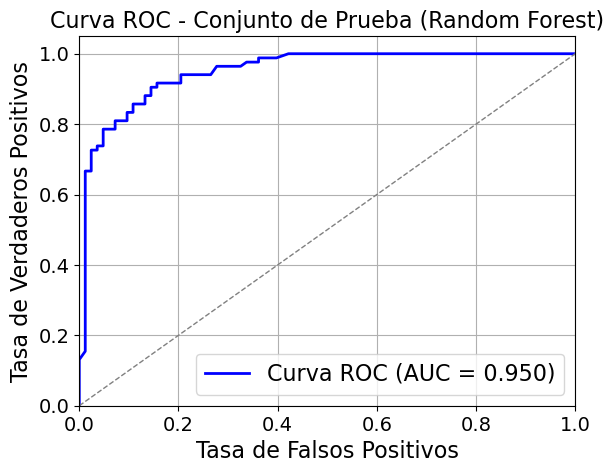

In [ ]:
# Resultados Random Forest
resultados_random_forest,figura_rf,modelo_optimizado_rf = evaluar_random_forest(X_train, y_train, X_test, y_test)
resultados_random_forest

### Red Neuronal Artificial


Una red neuronal artificial (RNA) es un modelo de aprendizaje automático inspirado en el funcionamiento del cerebro humano. Está compuesta por capas de nodos (neuronas) interconectados que procesan información mediante funciones de activación y pesos ajustables. En el contexto de la clasificación en QSAR, las redes neuronales aprenden a mapear entradas (descriptores) a salidas (clases o valores) optimizando una función de pérdida a través de un proceso iterativo como el *gradient descent*.

En cuanto a la arquitectura empleada, dado que tenemos un problema de clasificaciíon binaria utilizando datos de descriptores númericos, el modelo más recomendable sería el Perceptron Multicapa, que nos permite construir una serie de capas *fully conected*.

Dado que nuestro dataset no es demasiado extenso, podemos usar la implementación MLPClassifier proporcionada por scikit-learn, que se trata de la implementaciín de un Perceptrón Multicapa.

Parámetros a tener en cuenta:

-hidden_layer_sizes: define el número de capas ocultas y neuronas por capa. Podemos probar arquitecturas simples como una sola capa oculta con 64 neuronas (64,) o dos capas ocultas, la primera con 64 y las segunda con 32 neuronas (64, 32).

-activation: función de activación de las neuronas ocultas

En cuanto a la función de optimización usaremmos que la que viene por defecto para MLPClassifier (Adam).

Además, cuando se inicializa MLPClassifier y se entrena con la función fit, el modelo inspecciona los valores de y_train, si y_train tiene solo dos clases, MLPClassifier identifica que es un problema de clasificación binaria y configura internamente: una sola neurona en la capa de salida y una activación sigmoide para esa neurona. Así que son parametros que no nos hace falta configurar.



In [ ]:
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

def evaluar_red_neuronal(X_train, y_train, X_test, y_test):
    # Modelo base
    mlp = MLPClassifier(random_state=999, max_iter=500)  # max_iter aumentado para convergencia

    # Ajuste de hiperparámetros con GridSearchCV
    param_grid = {
        'hidden_layer_sizes': [(64,), (64, 32)],
        'activation': ['logistic','relu', 'tanh'],
        'max_iter': [500,1000],
        'alpha': [0.001, 0.01],
        'learning_rate_init': [0.001, 0.01, 0.1],
        'solver': ['adam'],
    }
    metricas = ['accuracy', 'precision', 'recall', 'f1', 'roc_auc']
    grid_mlp = GridSearchCV(mlp, param_grid, cv=5, scoring=metricas, refit='roc_auc', n_jobs=-1)
    grid_mlp.fit(X_train, y_train)

    # Mostrar mejores parámetros y la exactitud (accuracy)
    print("Mejores parámetros (MLP):", grid_mlp.best_params_)
    print("Mejor precisión en CV (MLP):", grid_mlp.best_score_)

    # Extraer métricas de validación cruzada para el mejor modelo
    resultados = {
        'Mejores hiperparámetros': ', '.join([f'{k}={v}' for k, v in grid_mlp.best_params_.items()]), # Por cada par (k, v) (clave, valor) en el diccionario, se crea una cadena con formato clave=valor.
        'Exactitud (CV)': f"{grid_mlp.cv_results_['mean_test_accuracy'][grid_mlp.best_index_]:.3f} (±{grid_mlp.cv_results_['std_test_accuracy'][grid_mlp.best_index_]:.3f})",
        'Precisión (CV)': f"{grid_mlp.cv_results_['mean_test_precision'][grid_mlp.best_index_]:.3f} (±{grid_mlp.cv_results_['std_test_precision'][grid_mlp.best_index_]:.3f})",
        'Sensibilidad (CV)': f"{grid_mlp.cv_results_['mean_test_recall'][grid_mlp.best_index_]:.3f} (±{grid_mlp.cv_results_['std_test_recall'][grid_mlp.best_index_]:.3f})",
        'F1-score (CV)': f"{grid_mlp.cv_results_['mean_test_f1'][grid_mlp.best_index_]:.3f} (±{grid_mlp.cv_results_['std_test_f1'][grid_mlp.best_index_]:.3f})",
        'AUC (CV)': f"{grid_mlp.cv_results_['mean_test_roc_auc'][grid_mlp.best_index_]:.3f} (±{grid_mlp.cv_results_['std_test_roc_auc'][grid_mlp.best_index_]:.3f})"
    }

    # Evaluación en el conjunto de prueba
    modelo_optimizado = grid_mlp.best_estimator_
    y_pred = modelo_optimizado.predict(X_test)
    y_pred_proba = modelo_optimizado.predict_proba(X_test)[:, 1]  # Probabilidades para la clase positiva
    resultados['Exactitud (Prueba)'] = f"{accuracy_score(y_test, y_pred):.3f}"
    resultados['Precisión (Prueba)'] = f"{precision_score(y_test, y_pred):.3f}"
    resultados['Sensibilidad (Prueba)'] = f"{recall_score(y_test, y_pred):.3f}"
    resultados['F1-score (Prueba)'] = f"{f1_score(y_test, y_pred):.3f}"
    resultados['AUC (Prueba)'] = f"{roc_auc_score(y_test, y_pred_proba):.3f}"

    # Cálculo de la curva ROC para el conjunto de prueba
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

    # Visualización de la curva ROC
    fig = plt.figure()
    plt.plot(fpr, tpr, color='blue', lw=2, label=f'Curva ROC (AUC = {roc_auc_score(y_test, y_pred_proba):.3f})')
    plt.plot([0, 1], [0, 1], color='gray', lw=1, linestyle='--')  # Línea diagonal
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('Tasa de Falsos Positivos',fontsize=16)
    plt.ylabel('Tasa de Verdaderos Positivos',fontsize=16)
    plt.title('Curva ROC - Conjunto de Prueba (Articial Neural Network)',fontsize=16)
    plt.legend(loc="lower right",fontsize=16)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.grid(True)

    # Tabla de resultados
    tabla_resultados = pd.DataFrame.from_dict(resultados, orient='index', columns=['Valor'])
    tabla_resultados.index.name = 'Métrica'

    return tabla_resultados, fig, modelo_optimizado

Mejores parámetros (MLP): {'activation': 'relu', 'alpha': 0.001, 'hidden_layer_sizes': (64, 32), 'learning_rate_init': 0.1, 'max_iter': 500, 'solver': 'adam'}
Mejor precisión en CV (MLP): 0.9268525081512383


,Valor
Métrica,
Mejores hiperparámetros,"activation=relu, alpha=0.001, hidden_layer_siz..."
Exactitud (CV),0.853 (±0.020)
Precisión (CV),0.864 (±0.037)
Sensibilidad (CV),0.841 (±0.040)
F1-score (CV),0.851 (±0.019)
AUC (CV),0.927 (±0.023)
Exactitud (Prueba),0.838
Precisión (Prueba),0.901
Sensibilidad (Prueba),0.762


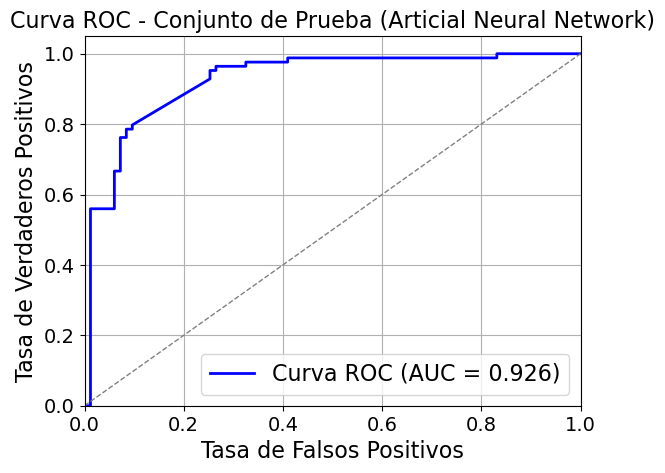

In [ ]:
# Resultados red neuronal
resultados_red_neuronal,figura_rn, modelo_optimizado = evaluar_red_neuronal(X_train, y_train, X_test, y_test)
resultados_red_neuronal

### Resultados finales para todos los modelos

In [ ]:
resultados_finales_BCL2=pd.concat([resultados_lr,resultados_knn,resultados_naive_bayes,resultados_gradient_boosting,resultados_svm,resultados_random_forest,resultados_red_neuronal],axis=1)
resultados_finales_BCL2.columns=['Regresión Logística','KNN','Naive Bayes','Gradient Boosting','SVM','Random Forest','Artificial Neural Network']
resultados_finales_BCL2



,Regresión Logística,KNN,Naive Bayes,Gradient Boosting,SVM,Random Forest,Artificial Neural Network
Métrica,,,,,,,
Mejores hiperparámetros,"C=0.1, penalty=l2, solver=liblinear","metric=euclidean, n_neighbors=9, weights=distance",NaN,"learning_rate=0.2, max_depth=7, min_samples_sp...","C=0.1, kernel=linear","max_depth=None, max_features=sqrt, min_samples...","activation=relu, alpha=0.001, hidden_layer_siz..."
Exactitud (CV),0.857 (±0.004),0.866 (±0.024),0.697 (±0.038),0.877 (±0.017),0.868 (±0.014),0.886 (±0.015),0.853 (±0.020)
Precisión (CV),0.855 (±0.015),0.849 (±0.030),0.631 (±0.030),0.884 (±0.012),0.859 (±0.007),0.891 (±0.011),0.864 (±0.037)
Sensibilidad (CV),0.862 (±0.028),0.892 (±0.025),0.955 (±0.010),0.868 (±0.031),0.880 (±0.028),0.880 (±0.027),0.841 (±0.040)
F1-score (CV),0.858 (±0.007),0.870 (±0.023),0.760 (±0.022),0.875 (±0.018),0.869 (±0.015),0.885 (±0.016),0.851 (±0.019)
AUC (CV),0.929 (±0.017),0.940 (±0.026),0.751 (±0.046),0.949 (±0.016),0.930 (±0.016),0.954 (±0.020),0.927 (±0.023)
Exactitud (Prueba),0.844,0.862,0.659,0.844,0.856,0.868,0.838
Precisión (Prueba),0.882,0.877,0.608,0.863,0.875,0.897,0.901
Sensibilidad (Prueba),0.798,0.845,0.905,0.821,0.833,0.833,0.762


# Pipeline inicial para MCL-1





## Carga de los datos y exploracion inicial

Ahora realizamos el mismo flujo de trabajo para MCL-1. Primero cargamos los datos:

In [ ]:
set_mcl1= pd.read_csv("C:/Users/jorge/Desktop/proyecto_TFM/data/set_MCL-1.csv", sep=";")
set_mcl1
print(set_mcl1.shape)

(1887, 48)


Comprobamos si las variables importantes se encuentran en el set descargado

In [ ]:
columnas_requeridas = [
    "Molecule ChEMBL ID", "Standard Type", "Standard Relation",
    "Standard Value", "Standard Units", "Smiles",
    "Target ChEMBL ID", "Target Name", "Target Organism", "Target Type"
]
faltantes = [col for col in columnas_requeridas if col not in set_mcl1.columns]
if faltantes:
    print("Columnas requeridas faltantes:", faltantes)
else:
    print("Todas las columnas requeridas están presentes.")

Todas las columnas requeridas están presentes.


Vamos a comprobar y seleccionar todas las moléculas que presentan como Standard Type el parámetro IC50 y como Target Name

In [ ]:
set_ic50_mcl1= set_mcl1[
    (set_mcl1["Standard Type"] == "IC50") &
    (set_mcl1["Target Name"] == "Induced myeloid leukemia cell differentiation protein Mcl-1")
]
print(set_ic50_mcl1.shape[0])

1887


Vamos a comprobar si la unidad de todos los standard value es nM

In [ ]:
(set_ic50_mcl1["Standard Units"]=="nM").all()

np.False_

Observamos que las **1887** moléculas cumplían los requisitos.

## Primeros pasos del preprocesado o exploración incial

Ahora vamos a filtrar aquellas moleculas que no presenten valores nulos en Standard Type y Smile,

In [ ]:
set_ic50_mcl1= set_ic50_mcl1[
    (set_ic50_mcl1["Standard Value"].notna())&
    (set_ic50_mcl1["Smiles"].notna())
]
set_ic50_mcl1.reset_index(drop=True, inplace=True)
print(set_ic50_mcl1.shape[0])
set_ic50_mcl1

1875


,Molecule ChEMBL ID,Molecule Name,Molecule Max Phase,Molecular Weight,#RO5 Violations,AlogP,Compound Key,Smiles,Standard Type,Standard Relation,...,Document ChEMBL ID,Source ID,Source Description,Document Journal,Document Year,Cell ChEMBL ID,Properties,Action Type,Standard Text Value,Value
0,CHEMBL1824806,NaN,NaN,429.50,1.0,5.26,11,O=C(NS(=O)(=O)c1ccc(Oc2ccccc2)cc1)c1ccc(-c2ccc...,IC50,'=',...,CHEMBL1821700,1,Scientific Literature,J Med Chem,2011.0,NaN,NaN,NaN,NaN,3.56
1,CHEMBL1824808,NaN,NaN,498.39,1.0,6.57,13,O=C(NS(=O)(=O)c1ccc(Oc2ccccc2)cc1)c1ccc(-c2cc(...,IC50,'=',...,CHEMBL1821700,1,Scientific Literature,J Med Chem,2011.0,NaN,NaN,NaN,NaN,5.08
2,CHEMBL1824811,NaN,NaN,511.52,2.0,6.07,15,O=C(NS(=O)(=O)c1ccc(COc2ccccc2)cc1)c1cccc(-c2c...,IC50,'=',...,CHEMBL1821700,1,Scientific Literature,J Med Chem,2011.0,NaN,NaN,NaN,NaN,8.37
3,CHEMBL1824817,NaN,NaN,498.39,1.0,6.57,20,O=C(NS(=O)(=O)c1ccc(Oc2ccccc2)cc1)c1cccc(-c2cc...,IC50,'=',...,CHEMBL1821700,1,Scientific Literature,J Med Chem,2011.0,NaN,NaN,NaN,NaN,7.11
4,CHEMBL1824816,NaN,NaN,429.50,1.0,5.26,19,O=C(NS(=O)(=O)c1ccc(Oc2ccccc2)cc1)c1cccc(-c2cc...,IC50,'=',...,CHEMBL1821700,1,Scientific Literature,J Med Chem,2011.0,NaN,NaN,NaN,NaN,3.24
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1870,CHEMBL4163417,NaN,NaN,589.46,NaN,NaN,55,Cc1c(-c2cccc3c(CCCOc4cccc5ccccc45)c(C(=O)O)[nH...,IC50,'=',...,CHEMBL5113375,1,Scientific Literature,Eur J Med Chem,2021.0,NaN,NaN,INHIBITOR,NaN,162.00
1871,CHEMBL6466,COUMARIN,4.0,146.14,0.0,1.79,Cumarin,O=c1ccc2ccccc2o1,IC50,'=',...,CHEMBL4699656,1,Scientific Literature,Bioorg Med Chem,2021.0,NaN,TIME = 0.5 hr,INHIBITOR,NaN,24.38
1872,CHEMBL12208,HYMECROMONE,2.0,176.17,0.0,1.81,29,Cc1cc(=O)oc2cc(O)ccc12,IC50,'=',...,CHEMBL4699656,1,Scientific Literature,Bioorg Med Chem,2021.0,NaN,TIME = 0.5 hr,INHIBITOR,NaN,103.70
1873,CHEMBL4162415,NaN,NaN,594.76,2.0,6.36,10,CCc1nn(C)c(CC)c1-c1cccc2c(CCCOc3cccc4ccccc34)c...,IC50,'=',...,CHEMBL5223124,1,Scientific Literature,RSC Med Chem,2022.0,NaN,NaN,INHIBITOR,NaN,5.96


Había **12 moléculas** que no cumplían los requisitos.
A continuación, extraeremos los descriptores moleculares a partir de las estructuras smiles mediante la función que habiamos diseñado anteriormente.

Vamos a comprobar si existen entradas que presentan el mismo ID

In [ ]:
set_ic50_mcl1["Molecule ChEMBL ID"].value_counts().head()

Molecule ChEMBL ID
CHEMBL51483      5
CHEMBL3265288    4
CHEMBL376408     4
CHEMBL1269107    4
CHEMBL4449176    4
Name: count, dtype: int64

Vamos a observan si presentan diferentes valores de standard value:

In [ ]:
set_ic50_mcl1[set_ic50_mcl1['Molecule ChEMBL ID'] == 'CHEMBL51483']["Standard Value"]

1718    1523.1
1743    4800.0
1834     170.0
1841    1520.0
1853     856.0
Name: Standard Value, dtype: float64

Observamos que hay hasta **5** entradas diferentes para el mismo ID. De entre todas las que presentan el mismo ID, vamos a quedarnos con aquella molécula que presenta el menor valor de Standard Value:

In [ ]:
set_ic50_mcl1=set_ic50_mcl1.sort_values(by="Standard Value").drop_duplicates(subset="Molecule ChEMBL ID", keep="first")
set_ic50_mcl1.reset_index(drop=True, inplace=True)
print("El número de moléculas se ha reducido a:", set_ic50_mcl1.shape[0])
print(set_ic50_mcl1["Molecule ChEMBL ID"].value_counts().head())
set_ic50_mcl1[set_ic50_mcl1['Molecule ChEMBL ID'] == 'CHEMBL51483']["Standard Value"]

El número de moléculas se ha reducido a: 1761
Molecule ChEMBL ID
CHEMBL2314370    1
CHEMBL2314379    1
CHEMBL3126336    1
CHEMBL2314378    1
CHEMBL1359564    1
Name: count, dtype: int64


110    170.0
Name: Standard Value, dtype: float64

Se han eliminado un total de **114 moléculas** con ID duplicado

## Generación de descriptores moleculares con Rdkit

In [ ]:
# Aplicamos la función a cada valor de Smile en nuestro set y creamos un nuevo DataFrame
descriptor_names = list(Descriptors._descList)  # Obtiene los nombres de los descriptores
descriptores_rdkit_mcl1 = pd.DataFrame(set_ic50_mcl1["Smiles"].apply(get_descriptors).tolist(),
                                  columns=[name[0] for name in descriptor_names],  # Nombres de los descriptores
                                  index=set_ic50_mcl1.index)

# Agregar identificador de molécula
descriptores_rdkit_mcl1 = pd.concat([set_ic50_mcl1[["Molecule ChEMBL ID"]], descriptores_rdkit_mcl1], axis=1)# pd.concat necesita recibir varios df en una tupla

# Unimos los descriptores con el valor de Standard Value
datos_MCL1=pd.concat([descriptores_rdkit_mcl1,set_ic50_mcl1["Standard Value"]],axis=1)
datos_MCL1

,Molecule ChEMBL ID,MaxAbsEStateIndex,MaxEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,HeavyAtomMolWt,ExactMolWt,...,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea,Standard Value
0,CHEMBL4443085,12.389596,12.389596,0.232038,-0.961607,0.154061,11.534884,593.753,558.473,593.246061,...,0,0,0,0,0,0,0,0,0,0.042
1,CHEMBL5174729,13.356331,13.356331,0.031469,-3.884665,0.403908,33.285714,613.220,571.892,612.242471,...,1,0,0,0,0,0,0,0,0,0.060
2,CHEMBL4553660,13.963341,13.963341,0.100297,-4.296634,0.399850,29.464286,814.446,757.998,813.353812,...,0,0,0,0,0,0,0,0,0,0.200
3,CHEMBL4535151,13.909719,13.909719,0.055549,-4.313841,0.421610,27.925926,786.392,733.976,785.322512,...,0,0,0,0,0,0,0,0,0,0.200
4,CHEMBL4580244,13.971314,13.971314,0.072874,-4.319894,0.393700,29.758621,862.512,806.064,861.320798,...,0,1,0,0,0,0,0,0,0,0.200
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1756,CHEMBL4439276,14.287327,14.287327,0.060736,-4.484452,0.102113,14.578947,829.273,791.977,828.211994,...,0,0,0,0,0,0,1,0,0,1000000.000
1757,CHEMBL1824802,12.843805,12.843805,0.006022,-4.030827,0.433785,11.000000,443.524,422.356,443.119129,...,1,0,0,0,0,0,0,0,0,1000000.000
1758,CHEMBL1824810,12.615202,12.615202,0.018113,-3.996065,0.453505,10.967742,429.497,410.345,429.103479,...,1,0,0,0,0,0,0,0,0,1000000.000
1759,CHEMBL395653,11.527685,11.527685,0.377963,-0.377963,0.585203,14.000000,182.178,176.130,182.036779,...,0,0,0,0,0,0,0,0,0,1425000.000


### Preprocesado de descriptores moleculares

Comprobamos el tipo de las variables y si hay valores nulos.

In [ ]:
datos_MCL1.info()
datos_MCL1.select_dtypes(include=['object']).columns

# Comprobacion si hay valores nulos
print(datos_MCL1.isna().sum().any())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1761 entries, 0 to 1760
Columns: 212 entries, Molecule ChEMBL ID to Standard Value
dtypes: float64(107), int64(104), object(1)
memory usage: 2.8+ MB
True


Observamos que hay valores nulos, vamos a explorar donde se encuentran.

In [ ]:
nulos_por_columna = datos_MCL1.isna().sum()
print("Nulos por columna:")
print(nulos_por_columna[nulos_por_columna > 0])
nulos_por_fila = datos_MCL1.isna().sum(axis=1)
print("\nNulos por fila:")
print(nulos_por_fila[nulos_por_fila > 0])

Nulos por columna:
BCUT2D_MWHI       4
BCUT2D_MWLOW      4
BCUT2D_CHGHI      4
BCUT2D_CHGLO      4
BCUT2D_LOGPHI     4
BCUT2D_LOGPLOW    4
BCUT2D_MRHI       4
BCUT2D_MRLOW      4
dtype: int64

Nulos por fila:
649     8
952     8
1395    8
1465    8
dtype: int64


Observamos que hay 4 ejemplos que presenteban valores nulos en 8 columnas. Dado que contamos con muchos mas ejemplos que descriptores eliminaremos dichas filas.

In [ ]:
datos_MCL1_sin_desc_nulos=datos_MCL1.dropna(axis=0)
# Comprobacion si hay valores nulos
print(datos_MCL1_sin_desc_nulos.isna().sum().any())
datos_MCL1_sin_desc_nulos.reset_index(drop=True, inplace=True)
datos_MCL1_sin_desc_nulos.shape

False


(1757, 212)

Ahora eliminamos moleculas que presentan los mismos valores para todos los descriptores

In [ ]:
datos_MCL1_no_dup = datos_MCL1_sin_desc_nulos.loc[~datos_MCL1_sin_desc_nulos.duplicated(subset=datos_MCL1_sin_desc_nulos.columns[1:-1], keep="first")]
# No tenemos en cuenta el ID y el Standard Value
# En caso de que hayan duplicados, nos quedamos con el primero, ya que las moléculas estan ordenadas de menor a mayor Standard Value
datos_MCL1_no_dup.reset_index(drop=True, inplace=True)
datos_MCL1_no_dup.shape

(1746, 212)

Se han eliminado un total de 11 moléculas que presentaban el mismo valor para todos los descriptores

Como suponiamos del proceso anterior no hay filas duplicadas. Ahora estandarizamos los datos y eliminamos columnas con alta correlación:





In [ ]:
datos_MCL1_estandar=estandarizar_datos(datos_MCL1_no_dup)
datos_MCL1_sin_columnas_corr=eliminar_columnas_alta_correlacion(datos_MCL1_estandar,0.8)
datos_MCL1_sin_columnas_corr.shape

['MaxEStateIndex', 'HeavyAtomMolWt', 'ExactMolWt', 'NumValenceElectrons', 'MaxAbsPartialCharge', 'MinAbsPartialCharge', 'FpDensityMorgan2', 'FpDensityMorgan3', 'BertzCT', 'Chi0', 'Chi0n', 'Chi0v', 'Chi1', 'Chi1n', 'Chi1v', 'Chi2n', 'Chi2v', 'Chi3n', 'Chi3v', 'Chi4n', 'Chi4v', 'HallKierAlpha', 'Kappa1', 'Kappa2', 'Kappa3', 'LabuteASA', 'PEOE_VSA1', 'PEOE_VSA12', 'PEOE_VSA2', 'SMR_VSA1', 'SMR_VSA3', 'SMR_VSA5', 'SlogP_VSA1', 'SlogP_VSA2', 'SlogP_VSA3', 'SlogP_VSA5', 'SlogP_VSA6', 'TPSA', 'EState_VSA1', 'EState_VSA10', 'EState_VSA2', 'VSA_EState1', 'VSA_EState10', 'VSA_EState2', 'VSA_EState5', 'VSA_EState6', 'HeavyAtomCount', 'NHOHCount', 'NOCount', 'NumAliphaticRings', 'NumHAcceptors', 'NumHDonors', 'NumHeteroatoms', 'NumRotatableBonds', 'NumSaturatedRings', 'MolMR', 'fr_Al_OH_noTert', 'fr_Ar_OH', 'fr_COO', 'fr_COO2', 'fr_C_O', 'fr_C_O_noCOO', 'fr_NH1', 'fr_NH2', 'fr_Nhpyrrole', 'fr_amide', 'fr_aniline', 'fr_benzene', 'fr_guanido', 'fr_ketone_Topliss', 'fr_nitro_arom', 'fr_phenol', 'fr_p

(1746, 137)

Observamos que se han eliminado 75 columnas con alta correlación.

Ahora eliminaremos aquellos descriptores con baja varianza

In [ ]:
datos_MCL1_sin_columnas_baja_var=eliminar_baja_varianza(datos_MCL1_sin_columnas_corr)
datos_MCL1_sin_columnas_baja_var.shape

Se eliminaron 14 columnas por baja varianza (< 0.1): ['NumRadicalElectrons', 'SMR_VSA8', 'SlogP_VSA9', 'fr_diazo', 'fr_dihydropyridine', 'fr_isocyan', 'fr_isothiocyan', 'fr_lactam', 'fr_nitroso', 'fr_phos_acid', 'fr_phos_ester', 'fr_prisulfonamd', 'fr_quatN', 'fr_thiocyan']


(1746, 123)

## Creación de la columna actividad

Creamos la columna actividad

In [ ]:
datos_MCL1_curados=crear_columna_binaria_actividad(datos_MCL1_sin_columnas_baja_var)

# Eliminamos la columna Standard Value
datos_MCL1_curados=datos_MCL1_curados.drop(columns=["Standard Value"])

# Una vez realizado todo el proceso de limpieza podemos reasignar los índices
datos_MCL1_curados.reset_index(drop=True, inplace=True)

datos_MCL1_curados

El umbral de corte de Standard Value (mediana ) es: 3802.6099999999997


,Molecule ChEMBL ID,MaxAbsEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,MaxPartialCharge,MinPartialCharge,FpDensityMorgan1,...,fr_pyridine,fr_sulfide,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiophene,fr_unbrch_alkane,fr_urea,Actividad
0,CHEMBL4443085,0.155221,0.680907,0.223993,-1.508005,-0.550035,0.605077,0.983874,-0.553398,-0.449257,...,-0.41787,1.793173,-0.150597,-0.023939,-0.071982,-0.303299,-0.340817,-0.125033,-0.20739,1
1,CHEMBL5174729,0.687324,-0.672668,-1.595477,-0.350620,4.519956,0.683989,-0.295246,-0.519371,0.409467,...,-0.41787,-0.454408,-0.150597,-0.023939,-0.071982,-0.303299,-0.340817,-0.125033,-0.20739,1
2,CHEMBL4553660,1.021430,-0.208168,-1.851909,-0.369417,3.629203,1.499687,0.266658,-0.519377,0.328491,...,-0.41787,-0.454408,-0.150597,-0.023939,-0.071982,-0.303299,-0.340817,-0.125033,-0.20739,1
3,CHEMBL4535151,0.991917,-0.510164,-1.862620,-0.268616,3.270620,1.385966,0.266658,-0.519377,0.349485,...,-0.41787,-0.454408,-0.150597,-0.023939,-0.071982,-0.303299,-0.340817,-0.125033,-0.20739,1
4,CHEMBL4580244,1.025819,-0.393238,-1.866388,-0.397908,3.697811,1.694529,0.266658,-0.519377,0.308945,...,-0.41787,-0.454408,5.825352,-0.023939,-0.071982,-0.303299,-0.340817,-0.125033,-0.20739,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1741,CHEMBL4439276,1.199757,-0.475157,-1.968818,-1.748645,0.159518,1.559791,1.791010,-0.523015,-0.079231,...,-0.41787,-0.454408,-0.150597,-0.023939,-0.071982,-0.303299,2.742426,-0.125033,-0.20739,0
1742,CHEMBL1824802,0.405223,-0.844406,-1.686456,-0.212216,-0.674714,-0.003898,-0.283322,-0.499162,-1.513717,...,-0.41787,-0.454408,-0.150597,-0.023939,-0.071982,-0.303299,-0.340817,-0.125033,-0.20739,0
1743,CHEMBL1824810,0.279397,-0.762804,-1.664819,-0.120867,-0.682233,-0.060758,-0.292461,-0.073480,-1.993697,...,-0.41787,-0.454408,-0.150597,-0.023939,-0.071982,-0.303299,-0.340817,-0.125033,-0.20739,0
1744,CHEMBL395653,-0.319186,1.665708,0.587286,0.489207,0.024569,-1.063301,-0.741263,2.255638,-1.533961,...,-0.41787,-0.454408,-0.150597,-0.023939,-0.071982,-0.303299,-0.340817,-0.125033,-0.20739,0


## Division del conjunto entrenamiento y prueba

Dividimos en entrenamiento y prueba:

In [ ]:
from sklearn.model_selection import train_test_split
# En primer lugar separamos los IDs y las etiquetas
X_MCL1=datos_MCL1_curados.iloc[:,1:-1]
y_MCL1=datos_MCL1_curados["Actividad"]
# Realizamos una división 80/20
X_train_MCL1,X_test_MCL1,y_train_MCL1,y_test_MCL1=train_test_split(X_MCL1,y_MCL1,test_size=0.2,random_state=999,stratify=y_MCL1)# indicamos stratify=y para mantener las clases balanceadas
# Verificamos los tamaños
print("Entrenamiento:", X_train_MCL1.shape)
print("Prueba:", X_test_MCL1.shape)
X_train_MCL1


Entrenamiento: (1396, 121)
Prueba: (350, 121)


,MaxAbsEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,MaxPartialCharge,MinPartialCharge,FpDensityMorgan1,BCUT2D_MWHI,...,fr_piperzine,fr_pyridine,fr_sulfide,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiophene,fr_unbrch_alkane,fr_urea
1243,0.158122,-0.605609,0.137258,0.161188,-0.843506,-0.055196,0.738286,-0.575588,0.230761,0.324301,...,-0.218287,-0.41787,-0.454408,-0.150597,-0.023939,-0.071982,-0.303299,-0.340817,-0.125033,-0.20739
729,0.128053,1.350669,0.459456,1.244821,-0.796328,-0.543903,0.791409,-0.145627,0.747455,-0.893492,...,-0.218287,1.45771,-0.454408,-0.150597,-0.023939,-0.071982,-0.303299,-0.340817,-0.125033,-0.20739
112,0.494403,-0.837997,-2.111064,-0.508915,-0.275124,0.415460,1.914211,-0.374849,0.279905,0.324301,...,-0.218287,-0.41787,-0.454408,-0.150597,-0.023939,-0.071982,-0.303299,2.742426,-0.125033,-0.20739
1479,0.020590,-0.440896,0.781585,2.067528,0.080067,-0.665261,-0.428569,1.085442,-0.454279,-0.918390,...,-0.218287,-0.41787,-0.454408,-0.150597,-0.023939,-0.071982,-0.303299,-0.340817,-0.125033,-0.20739
1151,0.147275,0.040027,0.737228,-0.080446,-0.714902,-0.154113,-0.731520,-0.144393,-0.394710,0.110460,...,-0.218287,-0.41787,1.793173,-0.150597,-0.023939,-0.071982,-0.303299,-0.340817,-0.125033,-0.20739
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
989,-0.089727,-0.368213,0.246648,0.894384,0.257663,-0.170470,0.293467,-0.552513,1.219229,0.110466,...,-0.218287,-0.41787,1.793173,-0.150597,-0.023939,-0.071982,-0.303299,-0.340817,-0.125033,-0.20739
1145,0.335661,-0.202876,0.510899,-0.369081,-0.295936,0.085428,-0.481925,-0.122364,0.470199,0.110463,...,-0.218287,-0.41787,1.793173,-0.150597,-0.023939,-0.071982,-0.303299,2.742426,-0.125033,-0.20739
1549,-0.002974,0.055498,0.564150,0.613434,-0.799585,-0.271778,0.374495,-0.605143,-0.562247,-0.893507,...,-0.218287,-0.41787,-0.454408,-0.150597,-0.023939,-0.071982,-0.303299,-0.340817,-0.125033,-0.20739
633,-0.377566,0.429212,0.551017,0.237255,-0.243058,-0.324634,0.338119,-0.549886,-0.574243,-0.891517,...,-0.218287,-0.41787,-0.454408,-0.150597,-0.023939,-0.071982,-0.303299,-0.340817,-0.125033,-0.20739


A continuacion procedemos a entrenar todos los algoritmos con las funciones que habiamos implementado anteriormente

## Modelos de machine learning

Mejores parámetros: {'C': 0.01, 'penalty': 'l2', 'solver': 'liblinear'}
Mejor Exactitud (accuracy) en CV (GridSearch): 0.696035824401703


,Valor
Métrica,
Mejores hiperparámetros,"C=0.01, penalty=l2, solver=liblinear"
Exactitud (CV),0.643 (±0.020)
Precisión (CV),0.651 (±0.024)
Sensibilidad (CV),0.618 (±0.032)
F1-score (CV),0.633 (±0.021)
AUC (CV),0.696 (±0.031)
Exactitud (Prueba),0.637
Precisión (Prueba),0.650
Sensibilidad (Prueba),0.594


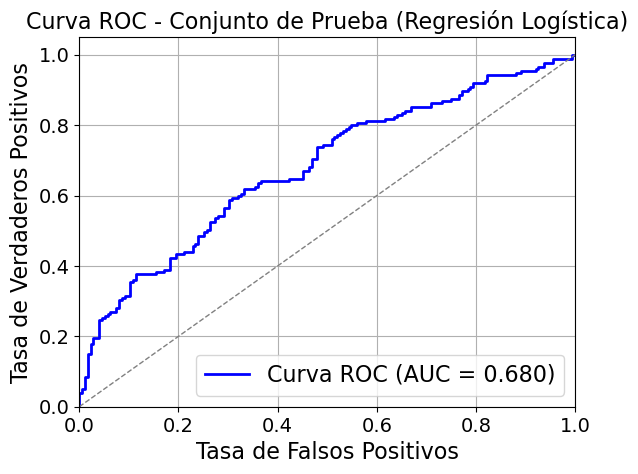

In [ ]:
# Regresion logistica
resultados_lr_MCL1,figura_rl_mcl1, modelo_optimizado_lr_MCL1 = evaluar_lr(X_train_MCL1, y_train_MCL1, X_test_MCL1, y_test_MCL1)
resultados_lr_MCL1

Mejores parámetros: {'metric': 'manhattan', 'n_neighbors': 11, 'weights': 'distance'}
Mejor precisión en CV (GridSearch): 0.7269828219057408


,Valor
Métrica,
Mejores hiperparámetros,"metric=manhattan, n_neighbors=11, weights=dist..."
Exactitud (CV),0.652 (±0.024)
Precisión (CV),0.649 (±0.029)
Sensibilidad (CV),0.668 (±0.034)
F1-score (CV),0.657 (±0.022)
AUC (CV),0.727 (±0.034)
Exactitud (Prueba),0.634
Precisión (Prueba),0.627
Sensibilidad (Prueba),0.663


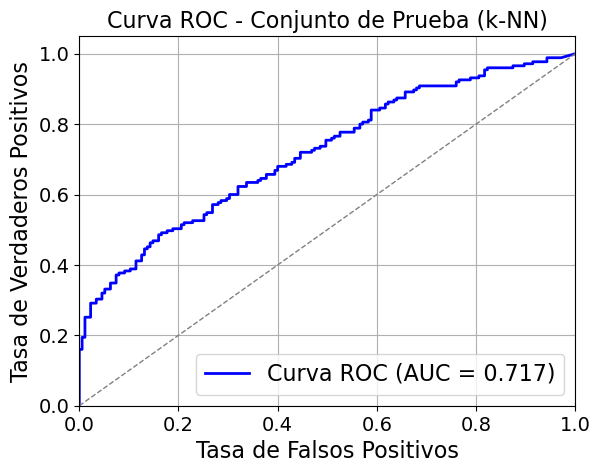

In [ ]:
# Knn
resultados_knn_MCL1,figura_knn_mcl1,modelo_optimizado_knn_MCL1  = evaluar_knn(X_train_MCL1, y_train_MCL1, X_test_MCL1, y_test_MCL1)
resultados_knn_MCL1

,Valor
Métrica,
Exactitud (CV),0.697 (±0.038)
Precisión (CV),0.631 (±0.030)
Sensibilidad (CV),0.955 (±0.010)
F1-score (CV),0.760 (±0.022)
AUC (CV),0.751 (±0.046)
Exactitud (Prueba),0.659
Precisión (Prueba),0.608
Sensibilidad (Prueba),0.905
F1-score (Prueba),0.727


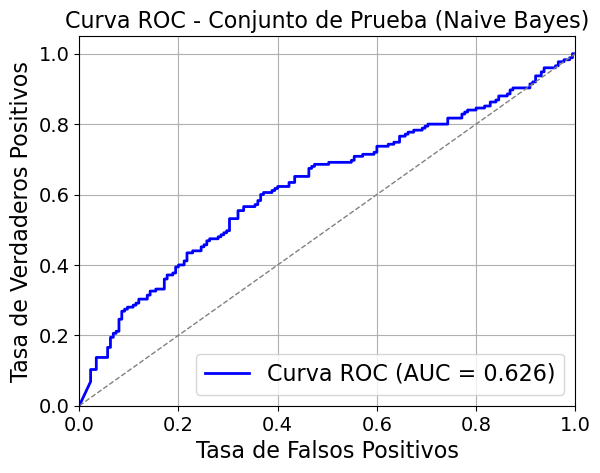

In [ ]:
# Naive Bayes
resultados_naive_bayes_MCL1,figura_nb_mcl1,modelo_optimizado_nb_MCL1  = evaluar_naive_bayes(X_train_MCL1, y_train_MCL1, X_test_MCL1, y_test_MCL1)
resultados_naive_bayes

Mejores parámetros: {'learning_rate': 0.2, 'max_depth': 7, 'min_samples_split': 2, 'n_estimators': 100}
Mejor precisión en CV (GridSearch): 0.7389496402877699


,Valor
Métrica,
Mejores hiperparámetros,"learning_rate=0.2, max_depth=7, min_samples_sp..."
Exactitud (CV),0.673 (±0.017)
Precisión (CV),0.673 (±0.023)
Sensibilidad (CV),0.678 (±0.020)
F1-score (CV),0.675 (±0.014)
AUC (CV),0.739 (±0.026)
Exactitud (Prueba),0.640
Precisión (Prueba),0.640
Sensibilidad (Prueba),0.640


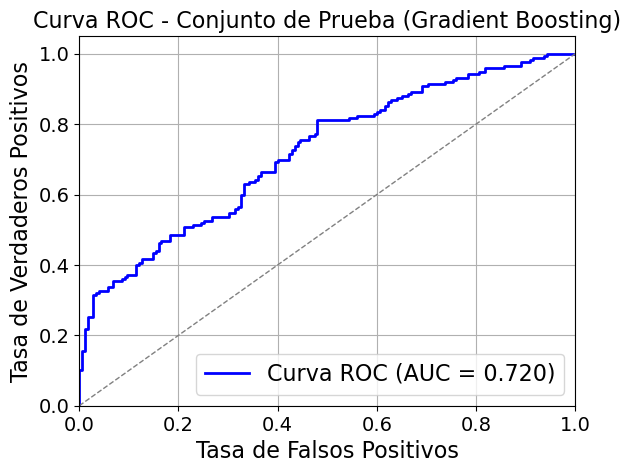

In [ ]:
# Gradient Boosting
resultados_gradient_boosting_MCL1,figura_gb_mcl1,modelo_optimizado_nb_MCL1  = evaluar_gradient_boosting(X_train_MCL1, y_train_MCL1, X_test_MCL1, y_test_MCL1)
resultados_gradient_boosting_MCL1

Mejores parámetros: {'C': 1.0, 'kernel': 'rbf'}
Mejor precisión en CV (GridSearch): 0.7248237410071942


,Valor
Métrica,
Mejores hiperparámetros,"C=1.0, kernel=rbf"
Exactitud (CV),0.667 (±0.020)
Precisión (CV),0.673 (±0.023)
Sensibilidad (CV),0.650 (±0.031)
F1-score (CV),0.661 (±0.022)
AUC (CV),0.725 (±0.024)
Exactitud (Prueba),0.634
Precisión (Prueba),0.652
Sensibilidad (Prueba),0.577


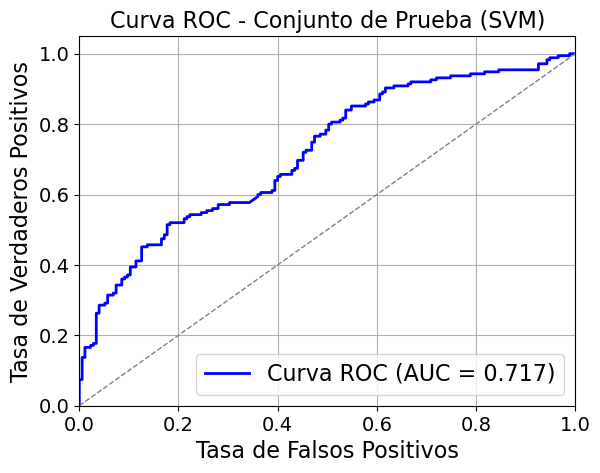

In [ ]:
# SVM
resultados_svm_MCL1,figura_svm_mcl1,modelo_optimizado_svm_MCL1  = evaluar_svm(X_train_MCL1, y_train_MCL1, X_test_MCL1, y_test_MCL1)
resultados_svm_MCL1

Mejores parámetros: {'max_depth': 10, 'max_features': 0.5, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 300}
Mejor precisión en CV (GridSearch): 0.7452658199970635


,Valor
Métrica,
Mejores hiperparámetros,"max_depth=10, max_features=0.5, min_samples_le..."
Exactitud (CV),0.678 (±0.018)
Precisión (CV),0.687 (±0.023)
Sensibilidad (CV),0.658 (±0.019)
F1-score (CV),0.672 (±0.017)
AUC (CV),0.745 (±0.017)
Exactitud (Prueba),0.660
Precisión (Prueba),0.661
Sensibilidad (Prueba),0.657


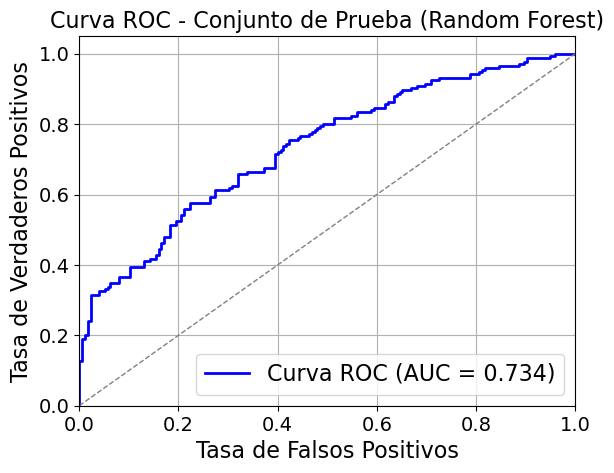

In [ ]:
# Random Forest
resultados_random_forest_MCL1,figura_rf_mcl1,modelo_optimizado_rf_MCL1  = evaluar_random_forest(X_train_MCL1, y_train_MCL1, X_test_MCL1, y_test_MCL1)
resultados_random_forest_MCL1

Mejores parámetros (MLP): {'activation': 'relu', 'alpha': 0.01, 'hidden_layer_sizes': (64,), 'learning_rate_init': 0.01, 'max_iter': 500, 'solver': 'adam'}
Mejor precisión en CV (MLP): 0.7055287769784172


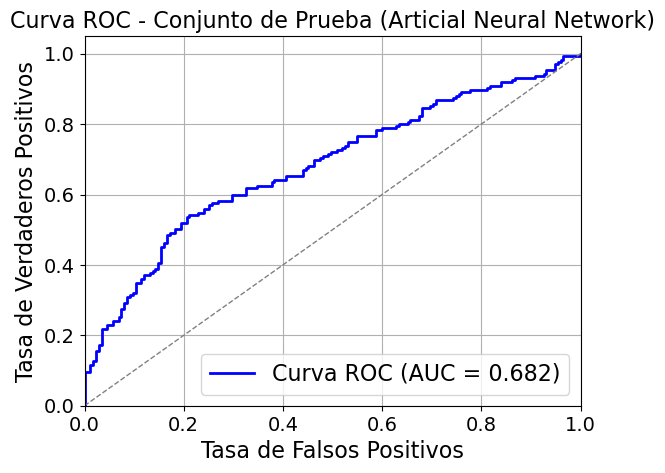

In [ ]:
# Artificial Neural Network
resultados_red_neuronal_MCL1,figura_rn_mcl1,modelo_optimizado_rn_MCL1  = evaluar_red_neuronal(X_train_MCL1, y_train_MCL1, X_test_MCL1, y_test_MCL1)

In [ ]:
resultados_red_neuronal_MCL1

,Valor
Métrica,
Mejores hiperparámetros,"activation=relu, alpha=0.01, hidden_layer_size..."
Exactitud (CV),0.637 (±0.027)
Precisión (CV),0.632 (±0.031)
Sensibilidad (CV),0.659 (±0.023)
F1-score (CV),0.645 (±0.022)
AUC (CV),0.706 (±0.032)
Exactitud (Prueba),0.629
Precisión (Prueba),0.626
Sensibilidad (Prueba),0.640


### Resultados finales

A continuación, se presenta la tabla con los resultados finales:

In [ ]:
resultados_finales_MCL1=pd.concat([resultados_lr_MCL1,resultados_knn_MCL1,resultados_naive_bayes_MCL1,resultados_gradient_boosting_MCL1,resultados_svm_MCL1,resultados_random_forest_MCL1,resultados_red_neuronal_MCL1],axis=1)
resultados_finales_MCL1.columns=['Regresión Logística','KNN','Naive Bayes','Gradient Boosting','SVM','Random Forest','Artificial Neural Network']
resultados_finales_MCL1

,Regresión Logística,KNN,Naive Bayes,Gradient Boosting,SVM,Random Forest,Artificial Neural Network
Métrica,,,,,,,
Mejores hiperparámetros,"C=0.01, penalty=l2, solver=liblinear","metric=manhattan, n_neighbors=11, weights=dist...",NaN,"learning_rate=0.2, max_depth=7, min_samples_sp...","C=1.0, kernel=rbf","max_depth=10, max_features=0.5, min_samples_le...","activation=relu, alpha=0.01, hidden_layer_size..."
Exactitud (CV),0.643 (±0.020),0.652 (±0.024),0.577 (±0.029),0.673 (±0.017),0.667 (±0.020),0.678 (±0.018),0.637 (±0.027)
Precisión (CV),0.651 (±0.024),0.649 (±0.029),0.641 (±0.070),0.673 (±0.023),0.673 (±0.023),0.687 (±0.023),0.632 (±0.031)
Sensibilidad (CV),0.618 (±0.032),0.668 (±0.034),0.490 (±0.317),0.678 (±0.020),0.650 (±0.031),0.658 (±0.019),0.659 (±0.023)
F1-score (CV),0.633 (±0.021),0.657 (±0.022),0.478 (±0.191),0.675 (±0.014),0.661 (±0.022),0.672 (±0.017),0.645 (±0.022)
AUC (CV),0.696 (±0.031),0.727 (±0.034),0.646 (±0.027),0.739 (±0.026),0.725 (±0.024),0.745 (±0.017),0.706 (±0.032)
Exactitud (Prueba),0.637,0.634,0.594,0.640,0.634,0.660,0.629
Precisión (Prueba),0.650,0.627,0.670,0.640,0.652,0.661,0.626
Sensibilidad (Prueba),0.594,0.663,0.371,0.640,0.577,0.657,0.640


## Pipeline manteniendo el 25 % de los datos para MCL-1

Observamos que los resultados para las métricas no son demasiado buenos, vamos a observar a explorar con mayor detenemiento la variable Standard Value

In [ ]:
datos_MCL1_sin_columnas_baja_var["Standard Value"].describe().round(2)

count       1746.00
mean       16448.30
std        88694.67
min            0.04
25%         1792.08
50%         3802.61
75%         8697.50
max      2725000.00
Name: Standard Value, dtype: float64

Podemos observar que la mediana de MCL-1 es considerablemente superior a la mediana de BCL(68.2) y a la mediana de BCL-XL (283), por lo que si establecemos la mediana como umbral estaremos clasificando multitud de moléculas con un valor de alto de IC50 como activas que estarán introduciendo multitud de ruido al modelo. Por tanto, una estrategia que se adoptará será quedarnos con el 30 % de las moléculas para entrenar el modelo.

In [ ]:
import pandas as pd

def eliminar_porcentaje_ic50_alto(df, porcentaje_eliminar):

    percentil = 1 - porcentaje_eliminar
    punto_de_corte = df['Standard Value'].quantile(percentil)

    # Filtrar moléculas con IC50 menor o igual al umbral
    df_filtrado = df[df['Standard Value'] <= punto_de_corte].copy()
    mediana = df_filtrado['Standard Value'].median()
    cuartil_25 = df_filtrado['Standard Value'].quantile(0.25)

    # Calcular estadísticas
    moleculas_eliminadas = df.shape[0] - df_filtrado.shape[0]
    moleculas_restantes = df_filtrado.shape[0]

    print(f"Porcentaje eliminado: {porcentaje_eliminar*100}%")
    print(f"El punto de corte para la eliminación de un IC50 superior ha sido: {punto_de_corte:.2f} nM")
    print(f"Moléculas eliminadas: {moleculas_eliminadas}")
    print(f"Moléculas restantes: {moleculas_restantes}")
    print(f"Mediana de las moleculas restantes es: {mediana:.2f} nM")
    print(f"Cuartil 25 de las moleculas restantes es: {cuartil_25:.2f} nM")

    return df_filtrado

datos_MCL1_del_no_dup= eliminar_porcentaje_ic50_alto(datos_MCL1_no_dup, porcentaje_eliminar=0.7)

Porcentaje eliminado: 70.0%
El punto de corte para la eliminación de un IC50 superior ha sido: 2238.80 nM
Moléculas eliminadas: 1222
Moléculas restantes: 524
Mediana de las moleculas restantes es: 1077.55 nM
Cuartil 25 de las moleculas restantes es: 320.75 nM


In [ ]:
# Estandarizamos los datos
datos_MCL1_del_estandar=estandarizar_datos(datos_MCL1_del_no_dup)
# Eliminamos columnas con alta correlación
datos_MCL1_del_sin_columnas_corr=eliminar_columnas_alta_correlacion(datos_MCL1_del_estandar,0.8)
# Eliminamos columnas con baja varianza
datos_MCL1_del_sin_columnas_baja_var=eliminar_baja_varianza(datos_MCL1_del_sin_columnas_corr)
datos_MCL1_del_sin_columnas_baja_var.shape

['MaxEStateIndex', 'HeavyAtomMolWt', 'ExactMolWt', 'NumValenceElectrons', 'MaxAbsPartialCharge', 'MinAbsPartialCharge', 'FpDensityMorgan2', 'FpDensityMorgan3', 'BertzCT', 'Chi0', 'Chi0n', 'Chi0v', 'Chi1', 'Chi1n', 'Chi1v', 'Chi2n', 'Chi2v', 'Chi3n', 'Chi3v', 'Chi4n', 'Chi4v', 'HallKierAlpha', 'Kappa1', 'Kappa2', 'Kappa3', 'LabuteASA', 'PEOE_VSA1', 'PEOE_VSA10', 'PEOE_VSA12', 'PEOE_VSA2', 'PEOE_VSA7', 'SMR_VSA1', 'SMR_VSA10', 'SMR_VSA2', 'SMR_VSA3', 'SMR_VSA4', 'SMR_VSA5', 'SlogP_VSA1', 'SlogP_VSA2', 'SlogP_VSA3', 'SlogP_VSA5', 'SlogP_VSA6', 'TPSA', 'EState_VSA1', 'EState_VSA10', 'EState_VSA2', 'VSA_EState1', 'VSA_EState10', 'VSA_EState2', 'VSA_EState3', 'VSA_EState4', 'VSA_EState5', 'HeavyAtomCount', 'NHOHCount', 'NOCount', 'NumAliphaticRings', 'NumHAcceptors', 'NumHDonors', 'NumHeteroatoms', 'NumRotatableBonds', 'NumSaturatedRings', 'MolLogP', 'MolMR', 'fr_Al_COO', 'fr_Al_OH_noTert', 'fr_Ar_OH', 'fr_COO', 'fr_COO2', 'fr_C_O', 'fr_C_O_noCOO', 'fr_NH1', 'fr_NH2', 'fr_Nhpyrrole', 'fr_ami

(524, 112)

In [ ]:
datos_MCL1_del_curados=crear_columna_binaria_actividad(datos_MCL1_del_sin_columnas_baja_var)

# Eliminamos la columna Standard Value
datos_MCL1_del_curados=datos_MCL1_del_curados.drop(columns=["Standard Value"])

# Una vez realizado todo el proceso de limpieza podemos reasignar los índices
datos_MCL1_del_curados.reset_index(drop=True, inplace=True)

datos_MCL1_del_curados

El umbral de corte de Standard Value (mediana ) es: 1077.55


,Molecule ChEMBL ID,MaxAbsEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,MaxPartialCharge,MinPartialCharge,FpDensityMorgan1,...,fr_pyridine,fr_sulfide,fr_sulfonamd,fr_sulfone,fr_tetrazole,fr_thiazole,fr_thiophene,fr_unbrch_alkane,fr_urea,Actividad
0,CHEMBL4443085,-0.077639,0.899779,0.352697,-1.142036,-0.635399,0.133731,0.831997,-0.497095,-0.173545,...,-0.401968,1.999370,-0.484309,-0.153093,-0.087706,-0.263950,-0.357927,-0.201679,-0.1595,1
1,CHEMBL5174729,0.552254,-0.660498,-1.343632,-0.021349,3.644525,0.187091,-0.388859,-0.456913,0.606514,...,-0.401968,-0.454189,1.781564,-0.153093,-0.087706,-0.263950,-0.357927,-0.201679,-0.1595,1
2,CHEMBL4553660,0.947761,-0.125065,-1.582708,-0.039551,2.892580,0.738660,0.147450,-0.456920,0.532956,...,-0.401968,-0.454189,-0.484309,-0.153093,-0.087706,-0.263950,-0.357927,-0.201679,-0.1595,1
3,CHEMBL4535151,0.912823,-0.473178,-1.592694,0.058055,2.589876,0.661762,0.147450,-0.456920,0.552026,...,-0.401968,-0.454189,-0.484309,-0.153093,-0.087706,-0.263950,-0.357927,-0.201679,-0.1595,1
4,CHEMBL4580244,0.952956,-0.338397,-1.596207,-0.067138,2.950497,0.870410,0.147450,-0.456920,0.515200,...,-0.401968,-0.454189,-0.484309,6.531973,-0.087706,-0.263950,-0.357927,-0.201679,-0.1595,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
519,CHEMBL3126319,-0.918339,-0.018643,0.240232,1.458361,-0.871829,-0.615695,0.649459,-0.722135,-0.496859,...,-0.401968,-0.454189,-0.484309,-0.153093,-0.087706,-0.263950,-0.357927,-0.201679,-0.1595,0
520,CHEMBL5092376,1.299411,-0.813570,-0.144780,-1.759269,0.084198,2.348174,0.469484,-0.309425,-2.270428,...,-0.401968,-0.454189,-0.484309,-0.153093,-0.087706,-0.263950,-0.357927,-0.201679,-0.1595,0
521,CHEMBL3952474,0.558047,0.999646,0.768635,-0.144753,-0.700137,-0.272686,-0.504770,-0.015569,-0.103106,...,3.462823,-0.454189,-0.484309,-0.153093,-0.087706,-0.263950,-0.357927,-0.201679,-0.1595,0
522,CHEMBL3940844,0.523023,1.181341,0.755081,-0.196904,-0.710835,-0.261686,-0.504755,0.293449,-0.231603,...,3.462823,-0.454189,-0.484309,-0.153093,-0.087706,2.742781,-0.357927,-0.201679,-0.1595,0


Dividimos en entrenamiento y prueba:

In [ ]:
from sklearn.model_selection import train_test_split
# En primer lugar separamos los IDs y las etiquetas
X_MCL1_del=datos_MCL1_del_curados.iloc[:,1:-1]
y_MCL1_del=datos_MCL1_del_curados["Actividad"]
# Realizamos una división 80/20
X_train_MCL1_del,X_test_MCL1_del,y_train_MCL1_del,y_test_MCL1_del=train_test_split(X_MCL1_del,y_MCL1_del,test_size=0.2,random_state=999,stratify=y_MCL1_del)# indicamos stratify=y para mantener la proporcion de clases
# Verificamos los tamaños
print("Entrenamiento:", X_train_MCL1_del.shape)
print("Prueba:", X_test_MCL1_del.shape)
print(y_train_MCL1_del.value_counts())

Entrenamiento: (419, 110)
Prueba: (105, 110)
Actividad
1    210
0    209
Name: count, dtype: int64


### Modelos de machine learning

Mejores parámetros: {'C': 0.1, 'penalty': 'l1', 'solver': 'liblinear'}
Mejor Exactitud (accuracy) en CV (GridSearch): 0.8098694762457829


,Valor
Métrica,
Mejores hiperparámetros,"C=0.1, penalty=l1, solver=liblinear"
Exactitud (CV),0.759 (±0.035)
Precisión (CV),0.777 (±0.055)
Sensibilidad (CV),0.733 (±0.038)
F1-score (CV),0.753 (±0.034)
AUC (CV),0.810 (±0.008)
Exactitud (Prueba),0.695
Precisión (Prueba),0.692
Sensibilidad (Prueba),0.692


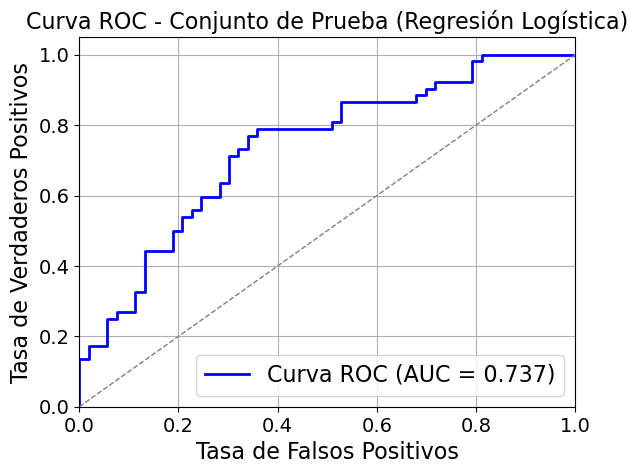

In [ ]:
# Regresion logistica
resultados_lr_MCL1_del,figura_rl_mcl1_del,modelo_optimizado_rl_mcl1_del = evaluar_lr(X_train_MCL1_del, y_train_MCL1_del, X_test_MCL1_del, y_test_MCL1_del)
resultados_lr_MCL1_del

Mejores parámetros: {'metric': 'manhattan', 'n_neighbors': 7, 'weights': 'distance'}
Mejor precisión en CV (GridSearch): 0.846875172833361


,Valor
Métrica,
Mejores hiperparámetros,"metric=manhattan, n_neighbors=7, weights=distance"
Exactitud (CV),0.766 (±0.023)
Precisión (CV),0.769 (±0.037)
Sensibilidad (CV),0.767 (±0.035)
F1-score (CV),0.767 (±0.020)
AUC (CV),0.847 (±0.015)
Exactitud (Prueba),0.714
Precisión (Prueba),0.683
Sensibilidad (Prueba),0.788


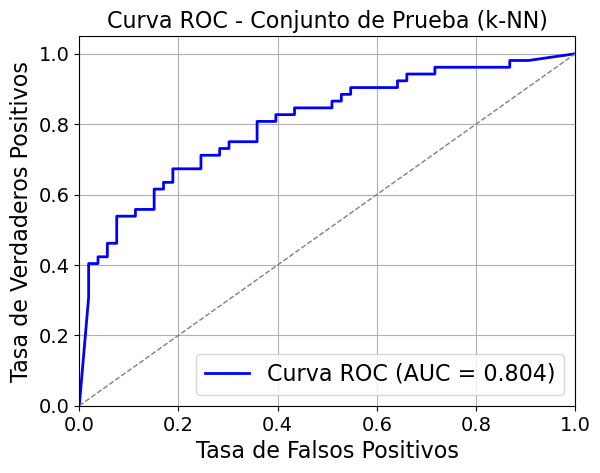

In [ ]:
# Knn
resultados_knn_MCL1_del,figura_knn_mcl1_del,modelo_optimizado_knn_mcl1_del = evaluar_knn(X_train_MCL1_del, y_train_MCL1_del, X_test_MCL1_del, y_test_MCL1_del)
resultados_knn_MCL1_del

,Valor
Métrica,
Exactitud (CV),0.640 (±0.042)
Precisión (CV),0.592 (±0.036)
Sensibilidad (CV),0.924 (±0.023)
F1-score (CV),0.721 (±0.021)
AUC (CV),0.726 (±0.034)
Exactitud (Prueba),0.552
Precisión (Prueba),0.529
Sensibilidad (Prueba),0.885
F1-score (Prueba),0.662


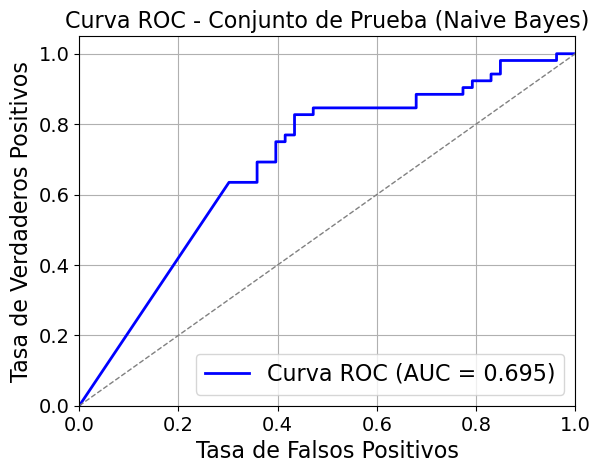

In [ ]:
# Naive Bayes
resultados_naive_bayes_MCL1_del,figura_nb_mcl1_del,modelo_optimizado_nb_mcl1_del = evaluar_naive_bayes(X_train_MCL1_del, y_train_MCL1_del, X_test_MCL1_del, y_test_MCL1_del)
resultados_naive_bayes_MCL1_del

Mejores parámetros: {'learning_rate': 0.2, 'max_depth': 7, 'min_samples_split': 2, 'n_estimators': 100}
Mejor precisión en CV (GridSearch): 0.8511890935235883


,Valor
Métrica,
Mejores hiperparámetros,"learning_rate=0.2, max_depth=7, min_samples_sp..."
Exactitud (CV),0.776 (±0.009)
Precisión (CV),0.789 (±0.029)
Sensibilidad (CV),0.757 (±0.028)
F1-score (CV),0.772 (±0.006)
AUC (CV),0.851 (±0.012)
Exactitud (Prueba),0.724
Precisión (Prueba),0.717
Sensibilidad (Prueba),0.731


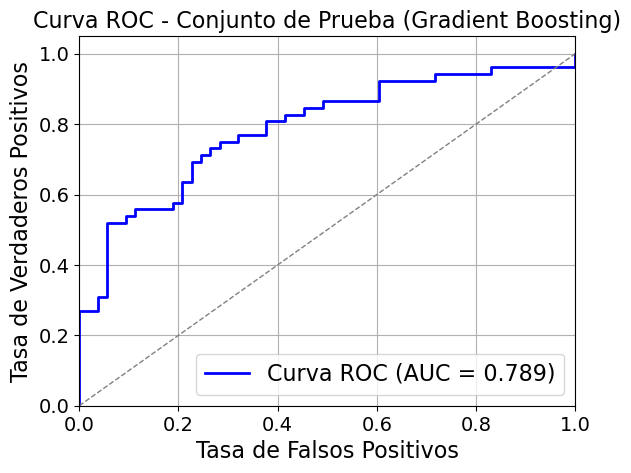

In [ ]:
# Gradient Boosting
resultados_gradient_boosting_MCL1_del,figura_gb_mcl1_del,modelo_optimizado_gb_mcl1_del = evaluar_gradient_boosting(X_train_MCL1_del, y_train_MCL1_del, X_test_MCL1_del, y_test_MCL1_del)
resultados_gradient_boosting_MCL1_del

Mejores parámetros: {'C': 1.0, 'kernel': 'rbf'}
Mejor precisión en CV (GridSearch): 0.8185526243017532


,Valor
Métrica,
Mejores hiperparámetros,"C=1.0, kernel=rbf"
Exactitud (CV),0.764 (±0.032)
Precisión (CV),0.800 (±0.025)
Sensibilidad (CV),0.705 (±0.063)
F1-score (CV),0.748 (±0.042)
AUC (CV),0.819 (±0.013)
Exactitud (Prueba),0.714
Precisión (Prueba),0.704
Sensibilidad (Prueba),0.731


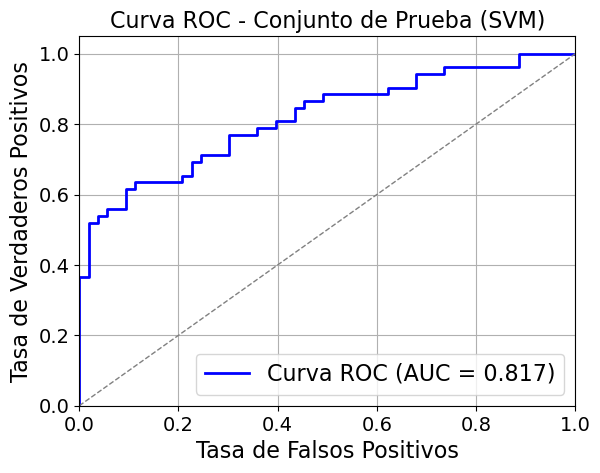

In [ ]:
# SVM
resultados_svm_MCL1_del,figura_svm_mcl1_del,modelo_optimizado_svm_mcl1_del = evaluar_svm(X_train_MCL1_del, y_train_MCL1_del, X_test_MCL1_del, y_test_MCL1_del)
resultados_svm_MCL1_del

Mejores parámetros: {'max_depth': 20, 'max_features': 'log2', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 300}
Mejor precisión en CV (GridSearch): 0.8660859465737515


,Valor
Métrica,
Mejores hiperparámetros,"max_depth=20, max_features=log2, min_samples_l..."
Exactitud (CV),0.788 (±0.025)
Precisión (CV),0.822 (±0.036)
Sensibilidad (CV),0.738 (±0.058)
F1-score (CV),0.776 (±0.033)
AUC (CV),0.866 (±0.015)
Exactitud (Prueba),0.724
Precisión (Prueba),0.695
Sensibilidad (Prueba),0.788


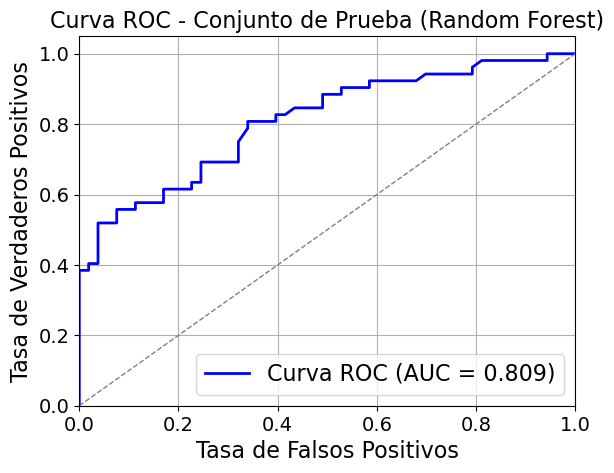

In [ ]:
# Random Forest
resultados_random_forest_MCL1_del,figura_rf_mcl1_del,modelo_optimizado_rf_mcl1_del = evaluar_random_forest(X_train_MCL1_del, y_train_MCL1_del, X_test_MCL1_del, y_test_MCL1_del)
resultados_random_forest_MCL1_del

Mejores parámetros (MLP): {'activation': 'relu', 'alpha': 0.01, 'hidden_layer_sizes': (64, 32), 'learning_rate_init': 0.1, 'max_iter': 500, 'solver': 'adam'}
Mejor precisión en CV (MLP): 0.7920524307283889


,Valor
Métrica,
Mejores hiperparámetros,"activation=relu, alpha=0.01, hidden_layer_size..."
Exactitud (CV),0.718 (±0.024)
Precisión (CV),0.700 (±0.029)
Sensibilidad (CV),0.771 (±0.032)
F1-score (CV),0.733 (±0.021)
AUC (CV),0.792 (±0.039)
Exactitud (Prueba),0.676
Precisión (Prueba),0.781
Sensibilidad (Prueba),0.481


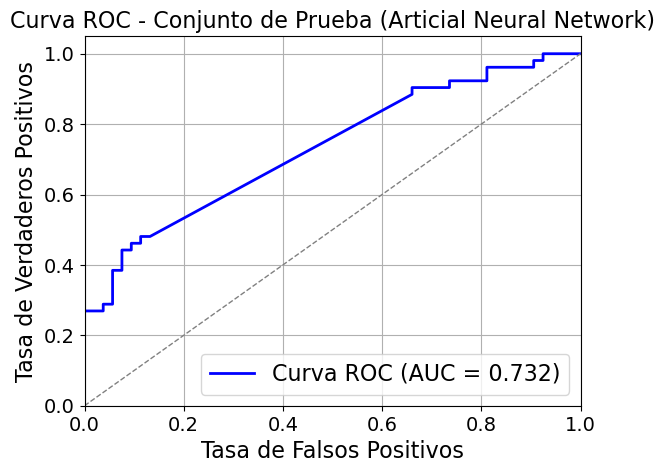

In [ ]:
# Redes Neuronales
resultados_red_neuronal_MCL1_del,figura_rn_mcl1_del,modelo_optimizado_rn_mcl1_del = evaluar_red_neuronal(X_train_MCL1_del, y_train_MCL1_del, X_test_MCL1_del, y_test_MCL1_del)
resultados_red_neuronal_MCL1_del

### Resultados finales

In [ ]:
# Tabla con los resultados finales
resultados_finales_MCL1_del=pd.concat([resultados_lr_MCL1_del,resultados_knn_MCL1_del,resultados_naive_bayes_MCL1_del,resultados_gradient_boosting_MCL1_del,resultados_svm_MCL1_del,resultados_random_forest_MCL1_del,resultados_red_neuronal_MCL1_del],axis=1)
resultados_finales_MCL1_del.columns=['Regresión Logística','KNN','Naive Bayes','Gradient Boosting','SVM','Random Forest','Artificial Neural Network']
resultados_finales_MCL1_del

,Regresión Logística,KNN,Naive Bayes,Gradient Boosting,SVM,Random Forest,Artificial Neural Network
Métrica,,,,,,,
Mejores hiperparámetros,"C=0.1, penalty=l1, solver=liblinear","metric=manhattan, n_neighbors=7, weights=distance",NaN,"learning_rate=0.2, max_depth=7, min_samples_sp...","C=1.0, kernel=rbf","max_depth=20, max_features=log2, min_samples_l...","activation=relu, alpha=0.01, hidden_layer_size..."
Exactitud (CV),0.759 (±0.035),0.766 (±0.023),0.640 (±0.042),0.776 (±0.009),0.764 (±0.032),0.788 (±0.025),0.718 (±0.024)
Precisión (CV),0.777 (±0.055),0.769 (±0.037),0.592 (±0.036),0.789 (±0.029),0.800 (±0.025),0.822 (±0.036),0.700 (±0.029)
Sensibilidad (CV),0.733 (±0.038),0.767 (±0.035),0.924 (±0.023),0.757 (±0.028),0.705 (±0.063),0.738 (±0.058),0.771 (±0.032)
F1-score (CV),0.753 (±0.034),0.767 (±0.020),0.721 (±0.021),0.772 (±0.006),0.748 (±0.042),0.776 (±0.033),0.733 (±0.021)
AUC (CV),0.810 (±0.008),0.847 (±0.015),0.726 (±0.034),0.851 (±0.012),0.819 (±0.013),0.866 (±0.015),0.792 (±0.039)
Exactitud (Prueba),0.695,0.714,0.552,0.724,0.714,0.724,0.676
Precisión (Prueba),0.692,0.683,0.529,0.717,0.704,0.695,0.781
Sensibilidad (Prueba),0.692,0.788,0.885,0.731,0.731,0.788,0.481


# Pipeline para BCL-XL

## Carga de los datos y exploracion inicial

In [ ]:
import pandas as pd
set_bclxl= pd.read_csv("C:/Users/jorge/Desktop/proyecto_TFM/data/set_BCL-XL.csv", sep=";")
set_bclxl

,Molecule ChEMBL ID,Molecule Name,Molecule Max Phase,Molecular Weight,#RO5 Violations,AlogP,Compound Key,Smiles,Standard Type,Standard Relation,...,Document ChEMBL ID,Source ID,Source Description,Document Journal,Document Year,Cell ChEMBL ID,Properties,Action Type,Standard Text Value,Value
0,CHEMBL1824818,NaN,NaN,499.38,1.0,5.97,21,O=C(NS(=O)(=O)c1ccc(Oc2ccccc2)nc1)c1cccc(-c2cc...,IC50,'=',...,CHEMBL1821700,1,Scientific Literature,J Med Chem,2011.0,NaN,NaN,NaN,NaN,2.310
1,CHEMBL1824831,NaN,NaN,516.38,2.0,6.71,34,O=C(NS(=O)(=O)c1ccc(Oc2ccc(F)cc2)cc1)c1cccc(-c...,IC50,'=',...,CHEMBL1821700,1,Scientific Literature,J Med Chem,2011.0,NaN,NaN,NaN,NaN,2.870
2,CHEMBL1824832,NaN,NaN,542.44,2.0,6.97,35,CCOc1ccc(Oc2ccc(S(=O)(=O)NC(=O)c3cccc(-c4ccc(C...,IC50,'=',...,CHEMBL1821700,1,Scientific Literature,J Med Chem,2011.0,NaN,NaN,NaN,NaN,0.086
3,CHEMBL3978452,NaN,NaN,883.51,2.0,7.45,BDBM232389,CCCCN(CCCC)C(=O)c1nn(-c2ccc(C(=O)NS(=O)(=O)c3c...,IC50,'=',...,CHEMBL3886736,37,BindingDB Patent Bioactivity Data,NaN,2016.0,NaN,NaN,NaN,NaN,50.000
4,CHEMBL3936837,NaN,NaN,867.51,2.0,8.21,BDBM232395,CCCCN(CCCC)C(=O)c1nn(-c2ccc(C(=O)NS(=O)(=O)c3c...,IC50,'=',...,CHEMBL3886736,37,BindingDB Patent Bioactivity Data,NaN,2016.0,NaN,NaN,NaN,NaN,30.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
903,CHEMBL4228713,A-1211212,NaN,896.51,3.0,9.44,EUB0000263b,CO[C@H]1CC[C@H](CNc2ccc(S(=O)(=O)NC(=O)c3ccc(N...,IC50,'=',...,CHEMBL5212743,65,EUbOPEN Chemogenomic Library Literature Data,NaN,2023.0,NaN,Selectivity Comments: CellTiter-Glo Luminescen...,NaN,NaN,753.000
904,CHEMBL4749218,NaN,NaN,249.38,0.0,3.38,Entry no. 37-2,CC1(C)CCN(c2ccc(C(=O)S)cc2)CC1,IC50,'>',...,CHEMBL4665682,1,Scientific Literature,J Med Chem,2020.0,NaN,TIME = 0.6667 hr,NaN,NaN,100.000
905,CHEMBL4297482,AZD-5991,1.0,672.28,2.0,8.18,AZD5991,Cc1c2c(nn1C)CSCc1cc(n(C)n1)CSc1cc(c3ccccc3c1)O...,IC50,'=',...,CHEMBL5034015,1,Scientific Literature,J Med Chem,2021.0,NaN,Time_Lower = 120.0 min | Time_Upper = 180.0 min,INHIBITOR,NaN,36.000
906,CHEMBL3393621,NaN,NaN,510.16,2.0,6.29,Maritoclax,O=C(c1ccccc1O)c1[nH]c(Cl)c(Cl)c1-n1c(C(=O)c2cc...,IC50,'>',...,CHEMBL5034015,1,Scientific Literature,J Med Chem,2021.0,NaN,TIME = 1.0 hr,NaN,NaN,80.000


A continuación, se comprobará si las variables más importantes se encuentran en el set descargado:

In [ ]:
columnas_requeridas = [
    "Molecule ChEMBL ID", "Standard Type", "Standard Relation",
    "Standard Value", "Standard Units", "Smiles",
    "Target ChEMBL ID", "Target Name", "Target Organism", "Target Type"
]
faltantes = [col for col in columnas_requeridas if col not in set_bclxl.columns]
if faltantes:
    print("Columnas requeridas faltantes:", faltantes)
else:
    print("Todas las columnas requeridas están presentes.")

Todas las columnas requeridas están presentes.


Vamos a comprobar y seleccionar todas las moléculas que presentan como Standard Type el parámetro IC50 y como Target Name "Apoptosis regulator Bcl-X"

In [ ]:
set_ic50_bclxl= set_bclxl[
    (set_bclxl["Standard Type"] == "IC50") &
    (set_bclxl["Target Name"] == "Apoptosis regulator Bcl-X")
]
print(set_ic50_bclxl.shape[0])

908


Vamos a comprobar si la unidad de todos los standard value es nM

In [ ]:
(set_ic50_bclxl["Standard Units"]=="nM").all()

np.False_

Observamos que las 908 moléculas cumplían los requisitos.

## Primeros pasos de preprocesado o exploracion inicial

 Ahora filtraremos aquellas moléculas que no presenten valores nulos en las variables Standard Activity y en la variable Smile.


In [ ]:
set_ic50_bclxl= set_ic50_bclxl[
    (set_ic50_bclxl["Standard Value"].notna())&
    (set_ic50_bclxl["Smiles"].notna())
]
print(set_ic50_bclxl.shape[0])
set_ic50_bclxl.reset_index(drop=True, inplace=True)
set_ic50_bclxl

897


,Molecule ChEMBL ID,Molecule Name,Molecule Max Phase,Molecular Weight,#RO5 Violations,AlogP,Compound Key,Smiles,Standard Type,Standard Relation,...,Document ChEMBL ID,Source ID,Source Description,Document Journal,Document Year,Cell ChEMBL ID,Properties,Action Type,Standard Text Value,Value
0,CHEMBL1824818,NaN,NaN,499.38,1.0,5.97,21,O=C(NS(=O)(=O)c1ccc(Oc2ccccc2)nc1)c1cccc(-c2cc...,IC50,'=',...,CHEMBL1821700,1,Scientific Literature,J Med Chem,2011.0,NaN,NaN,NaN,NaN,2.310
1,CHEMBL1824831,NaN,NaN,516.38,2.0,6.71,34,O=C(NS(=O)(=O)c1ccc(Oc2ccc(F)cc2)cc1)c1cccc(-c...,IC50,'=',...,CHEMBL1821700,1,Scientific Literature,J Med Chem,2011.0,NaN,NaN,NaN,NaN,2.870
2,CHEMBL1824832,NaN,NaN,542.44,2.0,6.97,35,CCOc1ccc(Oc2ccc(S(=O)(=O)NC(=O)c3cccc(-c4ccc(C...,IC50,'=',...,CHEMBL1821700,1,Scientific Literature,J Med Chem,2011.0,NaN,NaN,NaN,NaN,0.086
3,CHEMBL3978452,NaN,NaN,883.51,2.0,7.45,BDBM232389,CCCCN(CCCC)C(=O)c1nn(-c2ccc(C(=O)NS(=O)(=O)c3c...,IC50,'=',...,CHEMBL3886736,37,BindingDB Patent Bioactivity Data,NaN,2016.0,NaN,NaN,NaN,NaN,50.000
4,CHEMBL3936837,NaN,NaN,867.51,2.0,8.21,BDBM232395,CCCCN(CCCC)C(=O)c1nn(-c2ccc(C(=O)NS(=O)(=O)c3c...,IC50,'=',...,CHEMBL3886736,37,BindingDB Patent Bioactivity Data,NaN,2016.0,NaN,NaN,NaN,NaN,30.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
892,CHEMBL4228713,A-1211212,NaN,896.51,3.0,9.44,EUB0000263b,CO[C@H]1CC[C@H](CNc2ccc(S(=O)(=O)NC(=O)c3ccc(N...,IC50,'=',...,CHEMBL5212743,65,EUbOPEN Chemogenomic Library Literature Data,NaN,2023.0,NaN,Selectivity Comments: CellTiter-Glo Luminescen...,NaN,NaN,753.000
893,CHEMBL4749218,NaN,NaN,249.38,0.0,3.38,Entry no. 37-2,CC1(C)CCN(c2ccc(C(=O)S)cc2)CC1,IC50,'>',...,CHEMBL4665682,1,Scientific Literature,J Med Chem,2020.0,NaN,TIME = 0.6667 hr,NaN,NaN,100.000
894,CHEMBL4297482,AZD-5991,1.0,672.28,2.0,8.18,AZD5991,Cc1c2c(nn1C)CSCc1cc(n(C)n1)CSc1cc(c3ccccc3c1)O...,IC50,'=',...,CHEMBL5034015,1,Scientific Literature,J Med Chem,2021.0,NaN,Time_Lower = 120.0 min | Time_Upper = 180.0 min,INHIBITOR,NaN,36.000
895,CHEMBL3393621,NaN,NaN,510.16,2.0,6.29,Maritoclax,O=C(c1ccccc1O)c1[nH]c(Cl)c(Cl)c1-n1c(C(=O)c2cc...,IC50,'>',...,CHEMBL5034015,1,Scientific Literature,J Med Chem,2021.0,NaN,TIME = 1.0 hr,NaN,NaN,80.000


Se han eliminado 11 ejemplos. Ahora procedemos a extraer los descriptores moleculares.

Vamos a comprobar si existen entradas que presentan el mismo ID

In [ ]:
set_ic50_bclxl["Molecule ChEMBL ID"].value_counts().head()

Molecule ChEMBL ID
CHEMBL376408    10
CHEMBL371861     5
CHEMBL51483      5
CHEMBL538616     4
CHEMBL443684     4
Name: count, dtype: int64

Vamos a observan si presentan diferentes valores de standard value:

In [ ]:
set_ic50_bclxl[set_ic50_bclxl['Molecule ChEMBL ID'] == 'CHEMBL376408']["Standard Value"]

331    14.0
759     3.0
762    60.0
808    64.0
839     1.0
842     6.0
850     6.0
851     6.0
870     0.5
876    14.0
Name: Standard Value, dtype: float64

Observamos que hay hasta 10 entradas diferentes para el mismo ID. De entre todas las que presentan el mismo ID, vamos a quedarnos con aquella molécula que presenta el menor valor de Standard Value:

In [ ]:
set_ic50_bclxl=set_ic50_bclxl.sort_values(by="Standard Value").drop_duplicates(subset="Molecule ChEMBL ID", keep="first")
set_ic50_bclxl.reset_index(drop=True, inplace=True)
print("El número de moléculas se ha reducido a:", set_ic50_bclxl.shape[0])
print(set_ic50_bclxl["Molecule ChEMBL ID"].value_counts().head())
set_ic50_bclxl[set_ic50_bclxl['Molecule ChEMBL ID'] == 'CHEMBL376408']["Standard Value"]

El número de moléculas se ha reducido a: 782
Molecule ChEMBL ID
CHEMBL1824822    1
CHEMBL376408     1
CHEMBL3916642    1
CHEMBL3703622    1
CHEMBL4111781    1
Name: count, dtype: int64


0    0.5
Name: Standard Value, dtype: float64

Observamos que se han eliminado 115 moleculas.


## Generación de descriptores moleculares con Rdkit

In [ ]:
# Aplicamos la función a cada valor de Smile en nuestro set y creamos un nuevo DataFrame
descriptor_names = list(Descriptors._descList)  # Obtiene los nombres de los descriptores
descriptores_rdkit_bclxl = pd.DataFrame(set_ic50_bclxl["Smiles"].apply(get_descriptors).tolist(),
                                  columns=[name[0] for name in descriptor_names],  # Nombres de los descriptores
                                  index=set_ic50_bclxl.index)

# Agregar identificador de molécula
descriptores_rdkit_bclxl = pd.concat([set_ic50_bclxl[["Molecule ChEMBL ID"]], descriptores_rdkit_bclxl], axis=1)# pd.concat necesita recibir varios df en una tupla

# Añadimos la columna standard activity
datos_BCLXL=pd.concat([descriptores_rdkit_bclxl,set_ic50_bclxl["Standard Value"]],axis=1)
datos_BCLXL

,Molecule ChEMBL ID,MaxAbsEStateIndex,MaxEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,HeavyAtomMolWt,ExactMolWt,...,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea,Standard Value
0,CHEMBL376408,13.350173,13.350173,0.140221,-4.426475,0.057731,14.035714,813.446,768.086,812.258138,...,1,0,0,0,0,0,0,0,0,0.5
1,CHEMBL3916642,14.331298,14.331298,0.020424,-6.096322,0.063843,17.314286,1042.709,983.237,1041.321725,...,1,1,0,0,0,0,0,0,0,0.5
2,CHEMBL3703622,14.331298,14.331298,0.020424,-6.096322,0.063843,17.314286,1042.709,983.237,1041.321725,...,1,1,0,0,0,0,0,0,0,0.5
3,CHEMBL4111781,14.295305,14.295305,0.020318,-6.095009,0.058529,17.382353,1014.655,959.215,1013.290424,...,1,1,0,0,0,0,0,0,0,0.5
4,CHEMBL3703617,14.358094,14.358094,0.020728,-6.101338,0.063843,17.314286,1042.709,983.237,1041.321725,...,1,1,0,0,0,0,0,0,0,0.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
777,CHEMBL1165054,12.035936,12.035936,0.061042,-0.610686,0.718203,57.652174,318.457,288.217,318.219495,...,0,0,0,0,0,0,0,0,0,380000.0
778,CHEMBL1164460,12.046557,12.046557,0.290208,-0.529694,0.760011,64.681818,302.458,272.218,302.224580,...,0,0,0,0,0,0,0,0,0,400000.0
779,CHEMBL2063880,13.681523,13.681523,0.142655,-0.846244,0.334016,15.567568,525.093,487.797,524.255419,...,0,0,0,0,0,0,0,0,0,453000.0
780,CHEMBL2063890,12.783766,12.783766,0.059068,-3.975298,0.206581,12.323529,500.646,472.422,500.155197,...,1,0,0,0,0,0,0,0,0,547000.0


### Preprocesado de los descriptores moleculares

Comprobamos de que tipos son las variables y si hay valores nulos

In [ ]:
datos_BCLXL.info()
columna_object = datos_BCLXL.select_dtypes(include=['object']).columns
print(columna_object)

# Comprobacion si hay valores nulos
print(datos_BCLXL.isna().sum().any())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 782 entries, 0 to 781
Columns: 212 entries, Molecule ChEMBL ID to Standard Value
dtypes: float64(107), int64(104), object(1)
memory usage: 1.3+ MB
Index(['Molecule ChEMBL ID'], dtype='object')
True


Observamos que existen nulos, procedemos a explorar donde estan.

In [ ]:
nulos_por_columna = datos_BCLXL.isna().sum()
print("Nulos por columna:")
print(nulos_por_columna[nulos_por_columna > 0])
nulos_por_fila = datos_BCLXL.isna().sum(axis=1)
print("\nNulos por fila:")
print(nulos_por_fila[nulos_por_fila > 0])

Nulos por columna:
BCUT2D_MWHI       1
BCUT2D_MWLOW      1
BCUT2D_CHGHI      1
BCUT2D_CHGLO      1
BCUT2D_LOGPHI     1
BCUT2D_LOGPLOW    1
BCUT2D_MRHI       1
BCUT2D_MRLOW      1
dtype: int64

Nulos por fila:
752    8
dtype: int64


Observamos que habia un solo ejemplo con valores nulos en 8 columnas distintas, procedemos a eliminarlo.

In [ ]:
datos_BCLXL_sin_desc_nulos=datos_BCLXL.dropna(axis=0)
# Comprobacion si hay valores nulos
print(datos_BCLXL_sin_desc_nulos.isna().sum().any())
datos_BCLXL_sin_desc_nulos.shape

False


(781, 212)

Ahora procedemos a eliminar moléculas que presentan el mismo valor para todos los descriptores moleculares

In [ ]:
datos_BCLXL_no_dup = datos_BCLXL_sin_desc_nulos.loc[~datos_BCLXL_sin_desc_nulos.duplicated(subset=datos_BCLXL_sin_desc_nulos.columns[1:-1], keep="first")]
# No tenemos en cuenta el ID y el Standard Value
# En caso de que hayan duplicados, nos quedamos con el primero, ya que las moléculas estan ordenadas de menor a mayor Standard Value
datos_BCLXL_no_dup.reset_index(drop=True, inplace=True)
datos_BCLXL_no_dup.shape

(739, 212)

Se han eliminado 42 ejemplos. Procedemos a estandarizar y eliminar columnas con alta correlacion

In [ ]:
datos_BCLXL_estandar=estandarizar_datos(datos_BCLXL_no_dup)
datos_BCLXL_sin_columnas_corr=eliminar_columnas_alta_correlacion(datos_BCLXL_estandar,0.8)
print(datos_BCLXL_sin_columnas_corr.shape)

['MaxEStateIndex', 'HeavyAtomMolWt', 'ExactMolWt', 'NumValenceElectrons', 'MaxAbsPartialCharge', 'MinAbsPartialCharge', 'FpDensityMorgan2', 'FpDensityMorgan3', 'BCUT2D_LOGPLOW', 'BCUT2D_MRHI', 'BertzCT', 'Chi0', 'Chi0n', 'Chi0v', 'Chi1', 'Chi1n', 'Chi1v', 'Chi2n', 'Chi2v', 'Chi3n', 'Chi3v', 'Chi4n', 'Chi4v', 'HallKierAlpha', 'Kappa1', 'Kappa2', 'Kappa3', 'LabuteASA', 'PEOE_VSA1', 'PEOE_VSA12', 'PEOE_VSA13', 'PEOE_VSA2', 'PEOE_VSA7', 'PEOE_VSA8', 'SMR_VSA1', 'SMR_VSA10', 'SMR_VSA3', 'SMR_VSA5', 'SMR_VSA6', 'SlogP_VSA1', 'SlogP_VSA2', 'SlogP_VSA3', 'SlogP_VSA5', 'SlogP_VSA6', 'TPSA', 'EState_VSA1', 'EState_VSA10', 'VSA_EState1', 'VSA_EState10', 'VSA_EState2', 'VSA_EState5', 'VSA_EState6', 'VSA_EState9', 'HeavyAtomCount', 'NHOHCount', 'NOCount', 'NumAliphaticRings', 'NumAromaticCarbocycles', 'NumAromaticRings', 'NumHAcceptors', 'NumHDonors', 'NumHeteroatoms', 'NumRotatableBonds', 'NumSaturatedHeterocycles', 'NumSaturatedRings', 'RingCount', 'MolMR', 'fr_Al_OH_noTert', 'fr_Ar_OH', 'fr_COO2

Se han eliminado **89 columnas con alta correlacion**. Procedemos a eliminar las columnas con baja varianza

In [ ]:
datos_BCLXL_sin_columnas_baja_var=eliminar_baja_varianza(datos_BCLXL_sin_columnas_corr)
print(datos_BCLXL_sin_columnas_baja_var.shape)

Se eliminaron 19 columnas por baja varianza (< 0.1): ['NumRadicalElectrons', 'SMR_VSA8', 'SlogP_VSA9', 'fr_N_O', 'fr_alkyl_carbamate', 'fr_benzodiazepine', 'fr_diazo', 'fr_dihydropyridine', 'fr_epoxide', 'fr_isocyan', 'fr_isothiocyan', 'fr_lactam', 'fr_lactone', 'fr_nitroso', 'fr_oxime', 'fr_prisulfonamd', 'fr_quatN', 'fr_tetrazole', 'fr_thiocyan']
(739, 104)


## Creación de la columna actividad

Creamos la columna actividad

In [ ]:
datos_BCLXL_curados=crear_columna_binaria_actividad(datos_BCLXL_sin_columnas_baja_var)

# Eliminamos la columna Standard Value
datos_BCLXL_curados=datos_BCLXL_curados.drop(columns=["Standard Value"])

# Una vez realizado todo el proceso de limpieza podemos reasignar los índices
datos_BCLXL_curados.reset_index(drop=True, inplace=True)
datos_BCLXL_curados

El umbral de corte de Standard Value (mediana ) es: 360.0


,Molecule ChEMBL ID,MaxAbsEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,MaxPartialCharge,MinPartialCharge,FpDensityMorgan1,...,fr_piperzine,fr_pyridine,fr_sulfide,fr_sulfone,fr_term_acetylene,fr_thiazole,fr_thiophene,fr_unbrch_alkane,fr_urea,Actividad
0,CHEMBL376408,0.061585,0.589183,-0.674340,-0.915439,-0.165025,0.487157,-0.348914,1.029602,-0.266251,...,1.764422,-0.415462,1.407903,-0.384438,-0.036811,-0.416546,-0.19096,-0.447557,-0.090474,1
1,CHEMBL3916642,0.777217,-0.678977,-1.503257,-0.887445,0.457836,1.263032,2.133229,0.825078,-0.302539,...,-0.511159,-0.415462,1.407903,2.485254,-0.036811,-0.416546,-0.19096,-0.447557,-0.090474,1
2,CHEMBL4111781,0.750963,-0.680099,-1.502605,-0.911787,0.470767,1.168091,2.133229,0.825078,-0.244905,...,-0.511159,-0.415462,1.407903,2.485254,-0.036811,-0.416546,-0.19096,-0.447557,-0.090474,1
3,CHEMBL3703617,0.796761,-0.675750,-1.505747,-0.887445,0.457836,1.263032,2.133229,0.825078,-0.302539,...,-0.511159,-0.415462,1.407903,2.485254,-0.036811,-0.416546,-0.19096,-0.447557,-0.090474,1
4,CHEMBL3342332,0.958969,-0.851138,0.975433,-0.578360,-0.462842,0.001042,0.390477,-0.886247,0.818546,...,-0.511159,-0.415462,-0.668824,-0.384438,-0.036811,4.508698,-0.19096,-0.447557,-0.090474,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
734,CHEMBL1165054,-0.897019,-0.248999,1.219829,2.109869,8.121194,-1.187992,-0.158825,-0.724393,0.940739,...,-0.511159,-0.415462,-0.668824,-0.384438,-0.036811,-0.416546,-0.19096,-0.447557,-0.090474,0
735,CHEMBL1164460,-0.889272,2.176931,1.260034,2.301372,9.456680,-1.242136,-0.158827,-0.724393,0.278078,...,-0.511159,-0.415462,-0.668824,-0.384438,-0.036811,-0.416546,-0.19096,-0.447557,-0.090474,0
736,CHEMBL2063880,0.303271,0.614952,1.102897,0.350089,0.125996,-0.488691,-0.648265,0.731773,0.278078,...,1.764422,-0.415462,-0.668824,-0.384438,-0.036811,-0.416546,-0.19096,-0.447557,-0.090474,0
737,CHEMBL2063890,-0.351552,-0.269896,-0.450374,-0.233631,-0.490304,-0.571425,-0.348914,1.029602,0.278078,...,-0.511159,-0.415462,1.407903,-0.384438,-0.036811,-0.416546,-0.19096,-0.447557,-0.090474,0


## División del conjunto en entrenamiento y prueba

In [ ]:
from sklearn.model_selection import train_test_split
# En primer lugar separamos los IDs y las etiquetas
X_BCLXL=datos_BCLXL_curados.iloc[:,1:-1]
y_BCLXL=datos_BCLXL_curados["Actividad"]
# Realizamos una división 80/20
X_train_BCLXL,X_test_BCLXL,y_train_BCLXL,y_test_BCLXL=train_test_split(X_BCLXL,y_BCLXL,test_size=0.2,random_state=999,stratify=y_BCLXL)# indicamos stratify=y para mantener las clases balanceadas
# Verificamos los tamaños
print("Entrenamiento:", X_train_BCLXL.shape)
print("Prueba:", X_test_BCLXL.shape)

Entrenamiento: (591, 102)
Prueba: (148, 102)


## Modelos de machine learning

Mejores parámetros: {'C': 0.1, 'penalty': 'l2', 'solver': 'liblinear'}
Mejor Exactitud (accuracy) en CV (GridSearch): 0.946129464713205


,Valor
Métrica,
Mejores hiperparámetros,"C=0.1, penalty=l2, solver=liblinear"
Exactitud (CV),0.878 (±0.023)
Precisión (CV),0.869 (±0.027)
Sensibilidad (CV),0.892 (±0.038)
F1-score (CV),0.880 (±0.024)
AUC (CV),0.946 (±0.022)
Exactitud (Prueba),0.885
Precisión (Prueba),0.880
Sensibilidad (Prueba),0.892


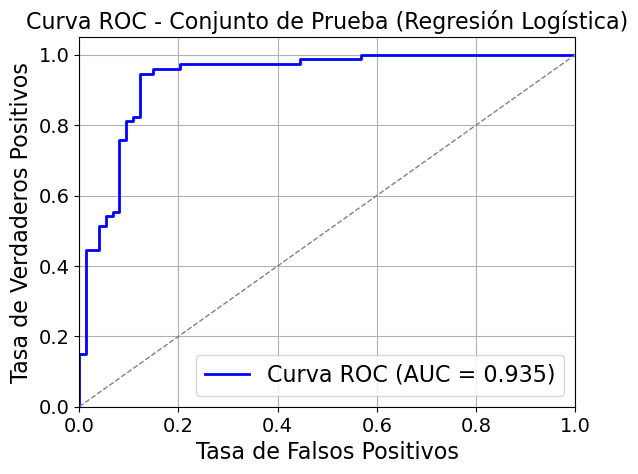

In [ ]:
# Regresion logistica
resultados_lr_BCLXL,figura_rl_BCLXL,modelo_optimizado_rl_BCLXL=evaluar_lr(X_train_BCLXL,y_train_BCLXL,X_test_BCLXL,y_test_BCLXL)
resultados_lr_BCLXL

Mejores parámetros: {'metric': 'manhattan', 'n_neighbors': 11, 'weights': 'distance'}
Mejor precisión en CV (GridSearch): 0.9541664272718566


,Valor
Métrica,
Mejores hiperparámetros,"metric=manhattan, n_neighbors=11, weights=dist..."
Exactitud (CV),0.880 (±0.017)
Precisión (CV),0.852 (±0.030)
Sensibilidad (CV),0.922 (±0.030)
F1-score (CV),0.885 (±0.016)
AUC (CV),0.954 (±0.018)
Exactitud (Prueba),0.899
Precisión (Prueba),0.873
Sensibilidad (Prueba),0.932


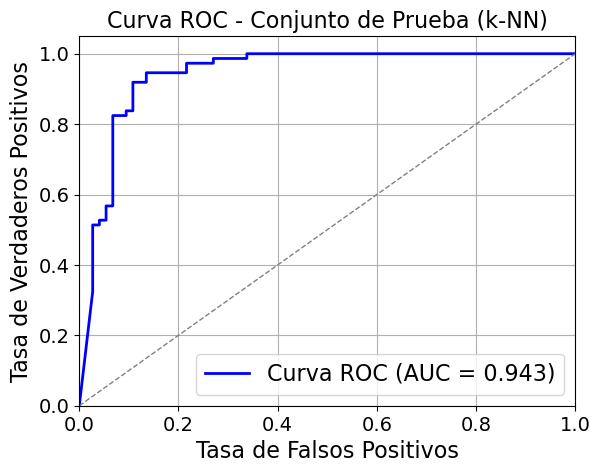

In [ ]:
# Knn
resultados_knn_BCLXL,figura_knn_BCLXL,modelo_optimizado_knn_BCLXL=evaluar_knn(X_train_BCLXL,y_train_BCLXL,X_test_BCLXL,y_test_BCLXL)
resultados_knn_BCLXL

,Valor
Métrica,
Exactitud (CV),0.748 (±0.069)
Precisión (CV),0.682 (±0.074)
Sensibilidad (CV),0.963 (±0.020)
F1-score (CV),0.796 (±0.047)
AUC (CV),0.820 (±0.064)
Exactitud (Prueba),0.743
Precisión (Prueba),0.670
Sensibilidad (Prueba),0.959
F1-score (Prueba),0.789


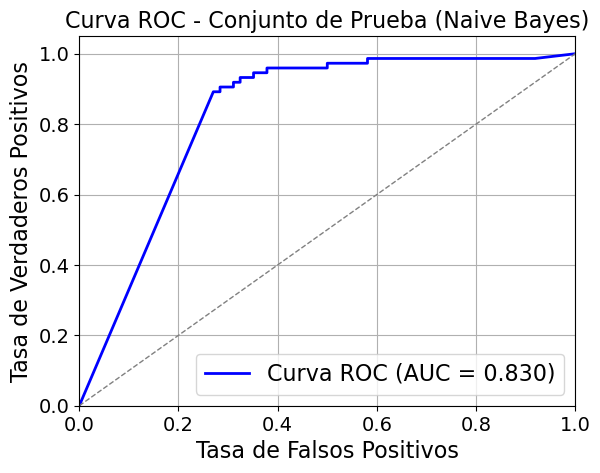

In [ ]:
# Naive Bayes
resultados_naive_bayes_BCLXL,figura_nb_BCLXL,modelo_optimizado_nb_BCLXL=evaluar_naive_bayes(X_train_BCLXL,y_train_BCLXL,X_test_BCLXL,y_test_BCLXL)
resultados_naive_bayes_BCLXL

Mejores parámetros: {'learning_rate': 0.2, 'max_depth': 3, 'min_samples_split': 5, 'n_estimators': 100}
Mejor precisión en CV (GridSearch): 0.9494972708991669


,Valor
Métrica,
Mejores hiperparámetros,"learning_rate=0.2, max_depth=3, min_samples_sp..."
Exactitud (CV),0.883 (±0.022)
Precisión (CV),0.882 (±0.023)
Sensibilidad (CV),0.885 (±0.029)
F1-score (CV),0.884 (±0.023)
AUC (CV),0.949 (±0.028)
Exactitud (Prueba),0.885
Precisión (Prueba),0.861
Sensibilidad (Prueba),0.919


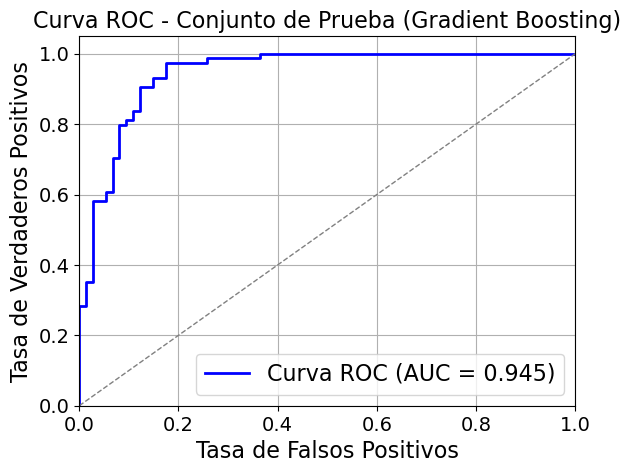

In [ ]:
# Gradient Boosting
resultados_gradient_boosting_BCLXL,figura_gb_BCLXL,modelo_optimizado_gb_BCLXL=evaluar_gradient_boosting(X_train_BCLXL,y_train_BCLXL,X_test_BCLXL,y_test_BCLXL)
resultados_gradient_boosting_BCLXL

Mejores parámetros: {'C': 10.0, 'kernel': 'rbf'}
Mejor precisión en CV (GridSearch): 0.9442028152829647


,Valor
Métrica,
Mejores hiperparámetros,"C=10.0, kernel=rbf"
Exactitud (CV),0.892 (±0.028)
Precisión (CV),0.890 (±0.028)
Sensibilidad (CV),0.895 (±0.042)
F1-score (CV),0.892 (±0.029)
AUC (CV),0.944 (±0.019)
Exactitud (Prueba),0.858
Precisión (Prueba),0.863
Sensibilidad (Prueba),0.851


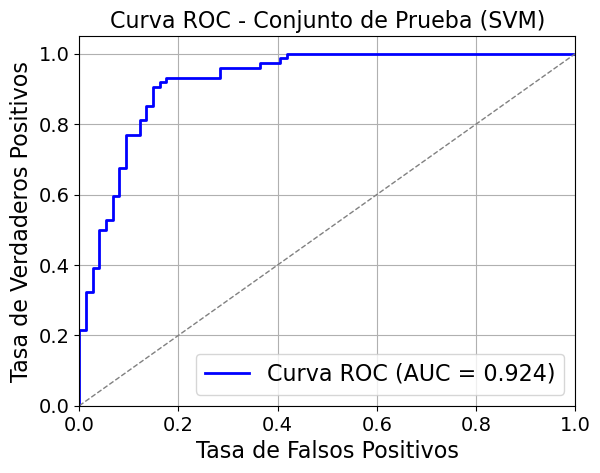

In [ ]:
# SVM
resultados_svm_BCLXL,figura_svm_BCLXL,modelo_optimizado_svm_BCLXL=evaluar_svm(X_train_BCLXL,y_train_BCLXL,X_test_BCLXL,y_test_BCLXL)
resultados_svm_BCLXL

Mejores parámetros: {'max_depth': None, 'max_features': 'log2', 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 300}
Mejor precisión en CV (GridSearch): 0.9571071531169204


,Valor
Métrica,
Mejores hiperparámetros,"max_depth=None, max_features=log2, min_samples..."
Exactitud (CV),0.890 (±0.025)
Precisión (CV),0.890 (±0.035)
Sensibilidad (CV),0.892 (±0.023)
F1-score (CV),0.891 (±0.024)
AUC (CV),0.957 (±0.020)
Exactitud (Prueba),0.892
Precisión (Prueba),0.882
Sensibilidad (Prueba),0.905


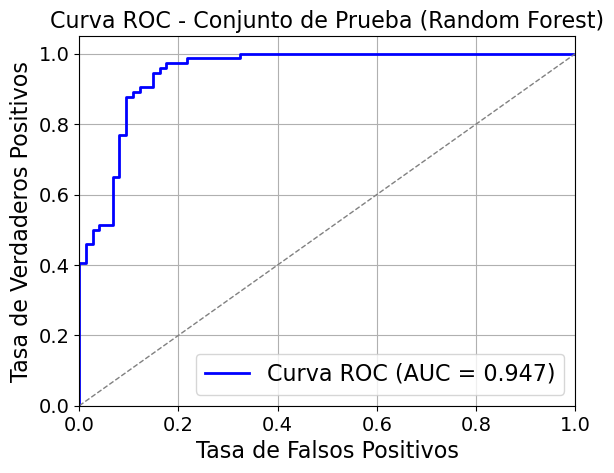

In [ ]:
# Random Forest
resultados_random_forest_BCLXL,figura_rf_BCLXL,modelo_optimizado_rf_BCLXL=evaluar_random_forest(X_train_BCLXL,y_train_BCLXL,X_test_BCLXL,y_test_BCLXL)
resultados_random_forest_BCLXL

Mejores parámetros (MLP): {'activation': 'logistic', 'alpha': 0.01, 'hidden_layer_sizes': (64,), 'learning_rate_init': 0.1, 'max_iter': 500, 'solver': 'adam'}
Mejor precisión en CV (MLP): 0.950846500047879


,Valor
Métrica,
Mejores hiperparámetros,"activation=logistic, alpha=0.01, hidden_layer_..."
Exactitud (CV),0.877 (±0.031)
Precisión (CV),0.869 (±0.042)
Sensibilidad (CV),0.889 (±0.020)
F1-score (CV),0.879 (±0.029)
AUC (CV),0.951 (±0.013)
Exactitud (Prueba),0.851
Precisión (Prueba),0.842
Sensibilidad (Prueba),0.865


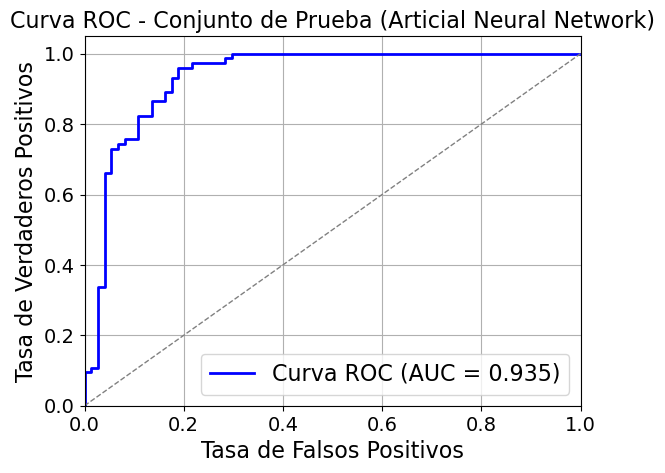

In [ ]:
# Artifical neural network
resultados_red_neuronal_BCLXL,figura_rn_BCLXL,modelo_optimizado_rn_BCLXL=evaluar_red_neuronal(X_train_BCLXL,y_train_BCLXL,X_test_BCLXL,y_test_BCLXL)
resultados_red_neuronal_BCLXL

## Resultados finales

Los resultados finales para todos los modelos son los siguientes:

In [ ]:
resultados_finales_BCLXL=pd.concat([resultados_lr_BCLXL,resultados_knn_BCLXL,resultados_naive_bayes_BCLXL,resultados_gradient_boosting_BCLXL,resultados_svm_BCLXL,resultados_random_forest_BCLXL,resultados_red_neuronal_BCLXL],axis=1)
resultados_finales_BCLXL.columns=['Regresión Logística','KNN','Naive Bayes','Gradient Boosting','SVM','Random Forest','Artificial Neural Network']
resultados_finales_BCLXL

,Regresión Logística,KNN,Naive Bayes,Gradient Boosting,SVM,Random Forest,Artificial Neural Network
Métrica,,,,,,,
Mejores hiperparámetros,"C=0.1, penalty=l2, solver=liblinear","metric=manhattan, n_neighbors=11, weights=dist...",NaN,"learning_rate=0.2, max_depth=3, min_samples_sp...","C=10.0, kernel=rbf","max_depth=None, max_features=log2, min_samples...","activation=logistic, alpha=0.01, hidden_layer_..."
Exactitud (CV),0.878 (±0.023),0.880 (±0.017),0.748 (±0.069),0.883 (±0.022),0.892 (±0.028),0.890 (±0.025),0.877 (±0.031)
Precisión (CV),0.869 (±0.027),0.852 (±0.030),0.682 (±0.074),0.882 (±0.023),0.890 (±0.028),0.890 (±0.035),0.869 (±0.042)
Sensibilidad (CV),0.892 (±0.038),0.922 (±0.030),0.963 (±0.020),0.885 (±0.029),0.895 (±0.042),0.892 (±0.023),0.889 (±0.020)
F1-score (CV),0.880 (±0.024),0.885 (±0.016),0.796 (±0.047),0.884 (±0.023),0.892 (±0.029),0.891 (±0.024),0.879 (±0.029)
AUC (CV),0.946 (±0.022),0.954 (±0.018),0.820 (±0.064),0.949 (±0.028),0.944 (±0.019),0.957 (±0.020),0.951 (±0.013)
Exactitud (Prueba),0.885,0.899,0.743,0.885,0.858,0.892,0.851
Precisión (Prueba),0.880,0.873,0.670,0.861,0.863,0.882,0.842
Sensibilidad (Prueba),0.892,0.932,0.959,0.919,0.851,0.905,0.865


# Fingerprints para BCL2


Para maximizar la precisión y selectividad en la identificación de nuevos inhibidores se entrenarán tambien models de machine learning basados en fingerprints químicos, , específicamente Morgan fingerprints (ECFP4). En primer lugar, vamos a diseñar una funcion para obtener los fingerprints a partir de las estructuras smiles. Los fingerptints tipo ECFP4 son representaciones numéricas de las características estructurales de una molécula mediante subestructuras circulares centradas en cada átomo, considerando un diámetro de 4 enlaces (es decir, un radio de 2 enlaces desde el átomo central).

## Generación de los fingerprints

In [ ]:
from rdkit import Chem
from rdkit.Chem import AllChem
def calcular_morgan_fingerprints(smiles_list,n_bits=2048,radius=2,return_invalid=False):
    fingerprints=[] # almacena los arrays de fingerprints
    indices_invalidos=[] # almacena los indices de smiles que no se puedan procesar

    for ind,smiles in enumerate(smiles_list):
        try:
            mol=Chem.MolFromSmiles(smiles)
            if mol is None:
                indices_invalidos.append(ind)
                continue  # pasa al siguiente mol si la molecula es invalida
            morgan_gen = AllChem.GetMorganGenerator(radius=radius, fpSize=n_bits)# Configuramos un generador de fingerprints
            fp = morgan_gen.GetFingerprint(mol)  # Genera fingerprint como ExplicitBitVect
            fp_array=np.zeros((n_bits,),dtype=np.int8)# creamos un array vacío para optimizar memoria del tamaño del fingerprint
            Chem.DataStructs.ConvertToNumpyArray(fp,fp_array)# copiamos los bits del objeto fp en fp_array para obtener los resultados en un array de numpy
            fingerprints.append(fp_array) # vamos añadiendo cada matriz a una lista

        except Exception as e: # manejamos errores durante el proceso e indicamos el indice de los smiles que esten fallando
                print(f"Error en SMILES {ind}: {smiles} - {str(e)}")
                indices_invalidos.append(ind)

    if return_invalid:
        return fingerprints,indices_invalidos
    else:
        return fingerprints

# Fuente inspirada :https://greglandrum.github.io/rdkit-blog/posts/2023-01-18-fingerprint-generator-tutorial.html
fingerprints_BCL2,indices_invalidos_BCL2=calcular_morgan_fingerprints(set_ic50_bcl2["Smiles"],return_invalid=True)
print(np.shape(fingerprints_BCL2))
print(fingerprints_BCL2[0])
print(indices_invalidos_BCL2)

(877, 2048)
[0 1 0 ... 0 0 0]
[]


## Procesado de los fingerprints

Añadimos los IDs y el standard valude de cada molecula:

In [ ]:
fingerprints_BCL2=pd.DataFrame(fingerprints_BCL2)
fingerprints_BCL2_df=pd.concat([set_ic50_bcl2["Molecule ChEMBL ID"],fingerprints_BCL2,set_ic50_bcl2["Standard Value"]],axis=1)
fingerprints_BCL2_df

,Molecule ChEMBL ID,0,1,2,3,4,5,6,7,8,...,2039,2040,2041,2042,2043,2044,2045,2046,2047,Standard Value
0,CHEMBL3703599,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.3
1,CHEMBL3966290,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.3
2,CHEMBL3703600,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.3
3,CHEMBL3911725,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.3
4,CHEMBL3703616,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
872,CHEMBL4572199,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,164000.0
873,CHEMBL2063880,0,1,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,213000.0
874,CHEMBL106708,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,300000.0
875,CHEMBL2063891,0,1,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,534000.0


Comprobaremos el tipo de las columnas generadas y si hay valores nulos

In [ ]:
fingerprints_BCL2_df.info()
fingerprints_BCL2_df.select_dtypes(include=['object']).columns

# Comprobacion si hay valores nulos
print(fingerprints_BCL2_df.isna().sum().any())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 877 entries, 0 to 876
Columns: 2050 entries, Molecule ChEMBL ID to Standard Value
dtypes: float64(1), int8(2048), object(1)
memory usage: 1.7+ MB
False


Eliminamos filas con los mismos valores de fingerprints

In [ ]:
fingerprints_BCL2_no_dup=fingerprints_BCL2_df.loc[~fingerprints_BCL2_df.duplicated(subset=fingerprints_BCL2_df.columns[1:-1], keep="first")]
fingerprints_BCL2_no_dup.reset_index(drop=True, inplace=True)
fingerprints_BCL2_no_dup.shape

(827, 2050)

Se han eliminado un total de 50 filas duplicadas para los fingerprints

## Creación de la columna actividad

Añadimos la columna actividad

In [ ]:
fingerprints_ic50_BCL2=crear_columna_binaria_actividad(fingerprints_BCL2_no_dup.copy())
fingerprints_ic50_BCL2=fingerprints_ic50_BCL2.drop(columns=["Standard Value"])
fingerprints_ic50_BCL2.reset_index(drop=True, inplace=True)
fingerprints_ic50_BCL2

El umbral de corte de Standard Value (mediana ) es: 65.1


,Molecule ChEMBL ID,0,1,2,3,4,5,6,7,8,...,2039,2040,2041,2042,2043,2044,2045,2046,2047,Actividad
0,CHEMBL3703599,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
1,CHEMBL3703600,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
2,CHEMBL3703616,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
3,CHEMBL4852442,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
4,CHEMBL4111781,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
822,CHEMBL4572199,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
823,CHEMBL2063880,0,1,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
824,CHEMBL106708,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
825,CHEMBL2063891,0,1,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


## División en entrenamiento y prueba

Dividimos en entrenamiento y prueba

In [ ]:
from sklearn.model_selection import train_test_split
# En primer lugar separamos los IDs y las etiquetas
X_fp_BCL2=fingerprints_ic50_BCL2.iloc[:,1:-1]
y_fp_BCL2=fingerprints_ic50_BCL2["Actividad"]
# Realizamos una división 80/20
X_train_fp_BCL2,X_test_fp_BCL2,y_train_fp_BCL2,y_test_fp_BCL2=train_test_split(X_fp_BCL2,y_fp_BCL2,test_size=0.2,random_state=999,stratify=y_fp_BCL2)# indicamos stratify=y para mantener las clases balanceadas
# Verificamos el tamaño de los conjuntos
print("Entrenamiento:", X_train_fp_BCL2.shape)
print("Prueba:", X_test_fp_BCL2.shape)


Entrenamiento: (661, 2048)
Prueba: (166, 2048)


## Modelos de machine learning

Comenzamos a entrenar los modelos

Mejores parámetros: {'C': 0.1, 'penalty': 'l2', 'solver': 'liblinear'}
Mejor Exactitud (accuracy) en CV (GridSearch): 0.9395549799213299


,Valor
Métrica,
Mejores hiperparámetros,"C=0.1, penalty=l2, solver=liblinear"
Exactitud (CV),0.862 (±0.015)
Precisión (CV),0.848 (±0.030)
Sensibilidad (CV),0.888 (±0.060)
F1-score (CV),0.865 (±0.020)
AUC (CV),0.940 (±0.012)
Exactitud (Prueba),0.873
Precisión (Prueba),0.878
Sensibilidad (Prueba),0.867


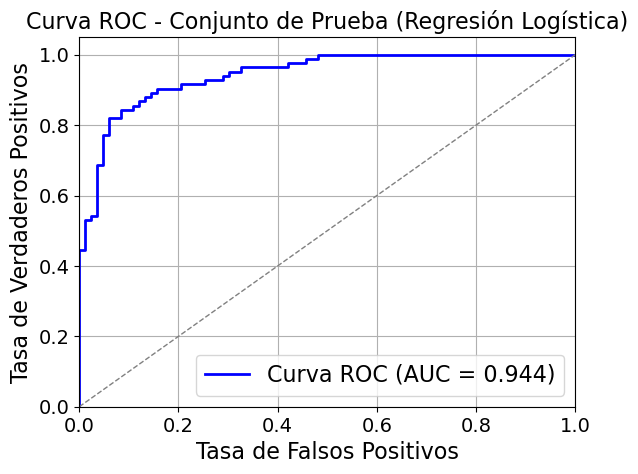

In [ ]:
resultados_lr_fp_BCL2,figura_rl_fp_BCL2,modelo_optimizado_rl_fp_BCL2=evaluar_lr(X_train_fp_BCL2,y_train_fp_BCL2,X_test_fp_BCL2,y_test_fp_BCL2)
resultados_lr_fp_BCL2

Mejores parámetros: {'metric': 'manhattan', 'n_neighbors': 9, 'weights': 'distance'}
Mejor precisión en CV (GridSearch): 0.9412452201800912


,Valor
Métrica,
Mejores hiperparámetros,"metric=euclidean, n_neighbors=9, weights=distance"
Exactitud (CV),0.866 (±0.024)
Precisión (CV),0.849 (±0.030)
Sensibilidad (CV),0.892 (±0.025)
F1-score (CV),0.870 (±0.023)
AUC (CV),0.940 (±0.026)
Exactitud (Prueba),0.862
Precisión (Prueba),0.877
Sensibilidad (Prueba),0.845


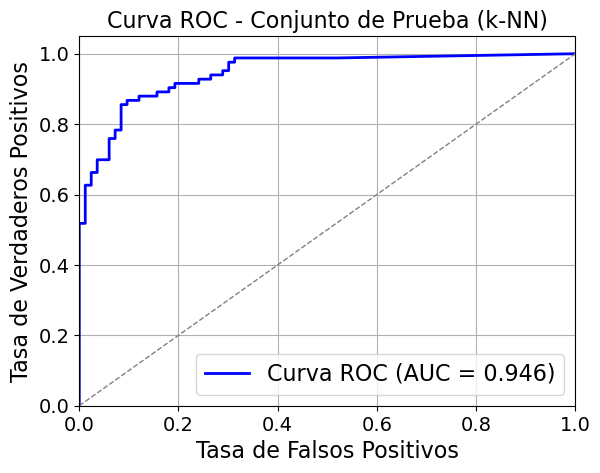

In [ ]:
# Knn
resultados_knn_fp_BCL2,figura_knn_fp_BCL2,modelo_optimizado_knn_fp_BCL2=evaluar_knn(X_train_fp_BCL2,y_train_fp_BCL2,X_test_fp_BCL2,y_test_fp_BCL2)
resultados_knn

Se diseñó una función alternativa para Naive Bayes, ya que el tipo de NB ideal para fingerprints es Bernouilli. Se probaran tambien diferentes valores de suavización de Laplace:

In [ ]:
from sklearn.naive_bayes import BernoulliNB
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

def evaluar_bernoulli_nb(X_train, y_train, X_test, y_test):
    # Modelo base
    nb = BernoulliNB()

    # Ajuste de hiperparámetros
    param_grid = {
        'alpha': [0, 1, 10]
    }

    metricas = ['accuracy', 'precision', 'recall', 'f1', 'roc_auc']
    grid_nb = GridSearchCV(nb, param_grid, cv=5, scoring=metricas, refit='roc_auc', n_jobs=-1)
    grid_nb.fit(X_train, y_train)

    # Mostrar mejores parámetros y la exactitud (accuracy)
    print("Mejores parámetros:", grid_nb.best_params_)
    print("Mejor precisión en CV (GridSearch):", grid_nb.best_score_)

    # Extraer métricas de validación cruzada
    resultados = {
        'Mejores hiperparámetros': ', '.join([f'{k}={v}' for k, v in grid_nb.best_params_.items()]),
        'Exactitud (CV)': f"{grid_nb.cv_results_['mean_test_accuracy'][grid_nb.best_index_]:.3f} (±{grid_nb.cv_results_['std_test_accuracy'][grid_nb.best_index_]:.3f})",
        'Precisión (CV)': f"{grid_nb.cv_results_['mean_test_precision'][grid_nb.best_index_]:.3f} (±{grid_nb.cv_results_['std_test_precision'][grid_nb.best_index_]:.3f})",
        'Sensibilidad (CV)': f"{grid_nb.cv_results_['mean_test_recall'][grid_nb.best_index_]:.3f} (±{grid_nb.cv_results_['std_test_recall'][grid_nb.best_index_]:.3f})",
        'F1-score (CV)': f"{grid_nb.cv_results_['mean_test_f1'][grid_nb.best_index_]:.3f} (±{grid_nb.cv_results_['std_test_f1'][grid_nb.best_index_]:.3f})",
        'AUC (CV)': f"{grid_nb.cv_results_['mean_test_roc_auc'][grid_nb.best_index_]:.3f} (±{grid_nb.cv_results_['std_test_roc_auc'][grid_nb.best_index_]:.3f})"
    }

    # Evaluación en test
    modelo_optimizado = grid_nb.best_estimator_
    y_pred = modelo_optimizado.predict(X_test)
    y_pred_proba = modelo_optimizado.predict_proba(X_test)[:, 1]

    resultados['Exactitud (Prueba)'] = f"{accuracy_score(y_test, y_pred):.3f}"
    resultados['Precisión (Prueba)'] = f"{precision_score(y_test, y_pred):.3f}"
    resultados['Sensibilidad (Prueba)'] = f"{recall_score(y_test, y_pred):.3f}"
    resultados['F1-score (Prueba)'] = f"{f1_score(y_test, y_pred):.3f}"
    resultados['AUC (Prueba)'] = f"{roc_auc_score(y_test, y_pred_proba):.3f}"

    # Curva ROC
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
    fig = plt.figure()
    plt.plot(fpr, tpr, color='blue', lw=2, label=f'Curva ROC (AUC = {roc_auc_score(y_test, y_pred_proba):.3f})')
    plt.plot([0, 1], [0, 1], color='gray', lw=1, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('Tasa de Falsos Positivos', fontsize=16)
    plt.ylabel('Tasa de Verdaderos Positivos', fontsize=16)
    plt.title('Curva ROC - Conjunto de Prueba (BernoulliNB)', fontsize=16)
    plt.legend(loc="lower right", fontsize=16)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.grid(True)

    # Tabla de resultados
    tabla_resultados = pd.DataFrame.from_dict(resultados, orient='index', columns=['Valor'])
    tabla_resultados.index.name = 'Métrica'

    return tabla_resultados, fig, modelo_optimizado


Mejores parámetros: {'alpha': 1}
Mejor precisión en CV (GridSearch): 0.8909508929183284


C:\Users\jorge\anaconda3\envs\tfm_bcl2\Lib\site-packages\sklearn\model_selection\_search.py:1108: UserWarning:

One or more of the test scores are non-finite: [       nan 0.89095089 0.89087003]



,Valor
Métrica,
Mejores hiperparámetros,alpha=1
Exactitud (CV),0.825 (±0.034)
Precisión (CV),0.850 (±0.025)
Sensibilidad (CV),0.791 (±0.083)
F1-score (CV),0.816 (±0.046)
AUC (CV),0.891 (±0.020)
Exactitud (Prueba),0.825
Precisión (Prueba),0.846
Sensibilidad (Prueba),0.795


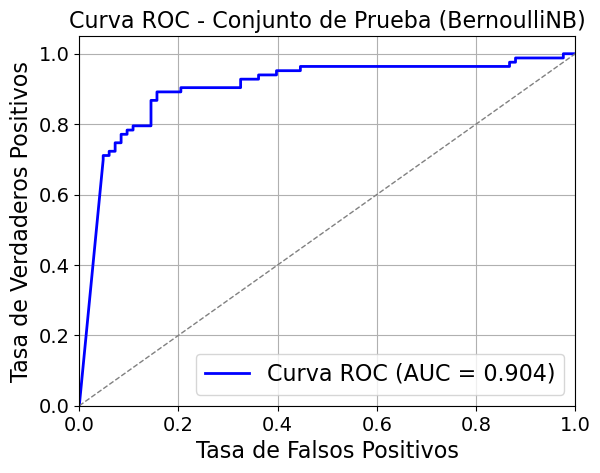

In [ ]:
# Naive Bayes
resultados_naive_bayes_fp_BCL2,figura_nb_fp_BCL2,modelo_optimizado_nb_fp_BCL2=evaluar_bernoulli_nb(X_train_fp_BCL2,y_train_fp_BCL2,X_test_fp_BCL2,y_test_fp_BCL2)
resultados_naive_bayes_fp_BCL2

Mejores parámetros: {'learning_rate': 0.1, 'max_depth': 7, 'min_samples_split': 5, 'n_estimators': 100}
Mejor precisión en CV (GridSearch): 0.9451633019475624


,Valor
Métrica,
Mejores hiperparámetros,"learning_rate=0.1, max_depth=7, min_samples_sp..."
Exactitud (CV),0.874 (±0.021)
Precisión (CV),0.862 (±0.038)
Sensibilidad (CV),0.897 (±0.061)
F1-score (CV),0.877 (±0.023)
AUC (CV),0.945 (±0.009)
Exactitud (Prueba),0.861
Precisión (Prueba),0.857
Sensibilidad (Prueba),0.867


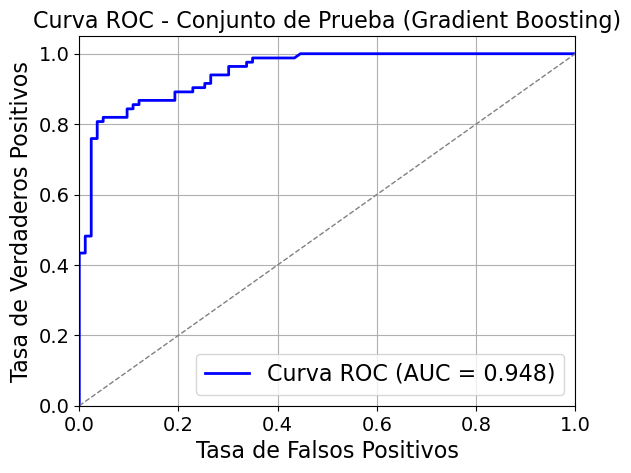

In [ ]:
# Gradient Boosting
resultados_gradient_boosting_fp_BCL2,figura_gb_fp_BCL2,modelo_optimizado_gb_fp_BCL2=evaluar_gradient_boosting(X_train_fp_BCL2,y_train_fp_BCL2,X_test_fp_BCL2,y_test_fp_BCL2)
resultados_gradient_boosting_fp_BCL2

Mejores parámetros: {'C': 10.0, 'kernel': 'rbf'}
Mejor precisión en CV (GridSearch): 0.9418835574195141


,Valor
Métrica,
Mejores hiperparámetros,"C=0.1, kernel=linear"
Exactitud (CV),0.868 (±0.014)
Precisión (CV),0.859 (±0.007)
Sensibilidad (CV),0.880 (±0.028)
F1-score (CV),0.869 (±0.015)
AUC (CV),0.930 (±0.016)
Exactitud (Prueba),0.856
Precisión (Prueba),0.875
Sensibilidad (Prueba),0.833


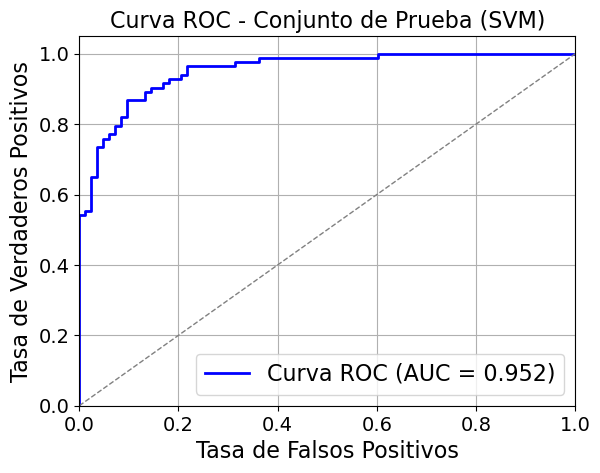

In [ ]:
# SVM
resultados_svm_fp_BCL2,figura_svm_fp_BCL2,modelo_optimizado_svm_fp_BCL2=evaluar_svm(X_train_fp_BCL2,y_train_fp_BCL2,X_test_fp_BCL2,y_test_fp_BCL2)
resultados_svm

Mejores parámetros: {'max_depth': 20, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}
Mejor precisión en CV (GridSearch): 0.9484893027973083


,Valor
Métrica,
Mejores hiperparámetros,"max_depth=20, max_features=sqrt, min_samples_l..."
Exactitud (CV),0.870 (±0.027)
Precisión (CV),0.857 (±0.018)
Sensibilidad (CV),0.891 (±0.078)
F1-score (CV),0.871 (±0.035)
AUC (CV),0.948 (±0.015)
Exactitud (Prueba),0.880
Precisión (Prueba),0.871
Sensibilidad (Prueba),0.892


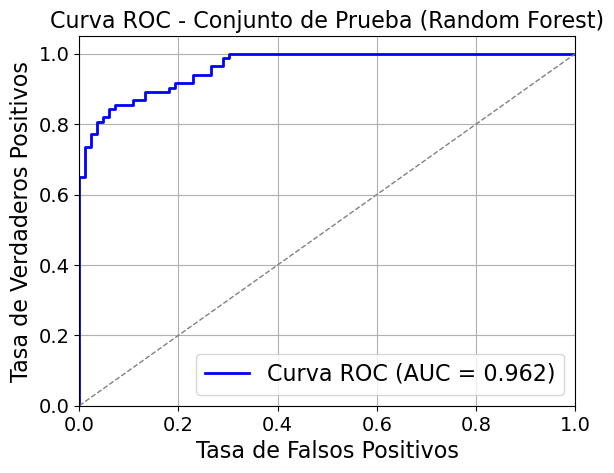

In [ ]:
# Random Forest
resultados_random_forest_fp_BCL2,figura_rf_fp_BCL2,modelo_optimizado_rf_fp_BCL2=evaluar_random_forest(X_train_fp_BCL2,y_train_fp_BCL2,X_test_fp_BCL2,y_test_fp_BCL2)
resultados_random_forest_fp_BCL2

Para las redes neuronales vamos a hacer alguna modificacion en la funcion:

In [ ]:
"""from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import GridSearchCV, cross_validate
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve
from sklearn.preprocessing import StandardScaler
import pandas as pd
import matplotlib.pyplot as plt

def evaluar_red_neuronal_fp(X_train, y_train, X_test, y_test):

    # Modelo base
    mlp = MLPClassifier(random_state=999, max_iter=500)  # max_iter aumentado para convergencia

    # Ajuste de hiperparámetros con GridSearchCV
    param_grid = {
        'hidden_layer_sizes': [(128,), (128, 64), (256, 128)],
        'activation': ['relu', 'tanh','logistic'],
        'alpha': [0.0001, 0.001, 0.01, 0.1]
    }
    grid_mlp = GridSearchCV(mlp, param_grid, cv=5, scoring='accuracy', n_jobs=-1)
    grid_mlp.fit(X_train, y_train)

    print("Mejores parámetros (MLP):", grid_mlp.best_params_)
    print("Mejor precisión en CV (MLP):", grid_mlp.best_score_)

    # Validación cruzada con el modelo optimizado
    modelo_optimizado = grid_mlp.best_estimator_
    metricas = ['accuracy', 'precision', 'recall', 'f1', 'roc_auc']
    resultados_cv = cross_validate(modelo_optimizado, X_train, y_train, cv=5, scoring=metricas)
    resultados = {
        'Exactitud (CV)': f"{resultados_cv['test_accuracy'].mean():.3f} (±{resultados_cv['test_accuracy'].std():.3f})",
        'Precisión (CV)': f"{resultados_cv['test_precision'].mean():.3f} (±{resultados_cv['test_precision'].std():.3f})",
        'Sensibilidad (CV)': f"{resultados_cv['test_recall'].mean():.3f} (±{resultados_cv['test_recall'].std():.3f})",
        'F1-score (CV)': f"{resultados_cv['test_f1'].mean():.3f} (±{resultados_cv['test_f1'].std():.3f})",
        'AUC (CV)': f"{resultados_cv['test_roc_auc'].mean():.3f} (±{resultados_cv['test_roc_auc'].std():.3f})"
    }

    # Evaluación en el conjunto de prueba
    y_pred = modelo_optimizado.predict(X_test)
    y_pred_proba = modelo_optimizado.predict_proba(X_test)[:, 1]  # Probabilidades para la clase positiva
    resultados['Exactitud (Prueba)'] = f"{accuracy_score(y_test, y_pred):.3f}"
    resultados['Precisión (Prueba)'] = f"{precision_score(y_test, y_pred):.3f}"
    resultados['Sensibilidad (Prueba)'] = f"{recall_score(y_test, y_pred):.3f}"
    resultados['F1-score (Prueba)'] = f"{f1_score(y_test, y_pred):.3f}"
    resultados['AUC (Prueba)'] = f"{roc_auc_score(y_test, y_pred_proba):.3f}"

    # Cálculo de la curva ROC
    fpr, tpr, _ = roc_curve(y_test, y_pred_proba)

    # Visualización de la curva ROC
    fig=plt.figure()
    plt.plot(fpr, tpr, color='blue', lw=2, label=f'Curva ROC (AUC = {roc_auc_score(y_test, y_pred_proba):.3f})')
    plt.plot([0, 1], [0, 1], color='gray', lw=1, linestyle='--')  # Línea diagonal
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('Tasa de Falsos Positivos (FPR)')
    plt.ylabel('Tasa de Verdaderos Positivos (TPR)')
    plt.title('Curva ROC - Conjunto de Prueba (Red Neuronal - Clasificación Binaria)')
    plt.legend(loc="lower right")
    plt.grid(True)

    # Tabla de resultados
    tabla_resultados = pd.DataFrame.from_dict(resultados, orient='index', columns=['Valor'])
    tabla_resultados.index.name = 'Métrica'

    return tabla_resultados,fig"""

'from sklearn.neural_network import MLPClassifier\nfrom sklearn.model_selection import GridSearchCV, cross_validate\nfrom sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve\nfrom sklearn.preprocessing import StandardScaler\nimport pandas as pd\nimport matplotlib.pyplot as plt\n\ndef evaluar_red_neuronal_fp(X_train, y_train, X_test, y_test):\n\n    # Modelo base\n    mlp = MLPClassifier(random_state=999, max_iter=500)  # max_iter aumentado para convergencia\n\n    # Ajuste de hiperparámetros con GridSearchCV\n    param_grid = {\n        \'hidden_layer_sizes\': [(128,), (128, 64), (256, 128)],\n        \'activation\': [\'relu\', \'tanh\',\'logistic\'],\n        \'alpha\': [0.0001, 0.001, 0.01, 0.1]\n    }\n    grid_mlp = GridSearchCV(mlp, param_grid, cv=5, scoring=\'accuracy\', n_jobs=-1)\n    grid_mlp.fit(X_train, y_train)\n\n    print("Mejores parámetros (MLP):", grid_mlp.best_params_)\n    print("Mejor precisión en CV (MLP):", grid

Mejores parámetros (MLP): {'activation': 'relu', 'alpha': 0.001, 'hidden_layer_sizes': (64,), 'learning_rate_init': 0.01, 'max_iter': 500, 'solver': 'adam'}
Mejor precisión en CV (MLP): 0.9415765524992119


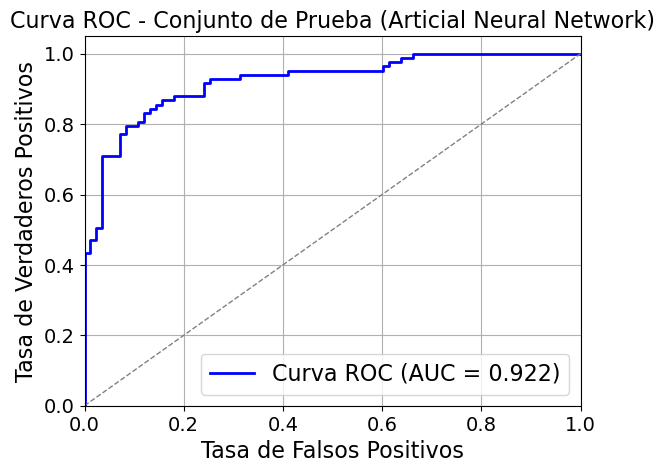

In [ ]:
# Red neuronal
resultados_red_neuronal_fp_BCL2,figura_rn_fp_BCL2,modelo_optimizado_rn_fp_BCL2=evaluar_red_neuronal(X_train_fp_BCL2,y_train_fp_BCL2,X_test_fp_BCL2,y_test_fp_BCL2)

In [ ]:
resultados_red_neuronal_fp_BCL2

,Valor
Métrica,
Mejores hiperparámetros,"activation=relu, alpha=0.001, hidden_layer_siz..."
Exactitud (CV),0.865 (±0.022)
Precisión (CV),0.846 (±0.038)
Sensibilidad (CV),0.900 (±0.070)
F1-score (CV),0.869 (±0.026)
AUC (CV),0.942 (±0.008)
Exactitud (Prueba),0.843
Precisión (Prueba),0.820
Sensibilidad (Prueba),0.880


## Resultados finales

In [ ]:
# Resultados finales
resultados_finales_fp_BCL2=pd.concat([resultados_lr_fp_BCL2,resultados_knn_fp_BCL2,resultados_naive_bayes_fp_BCL2,resultados_gradient_boosting_fp_BCL2,resultados_svm_fp_BCL2,resultados_random_forest_fp_BCL2,resultados_red_neuronal_fp_BCL2],axis=1)
resultados_finales_fp_BCL2.columns=['Regresión Logística','KNN','Naive Bayes','Gradient Boosting','SVM','Random Forest','Artificial Neural Network']
resultados_finales_fp_BCL2

,Regresión Logística,KNN,Naive Bayes,Gradient Boosting,SVM,Random Forest,Artificial Neural Network
Métrica,,,,,,,
Mejores hiperparámetros,"C=0.1, penalty=l2, solver=liblinear","metric=manhattan, n_neighbors=9, weights=distance",alpha=1,"learning_rate=0.1, max_depth=7, min_samples_sp...","C=10.0, kernel=rbf","max_depth=20, max_features=sqrt, min_samples_l...","activation=relu, alpha=0.001, hidden_layer_siz..."
Exactitud (CV),0.862 (±0.015),0.862 (±0.025),0.825 (±0.034),0.874 (±0.021),0.868 (±0.028),0.870 (±0.027),0.865 (±0.022)
Precisión (CV),0.848 (±0.030),0.847 (±0.019),0.850 (±0.025),0.862 (±0.038),0.858 (±0.033),0.857 (±0.018),0.846 (±0.038)
Sensibilidad (CV),0.888 (±0.060),0.885 (±0.053),0.791 (±0.083),0.897 (±0.061),0.888 (±0.079),0.891 (±0.078),0.900 (±0.070)
F1-score (CV),0.865 (±0.020),0.865 (±0.029),0.816 (±0.046),0.877 (±0.023),0.870 (±0.035),0.871 (±0.035),0.869 (±0.026)
AUC (CV),0.940 (±0.012),0.941 (±0.017),0.891 (±0.020),0.945 (±0.009),0.942 (±0.017),0.948 (±0.015),0.942 (±0.008)
Exactitud (Prueba),0.873,0.861,0.825,0.861,0.873,0.880,0.843
Precisión (Prueba),0.878,0.849,0.846,0.857,0.878,0.871,0.820
Sensibilidad (Prueba),0.867,0.880,0.795,0.867,0.867,0.892,0.880


# Fingerprints para MCL1

## Generación de los fingerprints

Obtenemos los fingerprints

In [ ]:
fingerprints_MCL1,indices_invalidos_MCL1=calcular_morgan_fingerprints(set_ic50_mcl1["Smiles"],return_invalid=True)
print(np.shape(fingerprints_MCL1))
print(fingerprints_MCL1[0])
print(indices_invalidos_MCL1)

(1761, 2048)
[0 0 0 ... 0 0 0]
[]


Añadimos los IDs y el standard valude de cada molecula:

In [ ]:
fingerprints_MCL1=pd.DataFrame(fingerprints_MCL1)
fingerprints_MCL1_df=pd.concat([set_ic50_mcl1["Molecule ChEMBL ID"],fingerprints_MCL1,set_ic50_mcl1["Standard Value"]],axis=1)
fingerprints_MCL1_df

,Molecule ChEMBL ID,0,1,2,3,4,5,6,7,8,...,2039,2040,2041,2042,2043,2044,2045,2046,2047,Standard Value
0,CHEMBL4443085,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.042
1,CHEMBL5174729,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0.060
2,CHEMBL4553660,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0.200
3,CHEMBL4535151,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0.200
4,CHEMBL4580244,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,1,0.200
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1756,CHEMBL4439276,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1000000.000
1757,CHEMBL1824802,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,1000000.000
1758,CHEMBL1824810,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1000000.000
1759,CHEMBL395653,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1425000.000


## Procesado de los fingerprints

Comprobaremos el tipo de variables y si hay valores nulos

---



In [ ]:
fingerprints_MCL1_df.info()
fingerprints_MCL1_df.select_dtypes(include=['object']).columns

# Comprobacion si hay valores nulos
print(fingerprints_MCL1_df.isna().sum().any())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1761 entries, 0 to 1760
Columns: 2050 entries, Molecule ChEMBL ID to Standard Value
dtypes: float64(1), int8(2048), object(1)
memory usage: 3.5+ MB
False


Eliminamos filas duplicadas

In [ ]:
fingerprints_MCL1_no_dup=fingerprints_MCL1_df.loc[~fingerprints_MCL1_df.duplicated(subset=fingerprints_MCL1_df.columns[1:-1], keep="first")]
fingerprints_MCL1_no_dup.reset_index(drop=True, inplace=True)
fingerprints_MCL1_no_dup.shape
fingerprints_MCL1_no_dup

,Molecule ChEMBL ID,0,1,2,3,4,5,6,7,8,...,2039,2040,2041,2042,2043,2044,2045,2046,2047,Standard Value
0,CHEMBL4443085,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.042
1,CHEMBL5174729,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0.060
2,CHEMBL4553660,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0.200
3,CHEMBL4535151,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0.200
4,CHEMBL4580244,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,1,0.200
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1740,CHEMBL4529605,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,520000.000
1741,CHEMBL4439276,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1000000.000
1742,CHEMBL1824802,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,1000000.000
1743,CHEMBL395653,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1425000.000


Se han eliminado 16 filas con los mismos valores para todos los fingerprints

Añadimos la columna actividad

In [ ]:
fingerprints_ic50_MCL1=crear_columna_binaria_actividad(fingerprints_MCL1_no_dup.copy())
fingerprints_ic50_MCL1=fingerprints_ic50_MCL1.drop(columns=["Standard Value"])
fingerprints_ic50_MCL1.reset_index(drop=True, inplace=True)
fingerprints_ic50_MCL1

El umbral de corte de Standard Value (mediana ) es: 3800.0


,Molecule ChEMBL ID,0,1,2,3,4,5,6,7,8,...,2039,2040,2041,2042,2043,2044,2045,2046,2047,Actividad
0,CHEMBL4443085,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
1,CHEMBL5174729,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,1
2,CHEMBL4553660,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,1
3,CHEMBL4535151,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,1
4,CHEMBL4580244,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1740,CHEMBL4529605,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1741,CHEMBL4439276,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1742,CHEMBL1824802,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
1743,CHEMBL395653,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


## División en entrenamiento y prueba

Dividimos en entrenamiento y prueba

In [ ]:
from sklearn.model_selection import train_test_split
# En primer lugar separamos los IDs y las etiquetas
X_fp_MCL1=fingerprints_ic50_MCL1.iloc[:,1:-1]
y_fp_MCL1=fingerprints_ic50_MCL1["Actividad"]
# Realizamos una división 80/20
X_train_fp_MCL1,X_test_fp_MCL1,y_train_fp_MCL1,y_test_fp_MCL1=train_test_split(X_fp_MCL1,y_fp_MCL1,test_size=0.2,random_state=999,stratify=y_fp_MCL1)# indicamos stratify=y para mantener las clases balanceadas
# Verificamos el tamaño de los conjuntos
print("Entrenamiento:", X_train_fp_MCL1.shape)
print("Prueba:", X_test_fp_MCL1.shape)

Entrenamiento: (1396, 2048)
Prueba: (349, 2048)


## Modelos de machine learning

Entrenamos los modelos

Mejores parámetros: {'C': 0.1, 'penalty': 'l2', 'solver': 'liblinear'}
Mejor Exactitud (accuracy) en CV (GridSearch): 0.6991042431361033


,Valor
Métrica,
Mejores hiperparámetros,"C=0.1, penalty=l2, solver=liblinear"
Exactitud (CV),0.649 (±0.014)
Precisión (CV),0.652 (±0.018)
Sensibilidad (CV),0.640 (±0.021)
F1-score (CV),0.646 (±0.014)
AUC (CV),0.699 (±0.005)
Exactitud (Prueba),0.670
Precisión (Prueba),0.697
Sensibilidad (Prueba),0.606


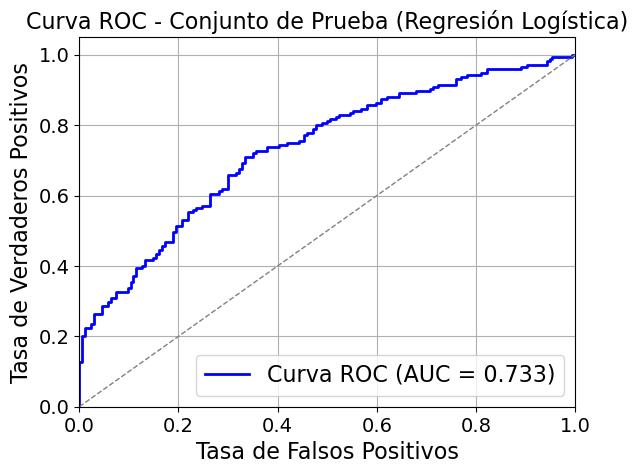

In [ ]:
# Regresion logistica
resultados_lr_fp_MCL1,figura_rl_fp_MCL1,modelo_optimizado_rl_fp_MCL1=evaluar_lr(X_train_fp_MCL1,y_train_fp_MCL1,X_test_fp_MCL1,y_test_fp_MCL1)
resultados_lr_fp_MCL1

Mejores parámetros: {'metric': 'manhattan', 'n_neighbors': 7, 'weights': 'distance'}
Mejor precisión en CV (GridSearch): 0.7284336000587286


,Valor
Métrica,
Mejores hiperparámetros,"metric=manhattan, n_neighbors=7, weights=distance"
Exactitud (CV),0.668 (±0.010)
Precisión (CV),0.681 (±0.015)
Sensibilidad (CV),0.633 (±0.018)
F1-score (CV),0.656 (±0.011)
AUC (CV),0.728 (±0.024)
Exactitud (Prueba),0.636
Precisión (Prueba),0.646
Sensibilidad (Prueba),0.606


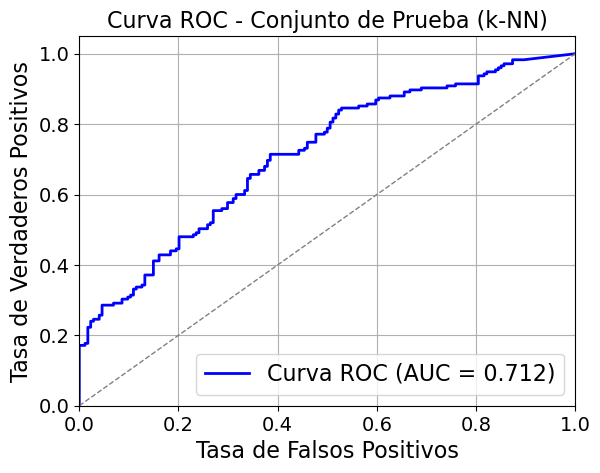

In [ ]:
# KNN
resultados_knn_fp_MCL1,figura_knn_fp_MCL1,modelo_optimizado_knn_fp_MCL1=evaluar_knn(X_train_fp_MCL1,y_train_fp_MCL1,X_test_fp_MCL1,y_test_fp_MCL1)
resultados_knn_fp_MCL1

Mejores parámetros: {'alpha': 1}
Mejor precisión en CV (GridSearch): 0.6796075833210982


C:\Users\jorge\anaconda3\envs\tfm_bcl2\Lib\site-packages\sklearn\model_selection\_search.py:1108: UserWarning:

One or more of the test scores are non-finite: [       nan 0.67960758 0.67388871]



,Valor
Métrica,
Mejores hiperparámetros,alpha=1
Exactitud (CV),0.615 (±0.015)
Precisión (CV),0.650 (±0.023)
Sensibilidad (CV),0.497 (±0.020)
F1-score (CV),0.563 (±0.018)
AUC (CV),0.680 (±0.009)
Exactitud (Prueba),0.642
Precisión (Prueba),0.702
Sensibilidad (Prueba),0.497


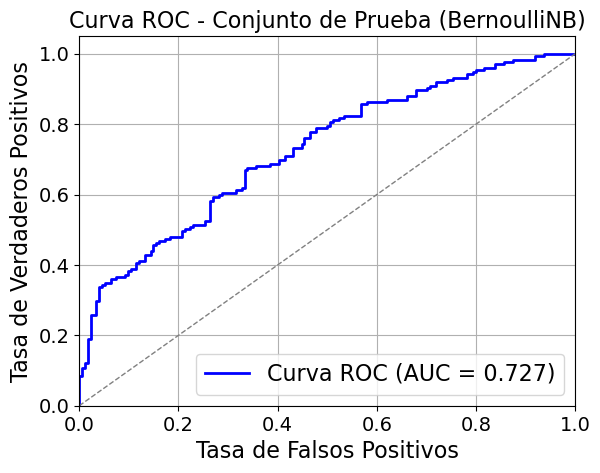

In [ ]:
# Naive Bayes
resultados_naive_bayes_fp_MCL1,figura_nb_fp_MCL1,modelo_optimizado_nb_fp_MCL1=evaluar_bernoulli_nb(X_train_fp_MCL1,y_train_fp_MCL1,X_test_fp_MCL1,y_test_fp_MCL1)
resultados_naive_bayes_fp_MCL1

Mejores parámetros: {'learning_rate': 0.1, 'max_depth': 7, 'min_samples_split': 2, 'n_estimators': 50}
Mejor precisión en CV (GridSearch): 0.7033095727499633


,Valor
Métrica,
Mejores hiperparámetros,"learning_rate=0.1, max_depth=7, min_samples_sp..."
Exactitud (CV),0.649 (±0.017)
Precisión (CV),0.650 (±0.017)
Sensibilidad (CV),0.647 (±0.037)
F1-score (CV),0.648 (±0.023)
AUC (CV),0.703 (±0.024)
Exactitud (Prueba),0.642
Precisión (Prueba),0.658
Sensibilidad (Prueba),0.594


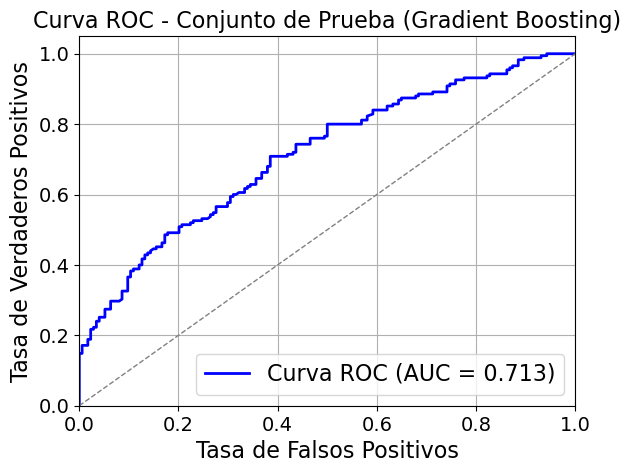

In [ ]:
# Gradient Boosting
resultados_gradient_boosting_fp_MCL1,figura_gb_fp_MCL1,modelo_optimizado_gb_fp_MCL1=evaluar_gradient_boosting(X_train_fp_MCL1,y_train_fp_MCL1,X_test_fp_MCL1,y_test_fp_MCL1)
resultados_gradient_boosting_fp_MCL1

Mejores parámetros: {'C': 1.0, 'kernel': 'rbf'}
Mejor precisión en CV (GridSearch): 0.7327155336954926


,Valor
Métrica,
Mejores hiperparámetros,"C=1.0, kernel=rbf"
Exactitud (CV),0.672 (±0.003)
Precisión (CV),0.689 (±0.011)
Sensibilidad (CV),0.628 (±0.030)
F1-score (CV),0.656 (±0.012)
AUC (CV),0.733 (±0.008)
Exactitud (Prueba),0.656
Precisión (Prueba),0.677
Sensibilidad (Prueba),0.600


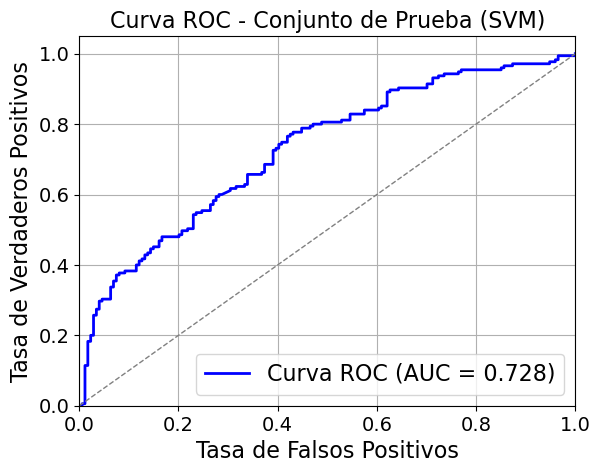

In [ ]:
# SVM
resultados_svm_fp_MCL1,figura_svm_fp_MCL1,modelo_optimizado_svm_fp_MCL1=evaluar_svm(X_train_fp_MCL1,y_train_fp_MCL1,X_test_fp_MCL1,y_test_fp_MCL1)
resultados_svm_fp_MCL1

Mejores parámetros: {'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 300}
Mejor precisión en CV (GridSearch): 0.7388147849067683


,Valor
Métrica,
Mejores hiperparámetros,"max_depth=None, max_features=sqrt, min_samples..."
Exactitud (CV),0.681 (±0.016)
Precisión (CV),0.698 (±0.014)
Sensibilidad (CV),0.636 (±0.028)
F1-score (CV),0.665 (±0.021)
AUC (CV),0.739 (±0.011)
Exactitud (Prueba),0.659
Precisión (Prueba),0.679
Sensibilidad (Prueba),0.606


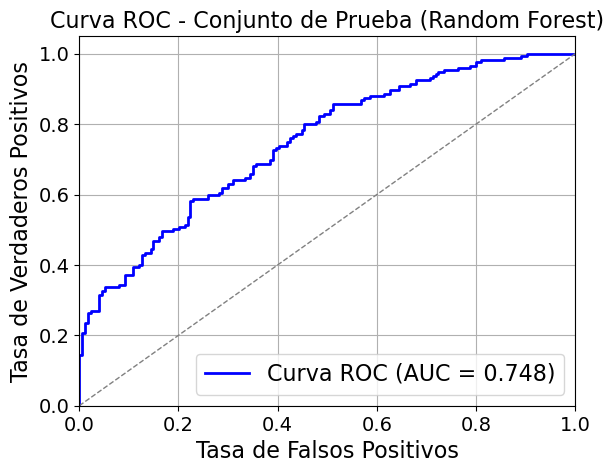

In [ ]:
# Random Forest
resultados_random_forest_fp_MCL1,figura_rf_fp_MCL1,modelo_optimizado_rf_fp_MCL1=evaluar_random_forest(X_train_fp_MCL1,y_train_fp_MCL1,X_test_fp_MCL1,y_test_fp_MCL1)
resultados_random_forest_fp_MCL1

Mejores parámetros (MLP): {'activation': 'relu', 'alpha': 0.001, 'hidden_layer_sizes': (64, 32), 'learning_rate_init': 0.01, 'max_iter': 500, 'solver': 'adam'}
Mejor precisión en CV (MLP): 0.6857273528116282


,Valor
Métrica,
Mejores hiperparámetros,"activation=relu, alpha=0.001, hidden_layer_siz..."
Exactitud (CV),0.634 (±0.027)
Precisión (CV),0.628 (±0.028)
Sensibilidad (CV),0.660 (±0.042)
F1-score (CV),0.643 (±0.027)
AUC (CV),0.686 (±0.011)
Exactitud (Prueba),0.633
Precisión (Prueba),0.637
Sensibilidad (Prueba),0.623


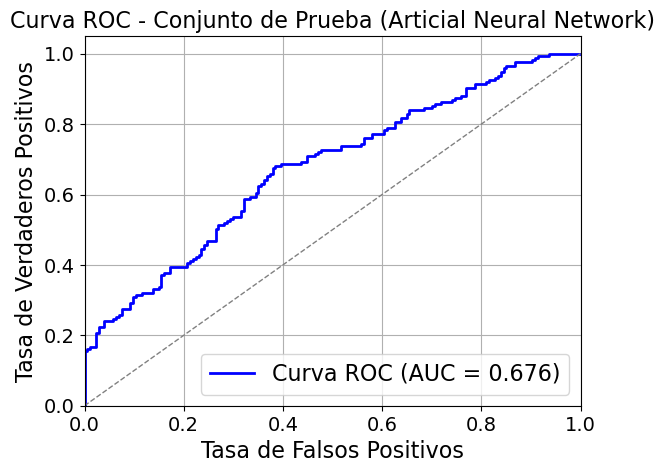

In [ ]:
# Red neuronal artifical
resultados_red_neuronal_fp_MCL1,figura_rn_fp_MCL1,modelo_optimizado_rn_fp_MCL1=evaluar_red_neuronal(X_train_fp_MCL1,y_train_fp_MCL1,X_test_fp_MCL1,y_test_fp_MCL1)
resultados_red_neuronal_fp_MCL1

## Resultados finales

In [ ]:
# Tabla de resultados
resultados_finales_fp_MCL1=pd.concat([resultados_lr_fp_MCL1,resultados_knn_fp_MCL1,resultados_naive_bayes_fp_MCL1,resultados_gradient_boosting_fp_MCL1,resultados_svm_fp_MCL1,resultados_random_forest_fp_MCL1,resultados_red_neuronal_fp_MCL1],axis=1)
resultados_finales_fp_MCL1.columns=['Regresión Logística','KNN','Naive Bayes','Gradient Boosting','SVM','Random Forest','Artificial Neural Network']
resultados_finales_fp_MCL1

,Regresión Logística,KNN,Naive Bayes,Gradient Boosting,SVM,Random Forest,Artificial Neural Network
Métrica,,,,,,,
Mejores hiperparámetros,"C=0.1, penalty=l2, solver=liblinear","metric=manhattan, n_neighbors=7, weights=distance",alpha=1,"learning_rate=0.1, max_depth=7, min_samples_sp...","C=1.0, kernel=rbf","max_depth=None, max_features=sqrt, min_samples...","activation=relu, alpha=0.001, hidden_layer_siz..."
Exactitud (CV),0.649 (±0.014),0.668 (±0.010),0.615 (±0.015),0.649 (±0.017),0.672 (±0.003),0.681 (±0.016),0.634 (±0.027)
Precisión (CV),0.652 (±0.018),0.681 (±0.015),0.650 (±0.023),0.650 (±0.017),0.689 (±0.011),0.698 (±0.014),0.628 (±0.028)
Sensibilidad (CV),0.640 (±0.021),0.633 (±0.018),0.497 (±0.020),0.647 (±0.037),0.628 (±0.030),0.636 (±0.028),0.660 (±0.042)
F1-score (CV),0.646 (±0.014),0.656 (±0.011),0.563 (±0.018),0.648 (±0.023),0.656 (±0.012),0.665 (±0.021),0.643 (±0.027)
AUC (CV),0.699 (±0.005),0.728 (±0.024),0.680 (±0.009),0.703 (±0.024),0.733 (±0.008),0.739 (±0.011),0.686 (±0.011)
Exactitud (Prueba),0.670,0.636,0.642,0.642,0.656,0.659,0.633
Precisión (Prueba),0.697,0.646,0.702,0.658,0.677,0.679,0.637
Sensibilidad (Prueba),0.606,0.606,0.497,0.594,0.600,0.606,0.623


## Flujo de trabajo alternativo para fingerprints MCL1

Eliminamos el 70 % de las moleculas con mayor valor de standard value:

In [ ]:
fingerprints_MCL1_no_dup_del=eliminar_porcentaje_ic50_alto(fingerprints_MCL1_no_dup,0.7)
fingerprints_MCL1_no_dup_del.shape

Porcentaje eliminado: 70.0%
El punto de corte para la eliminación de un IC50 superior ha sido: 2262.57 nM
Moléculas eliminadas: 1221
Moléculas restantes: 524
Mediana de las moleculas restantes es: 1077.55 nM
Cuartil 25 de las moleculas restantes es: 320.75 nM


(524, 2050)

Creamos la columna actividad:

In [ ]:
fingerprints_ic50_MCL1_del=crear_columna_binaria_actividad(fingerprints_MCL1_no_dup_del.copy())
fingerprints_ic50_MCL1_del=fingerprints_ic50_MCL1_del.drop(columns=["Standard Value"])
fingerprints_ic50_MCL1_del.reset_index(drop=True, inplace=True)
fingerprints_ic50_MCL1_del

El umbral de corte de Standard Value (mediana ) es: 1077.55


,Molecule ChEMBL ID,0,1,2,3,4,5,6,7,8,...,2039,2040,2041,2042,2043,2044,2045,2046,2047,Actividad
0,CHEMBL4443085,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
1,CHEMBL5174729,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,1
2,CHEMBL4553660,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,1
3,CHEMBL4535151,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,1
4,CHEMBL4580244,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
519,CHEMBL3126319,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
520,CHEMBL3952474,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
521,CHEMBL3940844,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
522,CHEMBL3191831,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


Dividimos en entrenamiento y prueba

In [ ]:
X_fp_MCL1_del=fingerprints_ic50_MCL1_del.iloc[:,1:-1]
y_fp_MCL1_del=fingerprints_ic50_MCL1_del["Actividad"]
# Realizamos una división 80/20
X_train_fp_MCL1_del,X_test_fp_MCL1_del,y_train_fp_MCL1_del,y_test_fp_MCL1_del=train_test_split(X_fp_MCL1_del,y_fp_MCL1_del,test_size=0.2,random_state=999,stratify=y_fp_MCL1_del)# indicamos stratify=y para mantener las clases balanceadas
# Verificamos el tamaño de los conjuntos
print("Entrenamiento:", X_train_fp_MCL1_del.shape)
print("Prueba:", X_test_fp_MCL1_del.shape)

Entrenamiento: (419, 2048)
Prueba: (105, 2048)


### Modelos de Machine learning

Mejores parámetros: {'C': 1, 'penalty': 'l1', 'solver': 'liblinear'}
Mejor Exactitud (accuracy) en CV (GridSearch): 0.8544176207068194


,Valor
Métrica,
Mejores hiperparámetros,"C=1, penalty=l1, solver=liblinear"
Exactitud (CV),0.800 (±0.030)
Precisión (CV),0.812 (±0.027)
Sensibilidad (CV),0.781 (±0.049)
F1-score (CV),0.796 (±0.034)
AUC (CV),0.854 (±0.025)
Exactitud (Prueba),0.695
Precisión (Prueba),0.672
Sensibilidad (Prueba),0.750


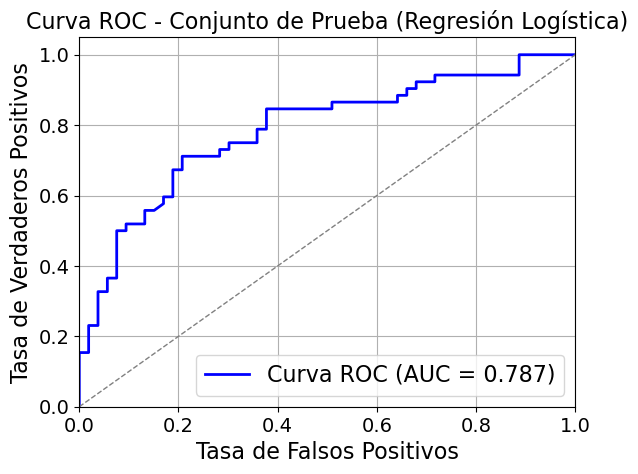

In [ ]:
# Regresion logistica
resultados_lr_fp_MCL1_del,figura_rl_fp_MCL1_del,modelo_optimizado_rl_fp_MCL1_del=evaluar_lr(X_train_fp_MCL1_del,y_train_fp_MCL1_del,X_test_fp_MCL1_del,y_test_fp_MCL1_del)
resultados_lr_fp_MCL1_del

Mejores parámetros: {'metric': 'manhattan', 'n_neighbors': 5, 'weights': 'distance'}
Mejor precisión en CV (GridSearch): 0.8319174824401305


,Valor
Métrica,
Mejores hiperparámetros,"metric=manhattan, n_neighbors=5, weights=distance"
Exactitud (CV),0.788 (±0.027)
Precisión (CV),0.829 (±0.029)
Sensibilidad (CV),0.729 (±0.068)
F1-score (CV),0.773 (±0.038)
AUC (CV),0.832 (±0.034)
Exactitud (Prueba),0.752
Precisión (Prueba),0.783
Sensibilidad (Prueba),0.692


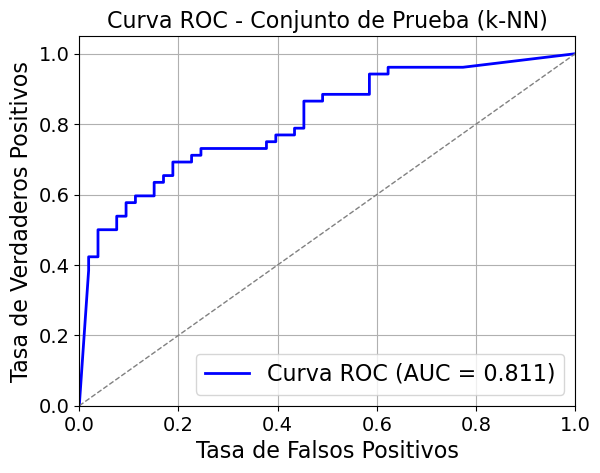

In [ ]:
# KNN
resultados_knn_fp_MCL1_del,figura_knn_fp_MCL1_del,modelo_optimizado_knn_fp_MCL1_del=evaluar_knn(X_train_fp_MCL1_del,y_train_fp_MCL1_del,X_test_fp_MCL1_del,y_test_fp_MCL1_del)
resultados_knn_fp_MCL1_del

Mejores parámetros: {'alpha': 1}
Mejor precisión en CV (GridSearch): 0.8502295227033903


C:\Users\jorge\anaconda3\envs\tfm_bcl2\Lib\site-packages\sklearn\model_selection\_search.py:1108: UserWarning:

One or more of the test scores are non-finite: [       nan 0.85022952 0.84398955]



,Valor
Métrica,
Mejores hiperparámetros,alpha=1
Exactitud (CV),0.795 (±0.038)
Precisión (CV),0.858 (±0.038)
Sensibilidad (CV),0.710 (±0.082)
F1-score (CV),0.774 (±0.051)
AUC (CV),0.850 (±0.031)
Exactitud (Prueba),0.733
Precisión (Prueba),0.761
Sensibilidad (Prueba),0.673


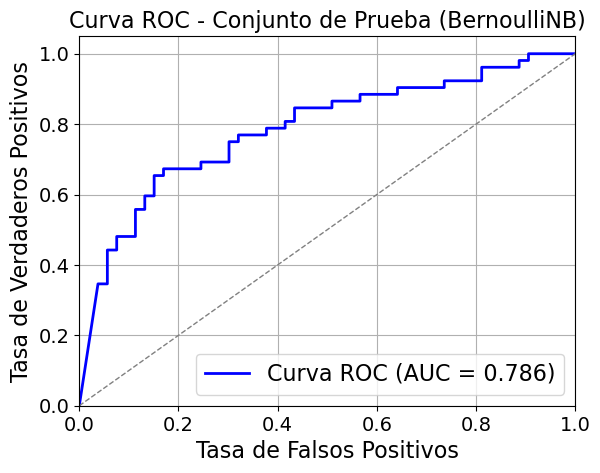

In [ ]:
# Naive Bayes
resultados_naive_bayes_fp_MCL1_del,figura_nb_fp_MCL1_del,modelo_optimizado_nb_fp_MCL1_del=evaluar_bernoulli_nb(X_train_fp_MCL1_del,y_train_fp_MCL1_del,X_test_fp_MCL1_del,y_test_fp_MCL1_del)
resultados_naive_bayes_fp_MCL1_del

Mejores parámetros: {'learning_rate': 0.2, 'max_depth': 3, 'min_samples_split': 2, 'n_estimators': 50}
Mejor precisión en CV (GridSearch): 0.8440324097118523


,Valor
Métrica,
Mejores hiperparámetros,"learning_rate=0.2, max_depth=3, min_samples_sp..."
Exactitud (CV),0.778 (±0.020)
Precisión (CV),0.802 (±0.032)
Sensibilidad (CV),0.743 (±0.046)
F1-score (CV),0.770 (±0.023)
AUC (CV),0.844 (±0.012)
Exactitud (Prueba),0.733
Precisión (Prueba),0.731
Sensibilidad (Prueba),0.731


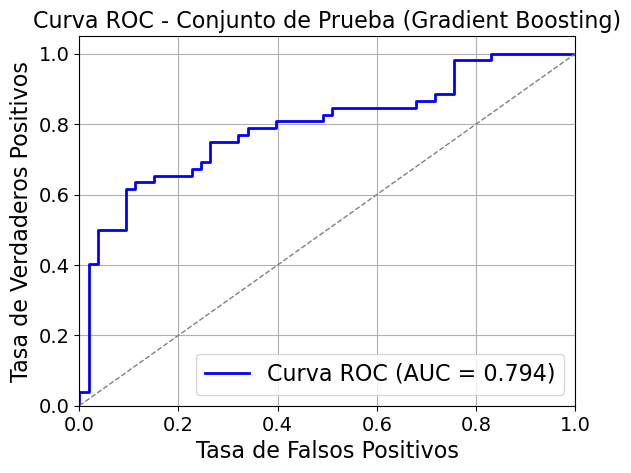

In [ ]:
# Gradient Boosting
resultados_gradient_boosting_fp_MCL1_del,figura_gb_fp_MCL1_del,modelo_optimizado_gb_fp_MCL1_del=evaluar_gradient_boosting(X_train_fp_MCL1_del,y_train_fp_MCL1_del,X_test_fp_MCL1_del,y_test_fp_MCL1_del)
resultados_gradient_boosting_fp_MCL1_del

Mejores parámetros: {'C': 1.0, 'kernel': 'rbf'}
Mejor precisión en CV (GridSearch): 0.8441209003926774


,Valor
Métrica,
Mejores hiperparámetros,"C=1.0, kernel=rbf"
Exactitud (CV),0.804 (±0.028)
Precisión (CV),0.872 (±0.046)
Sensibilidad (CV),0.719 (±0.070)
F1-score (CV),0.785 (±0.037)
AUC (CV),0.844 (±0.025)
Exactitud (Prueba),0.714
Precisión (Prueba),0.720
Sensibilidad (Prueba),0.692


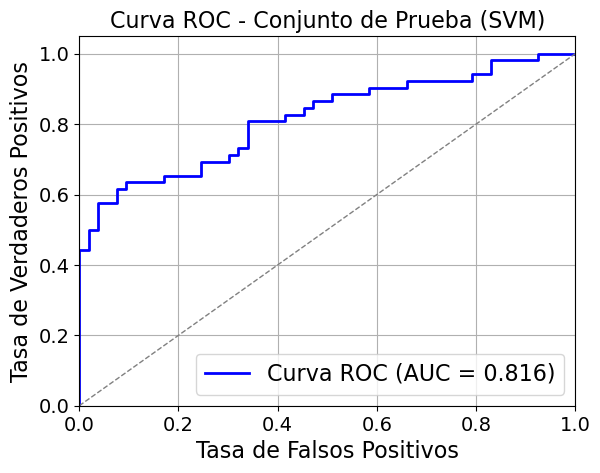

In [ ]:
# SVM
resultados_svm_fp_MCL1_del,figura_svm_fp_MCL1_del,modelo_optimizado_svm_fp_MCL1_del=evaluar_svm(X_train_fp_MCL1_del,y_train_fp_MCL1_del,X_test_fp_MCL1_del,y_test_fp_MCL1_del)
resultados_svm_fp_MCL1_del

Mejores parámetros: {'max_depth': None, 'max_features': 'log2', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 300}
Mejor precisión en CV (GridSearch): 0.8626845860295338


,Valor
Métrica,
Mejores hiperparámetros,"max_depth=None, max_features=log2, min_samples..."
Exactitud (CV),0.814 (±0.035)
Precisión (CV),0.873 (±0.043)
Sensibilidad (CV),0.738 (±0.062)
F1-score (CV),0.798 (±0.042)
AUC (CV),0.863 (±0.024)
Exactitud (Prueba),0.743
Precisión (Prueba),0.755
Sensibilidad (Prueba),0.712


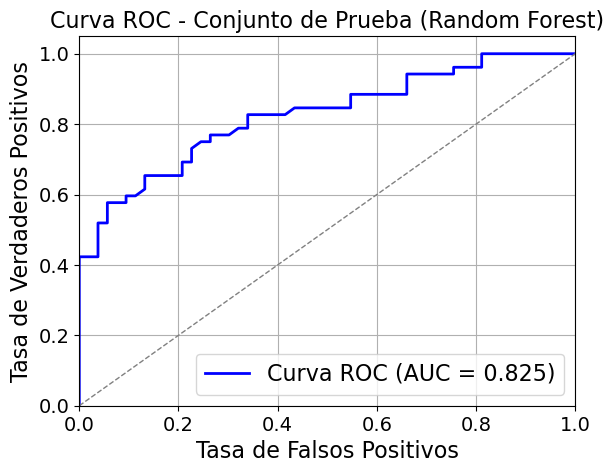

In [ ]:
# Random Forest
resultados_random_forest_fp_MCL1_del,figura_rf_fp_MCL1_del,modelo_optimizado_rf_fp_MCL1_del=evaluar_random_forest(X_train_fp_MCL1_del,y_train_fp_MCL1_del,X_test_fp_MCL1_del,y_test_fp_MCL1_del)
resultados_random_forest_fp_MCL1_del

Mejores parámetros (MLP): {'activation': 'logistic', 'alpha': 0.001, 'hidden_layer_sizes': (64, 32), 'learning_rate_init': 0.1, 'max_iter': 500, 'solver': 'adam'}
Mejor precisión en CV (MLP): 0.8254244787345832


,Valor
Métrica,
Mejores hiperparámetros,"activation=logistic, alpha=0.001, hidden_layer..."
Exactitud (CV),0.771 (±0.034)
Precisión (CV),0.776 (±0.048)
Sensibilidad (CV),0.771 (±0.049)
F1-score (CV),0.772 (±0.028)
AUC (CV),0.825 (±0.030)
Exactitud (Prueba),0.771
Precisión (Prueba),0.780
Sensibilidad (Prueba),0.750


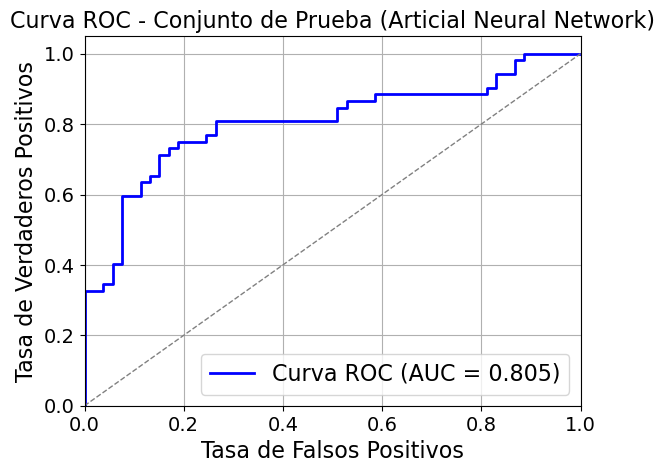

In [ ]:
# Artifical neural network
resultados_red_neuronal_fp_MCL1_del,figura_rn_fp_MCL1_del,modelo_optimizado_rn_fp_MCL1_del=evaluar_red_neuronal(X_train_fp_MCL1_del,y_train_fp_MCL1_del,X_test_fp_MCL1_del,y_test_fp_MCL1_del)
resultados_red_neuronal_fp_MCL1_del

### Resultados finales

In [ ]:
# Tabla de resultados finales
resultados_finales_fp_MCL1_del=pd.concat([resultados_lr_fp_MCL1_del,resultados_knn_fp_MCL1_del,resultados_naive_bayes_fp_MCL1_del,resultados_gradient_boosting_fp_MCL1_del,resultados_svm_fp_MCL1_del,resultados_random_forest_fp_MCL1_del,resultados_red_neuronal_fp_MCL1_del],axis=1)
resultados_finales_fp_MCL1_del.columns=['Regresión Logística','KNN','Naive Bayes','Gradient Boosting','SVM','Random Forest','Artificial Neural Network']
resultados_finales_fp_MCL1_del

,Regresión Logística,KNN,Naive Bayes,Gradient Boosting,SVM,Random Forest,Artificial Neural Network
Métrica,,,,,,,
Mejores hiperparámetros,"C=1, penalty=l1, solver=liblinear","metric=manhattan, n_neighbors=5, weights=distance",alpha=1,"learning_rate=0.2, max_depth=3, min_samples_sp...","C=1.0, kernel=rbf","max_depth=None, max_features=log2, min_samples...","activation=logistic, alpha=0.001, hidden_layer..."
Exactitud (CV),0.800 (±0.030),0.788 (±0.027),0.795 (±0.038),0.778 (±0.020),0.804 (±0.028),0.814 (±0.035),0.771 (±0.034)
Precisión (CV),0.812 (±0.027),0.829 (±0.029),0.858 (±0.038),0.802 (±0.032),0.872 (±0.046),0.873 (±0.043),0.776 (±0.048)
Sensibilidad (CV),0.781 (±0.049),0.729 (±0.068),0.710 (±0.082),0.743 (±0.046),0.719 (±0.070),0.738 (±0.062),0.771 (±0.049)
F1-score (CV),0.796 (±0.034),0.773 (±0.038),0.774 (±0.051),0.770 (±0.023),0.785 (±0.037),0.798 (±0.042),0.772 (±0.028)
AUC (CV),0.854 (±0.025),0.832 (±0.034),0.850 (±0.031),0.844 (±0.012),0.844 (±0.025),0.863 (±0.024),0.825 (±0.030)
Exactitud (Prueba),0.695,0.752,0.733,0.733,0.714,0.743,0.771
Precisión (Prueba),0.672,0.783,0.761,0.731,0.720,0.755,0.780
Sensibilidad (Prueba),0.750,0.692,0.673,0.731,0.692,0.712,0.750


# Fingerprints BCLXL

## Generación de los fingerprints moleculares

Extraemos los fingerprints para BCLXL

In [ ]:
fingerprints_BCLXL,indices_invalidos_BCLXL=calcular_morgan_fingerprints(set_ic50_bclxl["Smiles"],return_invalid=True)
print(np.shape(fingerprints_BCLXL))
print(fingerprints_BCLXL[0])
print(indices_invalidos_BCLXL)

(782, 2048)
[0 1 0 ... 0 0 0]
[]


Añadimos los IDs y el standard valude de cada molecula:

In [ ]:
fingerprints_BCLXL=pd.DataFrame(fingerprints_BCLXL)
fingerprints_BCLXL_df=pd.concat([set_ic50_bclxl["Molecule ChEMBL ID"],fingerprints_BCLXL,set_ic50_bclxl["Standard Value"]],axis=1)
fingerprints_BCLXL_df

,Molecule ChEMBL ID,0,1,2,3,4,5,6,7,8,...,2039,2040,2041,2042,2043,2044,2045,2046,2047,Standard Value
0,CHEMBL376408,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.5
1,CHEMBL3916642,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.5
2,CHEMBL3703622,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.5
3,CHEMBL4111781,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.5
4,CHEMBL3703617,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
777,CHEMBL1165054,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,380000.0
778,CHEMBL1164460,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,400000.0
779,CHEMBL2063880,0,1,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,453000.0
780,CHEMBL2063890,0,1,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,547000.0


## Procesamiento de los fingerprints

Comprobaremos el tipo de variables y si hay valores nulos

---



In [ ]:
fingerprints_BCLXL_df.info()
fingerprints_BCLXL_df.select_dtypes(include=['object']).columns

# Comprobacion si hay valores nulos
print(fingerprints_BCLXL_df.isna().sum().any())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 782 entries, 0 to 781
Columns: 2050 entries, Molecule ChEMBL ID to Standard Value
dtypes: float64(1), int8(2048), object(1)
memory usage: 1.5+ MB
False


Eliminamos registos con el mismo valor para todos los fingerprints

In [ ]:
fingerprints_BCLXL_no_dup=fingerprints_BCLXL_df.loc[~fingerprints_BCLXL_df.duplicated(subset=fingerprints_BCLXL_df.columns[1:-1], keep="first")]
fingerprints_BCLXL_no_dup.reset_index(drop=True, inplace=True)
fingerprints_BCLXL_no_dup.shape
fingerprints_BCLXL_no_dup

,Molecule ChEMBL ID,0,1,2,3,4,5,6,7,8,...,2039,2040,2041,2042,2043,2044,2045,2046,2047,Standard Value
0,CHEMBL376408,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.50
1,CHEMBL3916642,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.50
2,CHEMBL4111781,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.50
3,CHEMBL3703617,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.50
4,CHEMBL3342332,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.55
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
734,CHEMBL1165054,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,380000.00
735,CHEMBL1164460,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,400000.00
736,CHEMBL2063880,0,1,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,453000.00
737,CHEMBL2063890,0,1,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,547000.00


Se han eliminado **43 registros** duplicados

## Crear columna actividad

Añadimos la columna actividad

In [ ]:
fingerprints_ic50_BCLXL=crear_columna_binaria_actividad(fingerprints_BCLXL_no_dup.copy())
fingerprints_ic50_BCLXL=fingerprints_ic50_BCLXL.drop(columns=["Standard Value"])
fingerprints_ic50_BCLXL.reset_index(drop=True, inplace=True)
fingerprints_ic50_BCLXL

El umbral de corte de Standard Value (mediana ) es: 360.0


,Molecule ChEMBL ID,0,1,2,3,4,5,6,7,8,...,2039,2040,2041,2042,2043,2044,2045,2046,2047,Actividad
0,CHEMBL376408,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
1,CHEMBL3916642,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
2,CHEMBL4111781,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
3,CHEMBL3703617,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
4,CHEMBL3342332,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
734,CHEMBL1165054,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
735,CHEMBL1164460,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
736,CHEMBL2063880,0,1,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
737,CHEMBL2063890,0,1,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


## División en entrenamiento y prueba

Dividimos en entrenamiento y prueba

In [ ]:
from sklearn.model_selection import train_test_split
# En primer lugar separamos los IDs y las etiquetas
X_fp_BCLXL=fingerprints_ic50_BCLXL.iloc[:,1:-1]
y_fp_BCLXL=fingerprints_ic50_BCLXL["Actividad"]
# Realizamos una división 80/20
X_train_fp_BCLXL,X_test_fp_BCLXL,y_train_fp_BCLXL,y_test_fp_BCLXL=train_test_split(X_fp_BCLXL,y_fp_BCLXL,test_size=0.2,random_state=999,stratify=y_fp_BCLXL)# indicamos stratify=y para mantener las clases balanceadas
# Verificamos el tamaño de los conjuntos
print("Entrenamiento:", X_train_fp_BCLXL.shape)
print("Prueba:", X_test_fp_BCLXL.shape)

Entrenamiento: (591, 2048)
Prueba: (148, 2048)


## Modelos de machine learning

Entrenamos los modelos

Mejores parámetros: {'C': 1, 'penalty': 'l2', 'solver': 'liblinear'}
Mejor Exactitud (accuracy) en CV (GridSearch): 0.9521593411854831


,Valor
Métrica,
Mejores hiperparámetros,"C=1, penalty=l2, solver=liblinear"
Exactitud (CV),0.888 (±0.019)
Precisión (CV),0.876 (±0.024)
Sensibilidad (CV),0.905 (±0.025)
F1-score (CV),0.890 (±0.018)
AUC (CV),0.952 (±0.020)
Exactitud (Prueba),0.899
Precisión (Prueba),0.883
Sensibilidad (Prueba),0.919


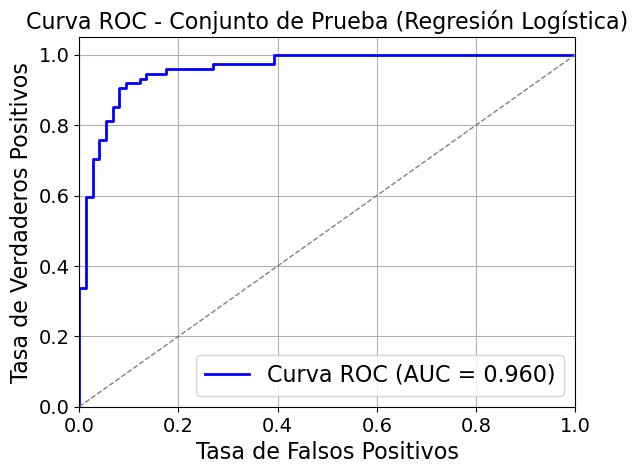

In [ ]:
# Regresion logistica
resultados_lr_fp_BCLXL,figura_rl_fp_BCLXL,modelo_optimizado_rl_fp_BCLXL=evaluar_lr(X_train_fp_BCLXL,y_train_fp_BCLXL,X_test_fp_BCLXL,y_test_fp_BCLXL)
resultados_lr_fp_BCLXL

Mejores parámetros: {'metric': 'manhattan', 'n_neighbors': 7, 'weights': 'distance'}
Mejor precisión en CV (GridSearch): 0.9560835009097003


,Valor
Métrica,
Mejores hiperparámetros,"metric=euclidean, n_neighbors=9, weights=distance"
Exactitud (CV),0.866 (±0.024)
Precisión (CV),0.849 (±0.030)
Sensibilidad (CV),0.892 (±0.025)
F1-score (CV),0.870 (±0.023)
AUC (CV),0.940 (±0.026)
Exactitud (Prueba),0.862
Precisión (Prueba),0.877
Sensibilidad (Prueba),0.845


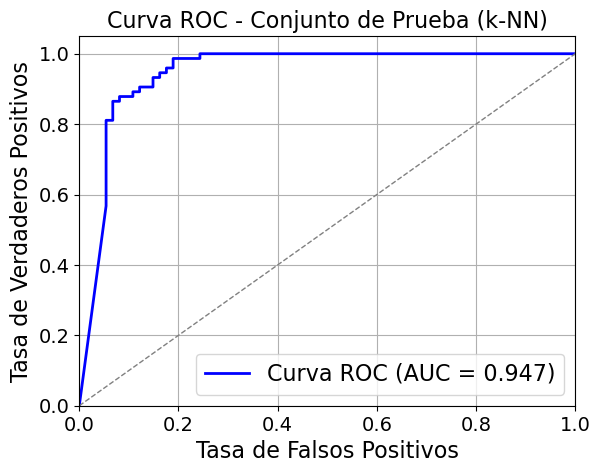

In [ ]:
# Knn
resultados_knn_fp_BCLXL,figura_knn_fp_BCLXL,modelo_optimizado_knn_fp_BCLXL=evaluar_knn(X_train_fp_BCLXL,y_train_fp_BCLXL,X_test_fp_BCLXL,y_test_fp_BCLXL)
resultados_knn

Mejores parámetros: {'alpha': 1}
Mejor precisión en CV (GridSearch): 0.9054438379775928


C:\Users\jorge\anaconda3\envs\tfm_bcl2\Lib\site-packages\sklearn\model_selection\_search.py:1108: UserWarning:

One or more of the test scores are non-finite: [       nan 0.90544384 0.89976587]



,Valor
Métrica,
Mejores hiperparámetros,alpha=1
Exactitud (CV),0.836 (±0.028)
Precisión (CV),0.867 (±0.032)
Sensibilidad (CV),0.797 (±0.071)
F1-score (CV),0.828 (±0.035)
AUC (CV),0.905 (±0.030)
Exactitud (Prueba),0.831
Precisión (Prueba),0.877
Sensibilidad (Prueba),0.770


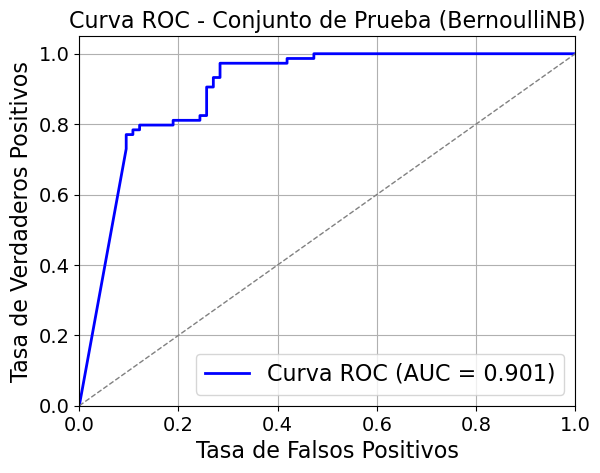

In [ ]:
# Naive Bayes
resultados_naive_bayes_fp_BCLXL,figura_nb_fp_BCLXL,modelo_optimizado_nb_fp_BCLXL=evaluar_bernoulli_nb(X_train_fp_BCLXL,y_train_fp_BCLXL,X_test_fp_BCLXL,y_test_fp_BCLXL)
resultados_naive_bayes_fp_BCLXL

Mejores parámetros: {'learning_rate': 0.1, 'max_depth': 7, 'min_samples_split': 2, 'n_estimators': 50}
Mejor precisión en CV (GridSearch): 0.9484271760988221


,Valor
Métrica,
Mejores hiperparámetros,"learning_rate=0.1, max_depth=7, min_samples_sp..."
Exactitud (CV),0.895 (±0.022)
Precisión (CV),0.890 (±0.039)
Sensibilidad (CV),0.906 (±0.027)
F1-score (CV),0.897 (±0.020)
AUC (CV),0.948 (±0.019)
Exactitud (Prueba),0.919
Precisión (Prueba),0.908
Sensibilidad (Prueba),0.932


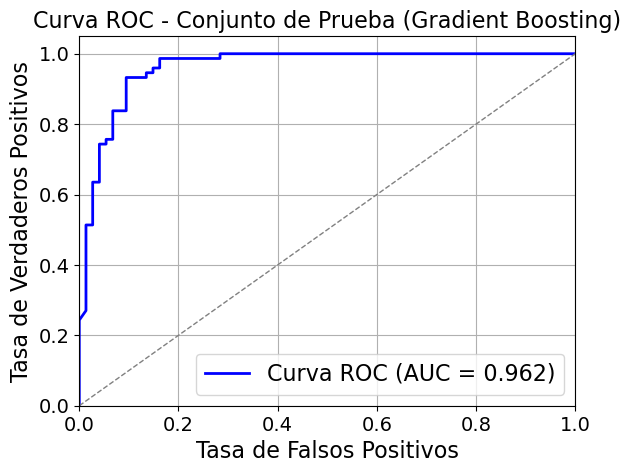

In [ ]:
# Gradient Boosting
resultados_gradient_boosting_fp_BCLXL,figura_gb_fp_BCLXL,modelo_optimizado_gb_fp_BCLXL=evaluar_gradient_boosting(X_train_fp_BCLXL,y_train_fp_BCLXL,X_test_fp_BCLXL,y_test_fp_BCLXL)
resultados_gradient_boosting_fp_BCLXL

Mejores parámetros: {'C': 10.0, 'kernel': 'rbf'}
Mejor precisión en CV (GridSearch): 0.9557215359571005


,Valor
Métrica,
Mejores hiperparámetros,"C=0.1, kernel=linear"
Exactitud (CV),0.868 (±0.014)
Precisión (CV),0.859 (±0.007)
Sensibilidad (CV),0.880 (±0.028)
F1-score (CV),0.869 (±0.015)
AUC (CV),0.930 (±0.016)
Exactitud (Prueba),0.856
Precisión (Prueba),0.875
Sensibilidad (Prueba),0.833


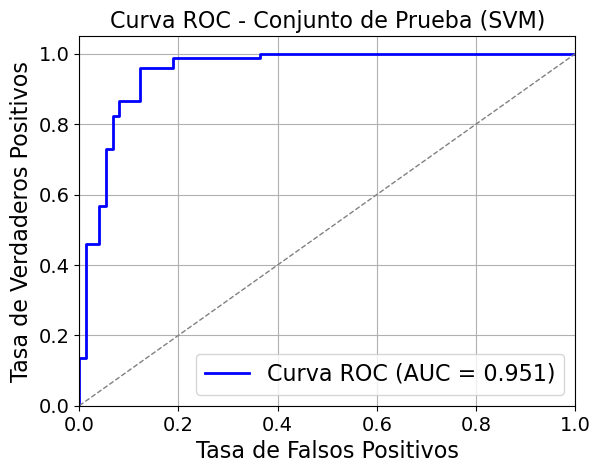

In [ ]:
# SVM
resultados_svm_fp_BCLXL,figura_svm_fp_BCLXL,modelo_optimizado_svm_fp_BCLXL=evaluar_svm(X_train_fp_BCLXL,y_train_fp_BCLXL,X_test_fp_BCLXL,y_test_fp_BCLXL)
resultados_svm

Mejores parámetros: {'max_depth': None, 'max_features': 'log2', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 300}
Mejor precisión en CV (GridSearch): 0.9623527721918987


,Valor
Métrica,
Mejores hiperparámetros,"max_depth=None, max_features=log2, min_samples..."
Exactitud (CV),0.902 (±0.032)
Precisión (CV),0.901 (±0.044)
Sensibilidad (CV),0.905 (±0.023)
F1-score (CV),0.903 (±0.030)
AUC (CV),0.962 (±0.018)
Exactitud (Prueba),0.885
Precisión (Prueba),0.870
Sensibilidad (Prueba),0.905


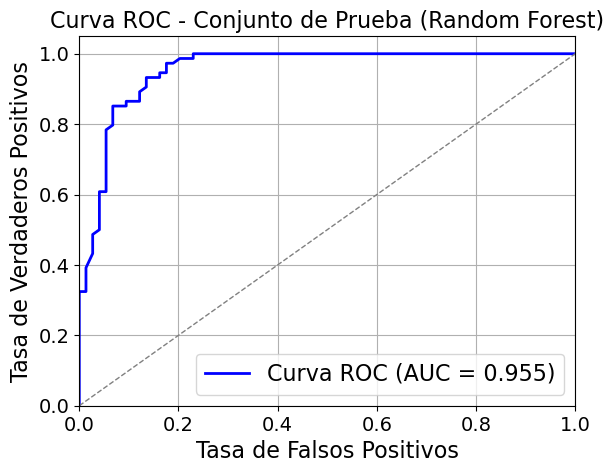

In [ ]:
# Random Forest
resultados_random_forest_fp_BCLXL,figura_rf_fp_BCLXL,modelo_optimizado_rf_fp_BCLXL=evaluar_random_forest(X_train_fp_BCLXL,y_train_fp_BCLXL,X_test_fp_BCLXL,y_test_fp_BCLXL)
resultados_random_forest_fp_BCLXL

Mejores parámetros (MLP): {'activation': 'logistic', 'alpha': 0.01, 'hidden_layer_sizes': (64, 32), 'learning_rate_init': 0.001, 'max_iter': 500, 'solver': 'adam'}
Mejor precisión en CV (MLP): 0.9491305180503687


,Valor
Métrica,
Mejores hiperparámetros,"activation=logistic, alpha=0.01, hidden_layer_..."
Exactitud (CV),0.885 (±0.024)
Precisión (CV),0.869 (±0.032)
Sensibilidad (CV),0.909 (±0.023)
F1-score (CV),0.888 (±0.022)
AUC (CV),0.949 (±0.017)
Exactitud (Prueba),0.905
Precisión (Prueba),0.885
Sensibilidad (Prueba),0.932


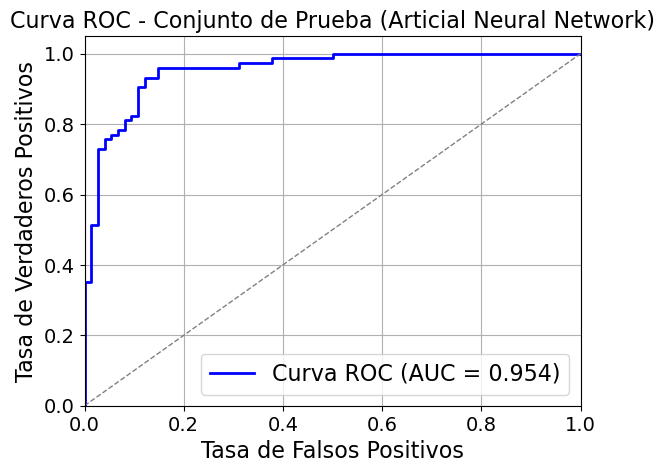

In [ ]:
# Artificial Neural Network
resultados_red_neuronal_fp_BCLXL,figura_rn_fp_BCLXL,modelo_optimizado_rn_fp_BCLXL=evaluar_red_neuronal(X_train_fp_BCLXL,y_train_fp_BCLXL,X_test_fp_BCLXL,y_test_fp_BCLXL)
resultados_red_neuronal_fp_BCLXL

## Resultados finales

In [ ]:
# Tabla con los resultados finales
resultados_finales_fp_BCLXL=pd.concat([resultados_lr_fp_BCLXL,resultados_knn_fp_BCLXL,resultados_naive_bayes_fp_BCLXL,resultados_gradient_boosting_fp_BCLXL,resultados_svm_fp_BCLXL,resultados_random_forest_fp_BCLXL,resultados_red_neuronal_fp_BCLXL],axis=1)
resultados_finales_fp_BCLXL.columns=['Regresión Logística','KNN','Naive Bayes','Gradient Boosting','SVM','Random Forest','Artificial Neural Network']
resultados_finales_fp_BCLXL


,Regresión Logística,KNN,Naive Bayes,Gradient Boosting,SVM,Random Forest,Artificial Neural Network
Métrica,,,,,,,
Mejores hiperparámetros,"C=1, penalty=l2, solver=liblinear","metric=manhattan, n_neighbors=7, weights=distance",alpha=1,"learning_rate=0.1, max_depth=7, min_samples_sp...","C=10.0, kernel=rbf","max_depth=None, max_features=log2, min_samples...","activation=logistic, alpha=0.01, hidden_layer_..."
Exactitud (CV),0.888 (±0.019),0.890 (±0.033),0.836 (±0.028),0.895 (±0.022),0.893 (±0.018),0.902 (±0.032),0.885 (±0.024)
Precisión (CV),0.876 (±0.024),0.882 (±0.053),0.867 (±0.032),0.890 (±0.039),0.888 (±0.031),0.901 (±0.044),0.869 (±0.032)
Sensibilidad (CV),0.905 (±0.025),0.905 (±0.025),0.797 (±0.071),0.906 (±0.027),0.902 (±0.025),0.905 (±0.023),0.909 (±0.023)
F1-score (CV),0.890 (±0.018),0.892 (±0.030),0.828 (±0.035),0.897 (±0.020),0.895 (±0.017),0.903 (±0.030),0.888 (±0.022)
AUC (CV),0.952 (±0.020),0.956 (±0.018),0.905 (±0.030),0.948 (±0.019),0.956 (±0.018),0.962 (±0.018),0.949 (±0.017)
Exactitud (Prueba),0.899,0.885,0.831,0.919,0.892,0.885,0.905
Precisión (Prueba),0.883,0.870,0.877,0.908,0.882,0.870,0.885
Sensibilidad (Prueba),0.919,0.905,0.770,0.932,0.905,0.905,0.932


# Creación de las tablas con los resultados

## Regresion logistica

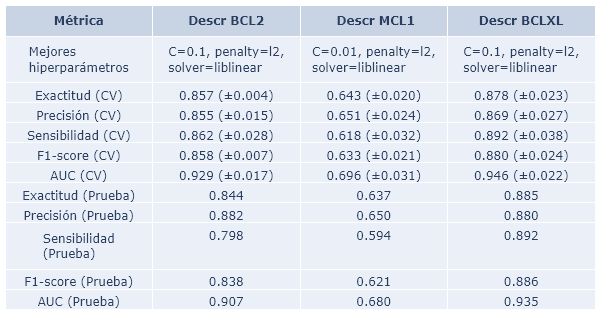

In [ ]:
import df2img

# Tabla con todos los resultados para regresión logística para descriptores
resultados_lr_tabla = pd.concat([resultados_lr, resultados_lr_MCL1, resultados_lr_BCLXL], axis=1)
resultados_lr_tabla.columns = ['Descr BCL2', ' Descr MCL1', 'Descr BCLXL']

# Crear imagen con df2img
fig = df2img.plot_dataframe(
    resultados_lr_tabla,
    fig_size=(600,320),
)

# Guardar imagen
df2img.save_dataframe(fig, filename='C:/Users/jorge/Desktop/proyecto_TFM/results/resultados_lr_tabla.png')


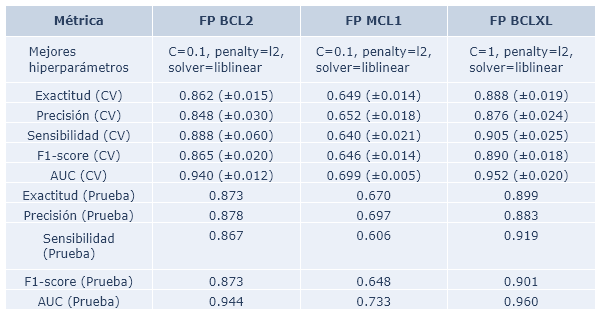

In [ ]:
# Tabla que junte los resultados de fingerprints para rl
resultados_lr_fp_tabla = pd.concat([resultados_lr_fp_BCL2, resultados_lr_fp_MCL1, resultados_lr_fp_BCLXL], axis=1)
resultados_lr_fp_tabla.columns = ['FP BCL2', 'FP MCL1', 'FP BCLXL']
resultados_lr_fp_tabla

# Crear imagen con df2img
fig = df2img.plot_dataframe(
    resultados_lr_fp_tabla,
    fig_size=(600,320),
)

# Guardar imagen
df2img.save_dataframe(fig, filename='C:/Users/jorge/Desktop/proyecto_TFM/results/resultados_lr_fp_tabla.png')

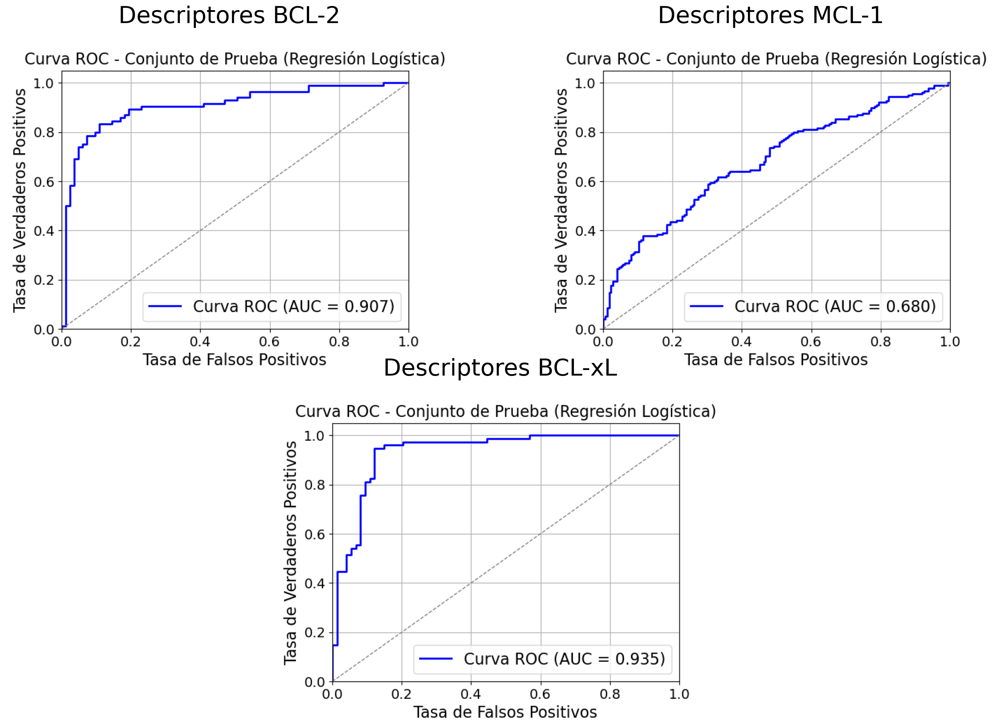

In [ ]:
# Representación de las curvas ROC para los descriptrores

# Vamos a crear una función para juntar las 3 curvas ROC pertenenecientes a cada diana
def visualizar_tres_roc(figura_1, figura_2, figura_3):

    # Función interna para convertir una figura de Matplotlib a una imagen
    def figure_to_image(fig):
        fig.canvas.draw()
        img = np.frombuffer(fig.canvas.buffer_rgba(), dtype=np.uint8)
        img = img.reshape(fig.canvas.get_width_height()[::-1] + (4,))
        img = img[:, :, :3]
        return img

    # Convertir las figuras a imágenes
    img_1 = figure_to_image(figura_1)
    img_2 = figure_to_image(figura_2)
    img_3 = figure_to_image(figura_3)

    # Crear una figura con GridSpec para un diseño personalizado
    fig = plt.figure(figsize=(25, 16), dpi=150)
    gs = fig.add_gridspec(2, 2, height_ratios=[1, 1], hspace=0.05, wspace=0.001)

    # Crear subgráficos
    ax1 = fig.add_subplot(gs[0, 0])
    ax2 = fig.add_subplot(gs[0, 1])
    ax3 = fig.add_subplot(gs[1, :])

    # Mostrar las imagenes
    ax1.imshow(img_1)
    ax1.axis('off')
    ax1.set_title('Descriptores BCL-2', fontsize=30, pad=10)

    ax2.imshow(img_2)
    ax2.axis('off')
    ax2.set_title('Descriptores MCL-1', fontsize=30, pad=10)

    ax3.imshow(img_3)
    ax3.axis('off')
    ax3.set_title('Descriptores BCL-xL', fontsize=30, pad=10)

    # Ajustar espacio entre subgráficos
    plt.subplots_adjust(wspace=0.05, hspace=0.05)
    plt.show()

visualizar_tres_roc(figura_lr, figura_rl_mcl1, figura_rl_BCLXL)

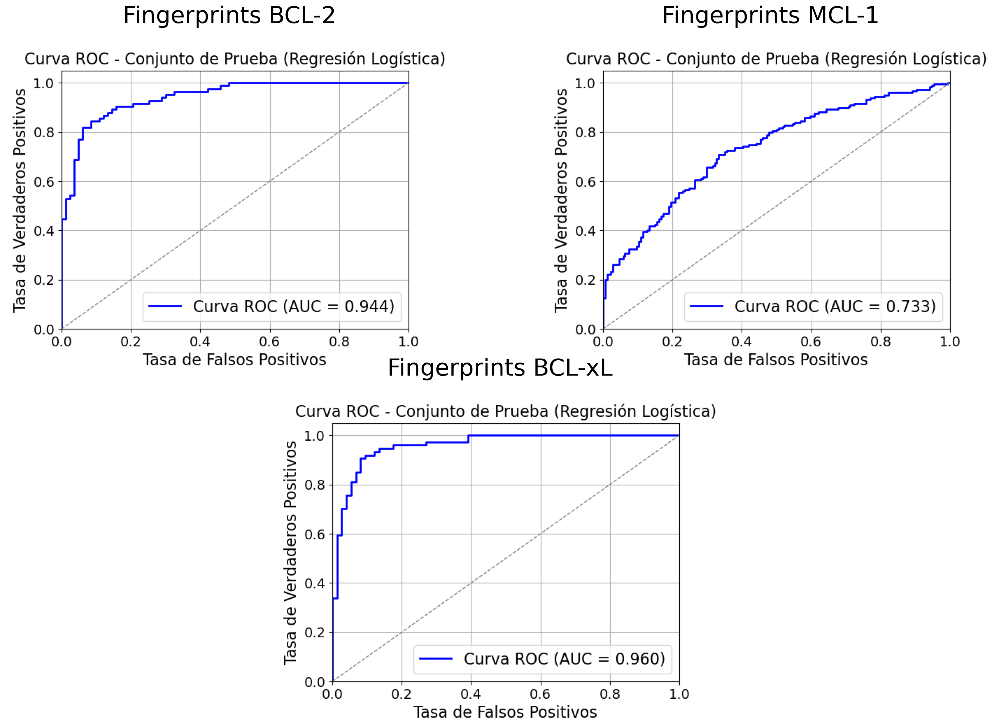

In [ ]:
# Vamos a crear una función para los fingerprints para poner los titulos correctos
def visualizar_tres_roc_fp(figura_1, figura_2, figura_3):

    # Función interna para convertir una figura de Matplotlib a una imagen
    def figure_to_image(fig):
        fig.canvas.draw()
        img = np.frombuffer(fig.canvas.buffer_rgba(), dtype=np.uint8)
        img = img.reshape(fig.canvas.get_width_height()[::-1] + (4,))
        img = img[:, :, :3]
        return img

    # Convertir las figuras a imágenes
    img_1 = figure_to_image(figura_1)
    img_2 = figure_to_image(figura_2)
    img_3 = figure_to_image(figura_3)

    # Crear una figura con GridSpec para un diseño personalizado
    fig = plt.figure(figsize=(25, 16), dpi=150)
    gs = fig.add_gridspec(2, 2, height_ratios=[1, 1], hspace=0.05, wspace=0.001)

    # Crear subgráficos
    ax1 = fig.add_subplot(gs[0, 0])
    ax2 = fig.add_subplot(gs[0, 1])
    ax3 = fig.add_subplot(gs[1, :])

    # Mostrar las imagenes
    ax1.imshow(img_1)
    ax1.axis('off')
    ax1.set_title('Fingerprints BCL-2', fontsize=30, pad=10)

    ax2.imshow(img_2)
    ax2.axis('off')
    ax2.set_title('Fingerprints MCL-1', fontsize=30, pad=10)

    ax3.imshow(img_3)
    ax3.axis('off')
    ax3.set_title('Fingerprints BCL-xL', fontsize=30, pad=10)

    # Ajustar espacio entre subgráficos
    plt.subplots_adjust(wspace=0.05, hspace=0.05)

    # Mostrar figura
    plt.show()

visualizar_tres_roc_fp(figura_rl_fp_BCL2, figura_rl_fp_MCL1, figura_rl_fp_BCLXL)

## KNN

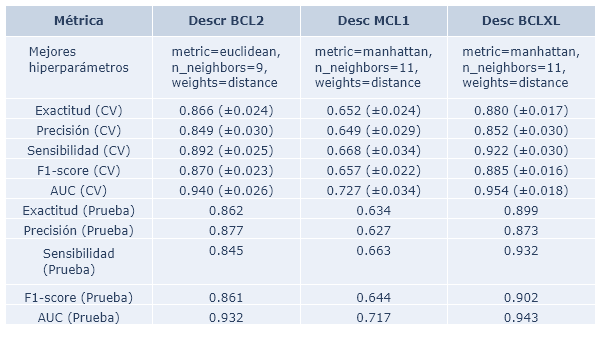

In [ ]:
# Tabla que junte resultados para descriptores knn
resultados_knn_tabla = pd.concat([resultados_knn, resultados_knn_MCL1, resultados_knn_BCLXL], axis=1)
resultados_knn_tabla.columns = ['Descr BCL2', 'Desc MCL1', 'Desc BCLXL']

# Crear imagen con df2img
fig = df2img.plot_dataframe(
    resultados_knn_tabla,
    fig_size=(600,350),
)

# Guardar imagen
df2img.save_dataframe(fig, filename='resultados_knn_tabla.png')


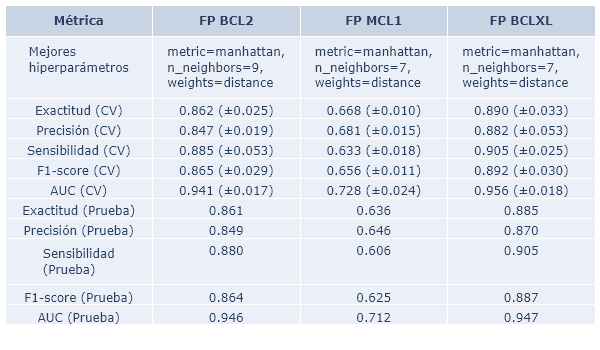

In [ ]:
# Lo mismo para los fingerprints
resultados_knn_fp_tabla = pd.concat([resultados_knn_fp_BCL2, resultados_knn_fp_MCL1, resultados_knn_fp_BCLXL], axis=1)
resultados_knn_fp_tabla.columns = ['FP BCL2', 'FP MCL1', 'FP BCLXL']

# Crear imagen con df2img
fig = df2img.plot_dataframe(
    resultados_knn_fp_tabla,
    fig_size=(600,350),
)

# Guardar imagen
df2img.save_dataframe(fig, filename='resultados_knn_fp_tabla.png')

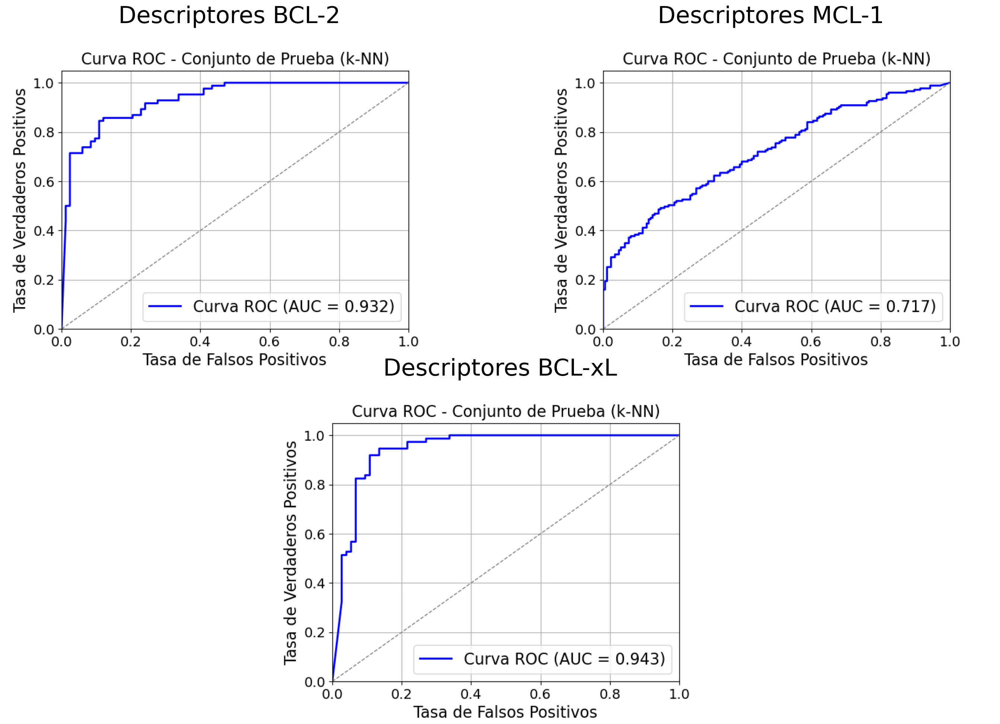

In [ ]:
# Gráficas ROC para descriptores
visualizar_tres_roc(figura_knn, figura_knn_mcl1, figura_knn_BCLXL)

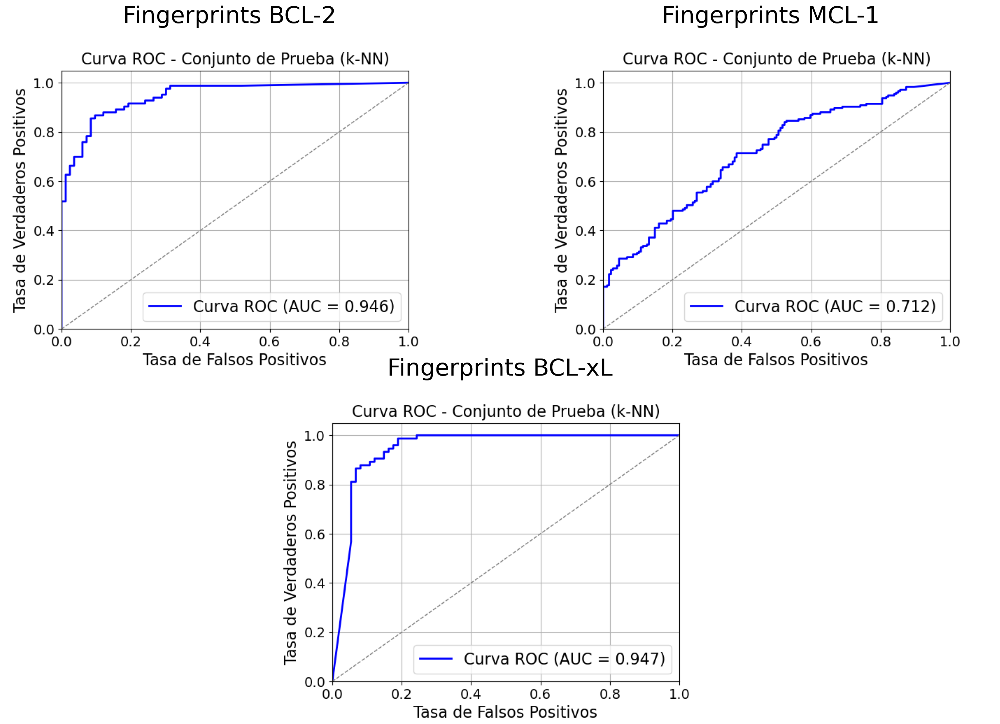

In [ ]:
# Grafico ROC para fingerprints
visualizar_tres_roc_fp(figura_knn_fp_BCL2, figura_knn_fp_MCL1, figura_knn_fp_BCLXL)

## Naive Bayes

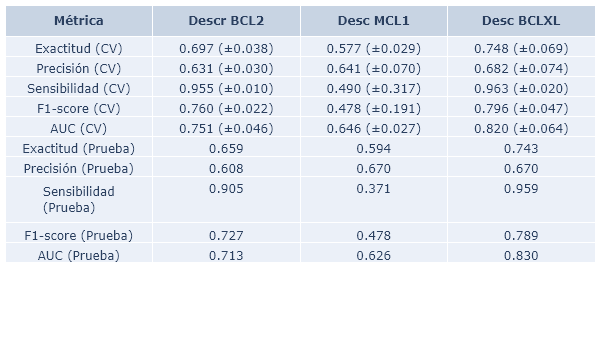

In [ ]:
# Creamos la tabla para descriptores
resultados_nb_tabla = pd.concat([resultados_naive_bayes, resultados_naive_bayes_MCL1, resultados_naive_bayes_BCLXL], axis=1)
resultados_nb_tabla.columns = ['Descr BCL2', 'Desc MCL1', 'Desc BCLXL']

# Crear imagen con df2img
fig = df2img.plot_dataframe(
    resultados_nb_tabla,
    fig_size=(600,350),
)

# Guardar imagen
df2img.save_dataframe(fig, filename='resultados_nb_tabla.png')

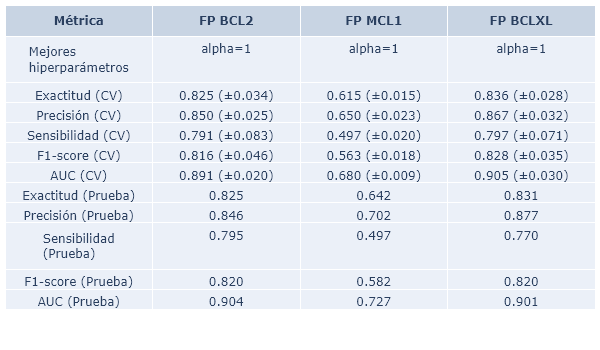

In [ ]:
# Tabla para los fingerprints
resultados_nb_fp_tabla = pd.concat([resultados_naive_bayes_fp_BCL2, resultados_naive_bayes_fp_MCL1, resultados_naive_bayes_fp_BCLXL], axis=1)
resultados_nb_fp_tabla.columns = ['FP BCL2', 'FP MCL1', 'FP BCLXL']

# Crear imagen con df2img
fig = df2img.plot_dataframe(
    resultados_nb_fp_tabla,
    fig_size=(600,350),
)

# Guardar imagen
df2img.save_dataframe(fig, filename='resultados_nb_fp_tabla.png')

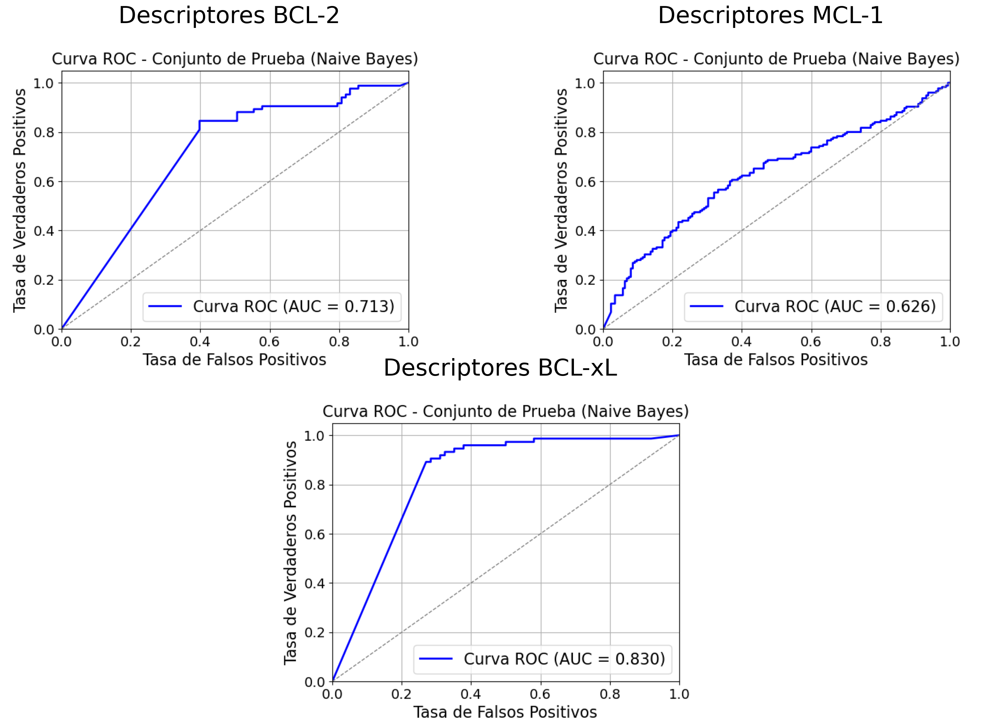

In [ ]:
# Curvas ROC para los descriptores
visualizar_tres_roc(figura_nb, figura_nb_mcl1, figura_nb_BCLXL)

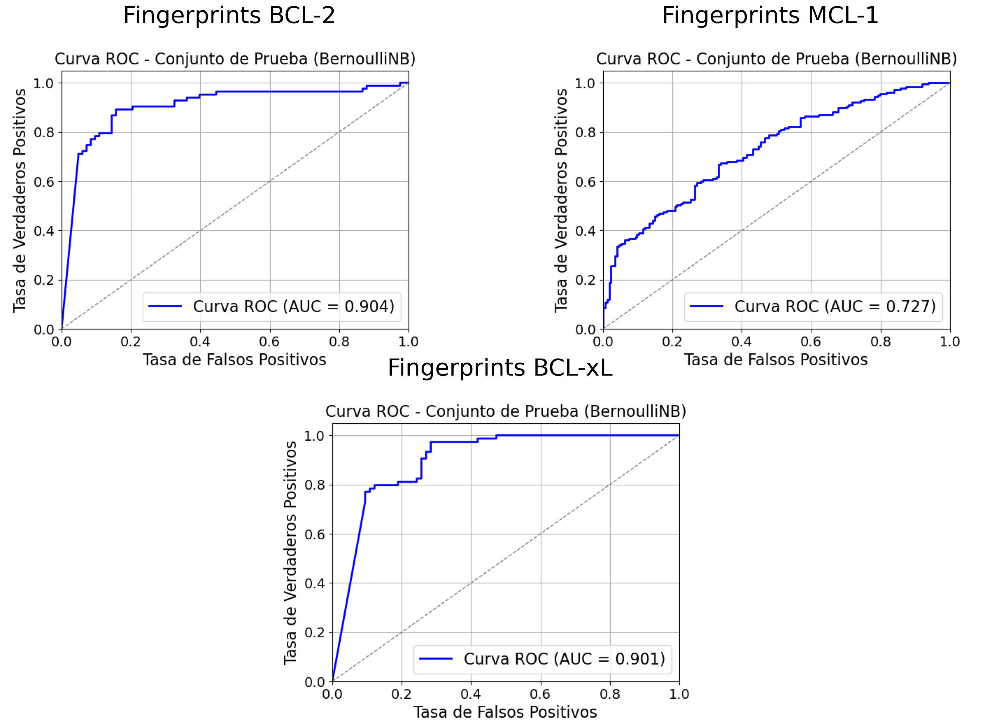

In [ ]:
# Curvas ROC para los fingerprints
visualizar_tres_roc_fp(figura_nb_fp_BCL2, figura_nb_fp_MCL1, figura_nb_fp_BCLXL)

## Gradient Boosting


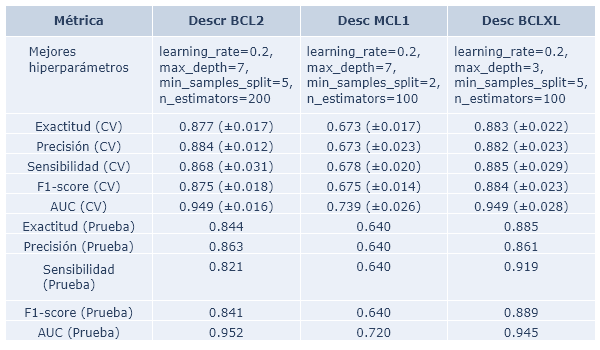

In [ ]:
# Tabla de resultados para descriptores
resultados_gb_tabla = pd.concat([resultados_gradient_boosting, resultados_gradient_boosting_MCL1, resultados_gradient_boosting_BCLXL], axis=1)
resultados_gb_tabla.columns = ['Descr BCL2', 'Desc MCL1', 'Desc BCLXL']

# Crear imagen con df2img
fig = df2img.plot_dataframe(
    resultados_gb_tabla,
    fig_size=(600,350),
)

# Guardar imagen
df2img.save_dataframe(fig, filename='resultados_gb_tabla.png')

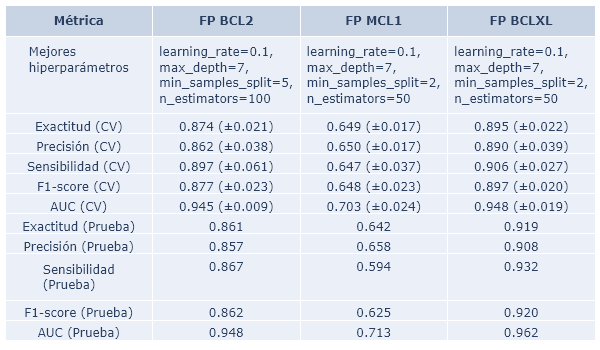

In [ ]:
# Tabla para fingerprints
resultados_gb_fp_tabla = pd.concat([resultados_gradient_boosting_fp_BCL2, resultados_gradient_boosting_fp_MCL1, resultados_gradient_boosting_fp_BCLXL], axis=1)
resultados_gb_fp_tabla.columns = ['FP BCL2', 'FP MCL1', 'FP BCLXL']

# Crear imagen con df2img
fig = df2img.plot_dataframe(
    resultados_gb_fp_tabla,
    fig_size=(600,350),
)
# Guardar imagen
df2img.save_dataframe(fig, filename='resultados_gb_fp_tabla.png')


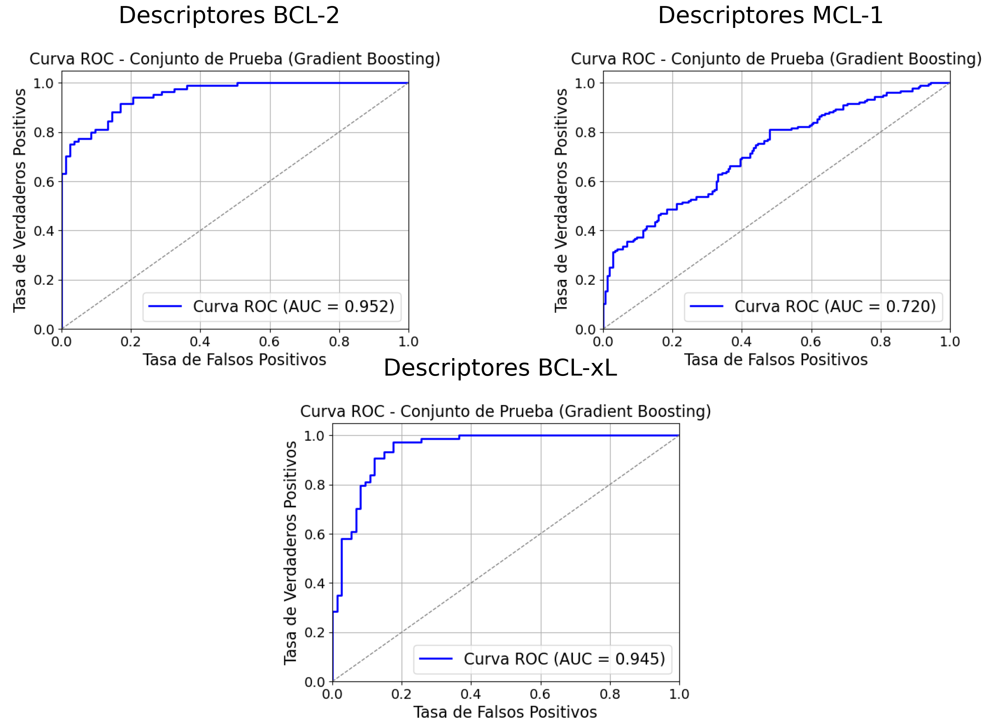

In [ ]:
# Curvas ROC para descriptores
visualizar_tres_roc(figura_gb, figura_gb_mcl1, figura_gb_BCLXL)

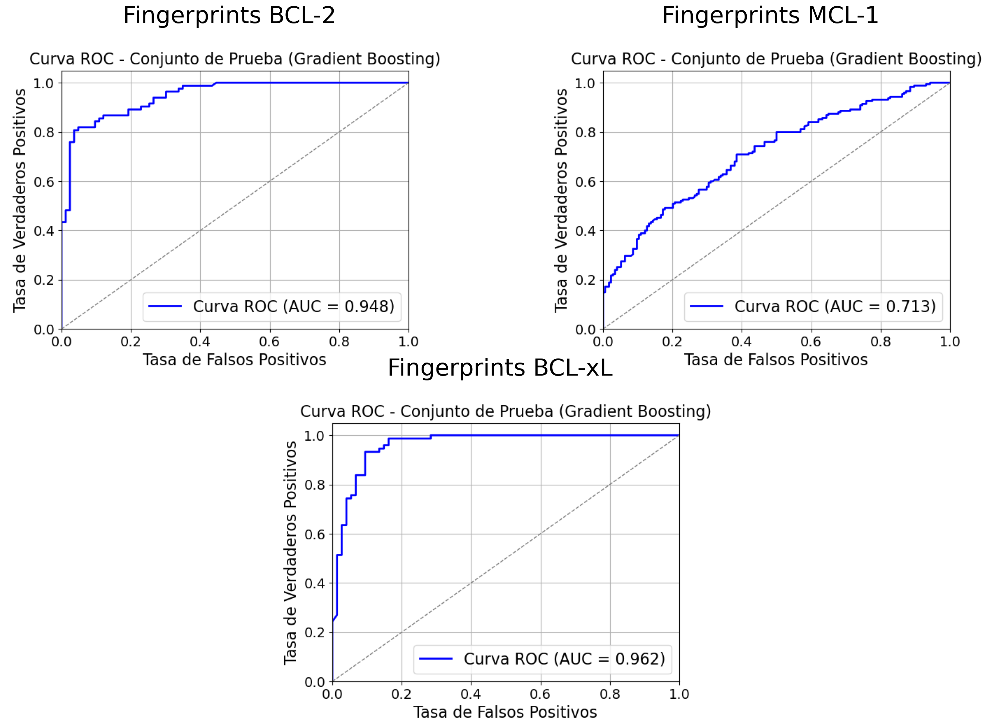

In [ ]:
# Curvas ROC para fingerprints
visualizar_tres_roc_fp(figura_gb_fp_BCL2, figura_gb_fp_MCL1, figura_gb_fp_BCLXL)

## SVM


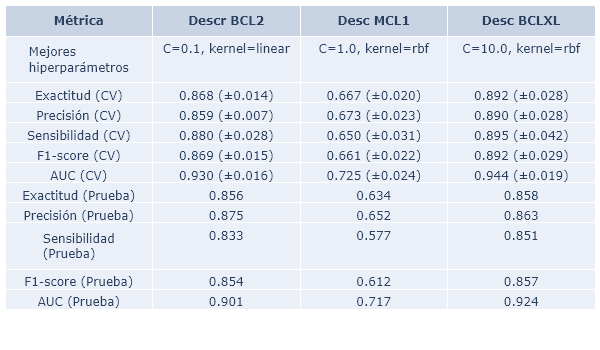

In [ ]:
# Tabla de resultados descriptores
resultados_svm_tabla = pd.concat([resultados_svm, resultados_svm_MCL1, resultados_svm_BCLXL], axis=1)
resultados_svm_tabla.columns = ['Descr BCL2', 'Desc MCL1', 'Desc BCLXL']

# Crear imagen
fig = df2img.plot_dataframe(
    resultados_svm_tabla,
    fig_size=(600,350),
)

# Guardar imagen
df2img.save_dataframe(fig, filename='resultados_svm_tabla.png')

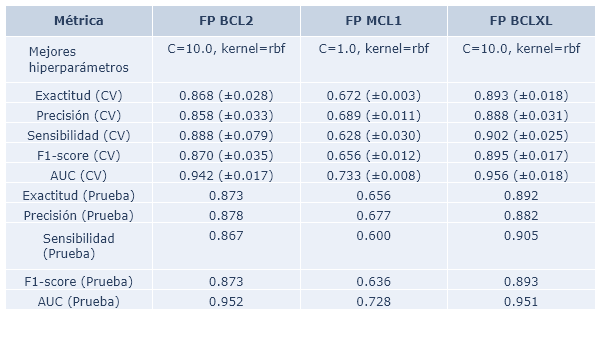

In [ ]:
# Tabla de resultado fingerprints
resultados_svm_fp_tabla = pd.concat([resultados_svm_fp_BCL2, resultados_svm_fp_MCL1, resultados_svm_fp_BCLXL], axis=1)
resultados_svm_fp_tabla.columns = ['FP BCL2', 'FP MCL1', 'FP BCLXL']

# Crear imagen
fig = df2img.plot_dataframe(
    resultados_svm_fp_tabla,
    fig_size=(600,350),
)

# Guardar imagen
df2img.save_dataframe(fig, filename='resultados_svm_fp_tabla.png')

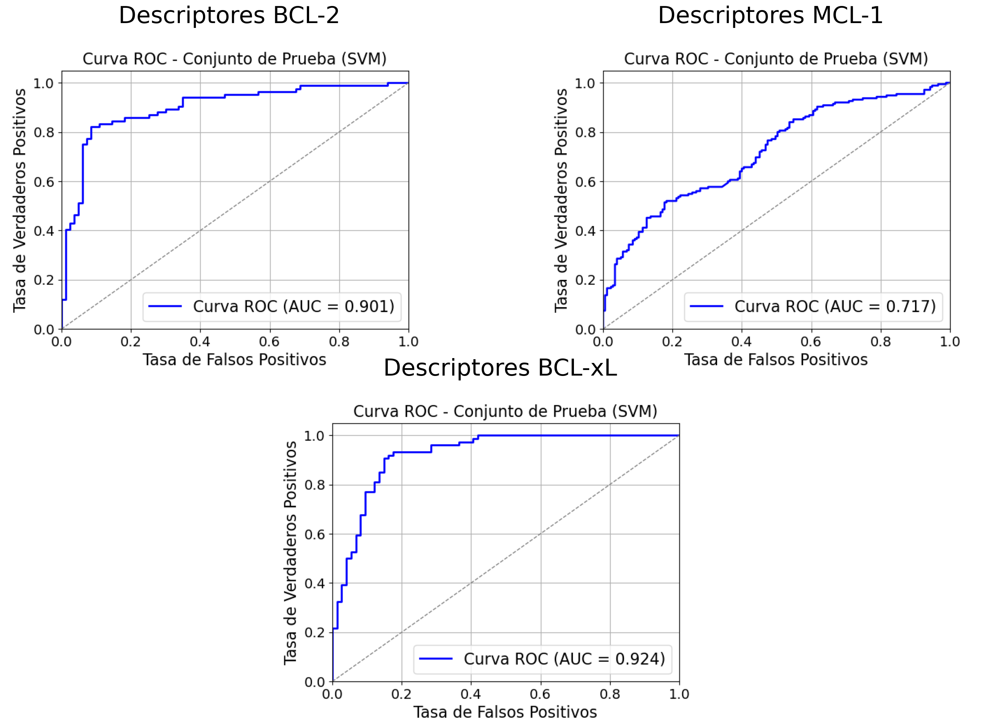

In [ ]:
# Curvas ROC para los descriptores
visualizar_tres_roc(figura_svm, figura_svm_mcl1, figura_svm_BCLXL)


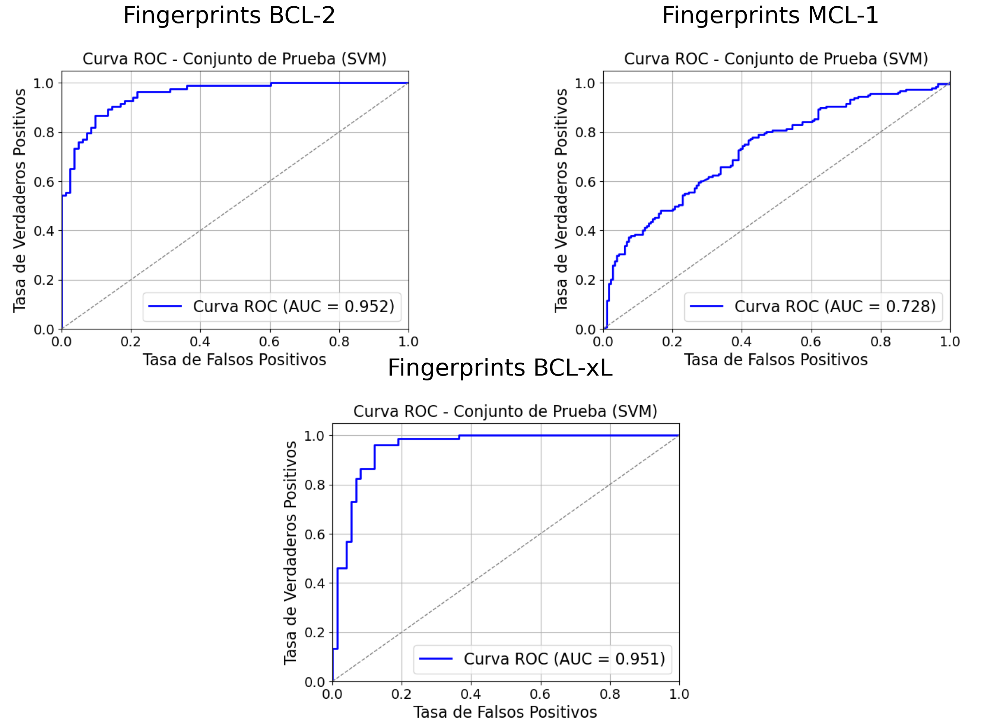

In [ ]:
# Curvas ROC para los fingerprints
visualizar_tres_roc_fp(figura_svm_fp_BCL2, figura_svm_fp_MCL1, figura_svm_fp_BCLXL)

## Random Forest

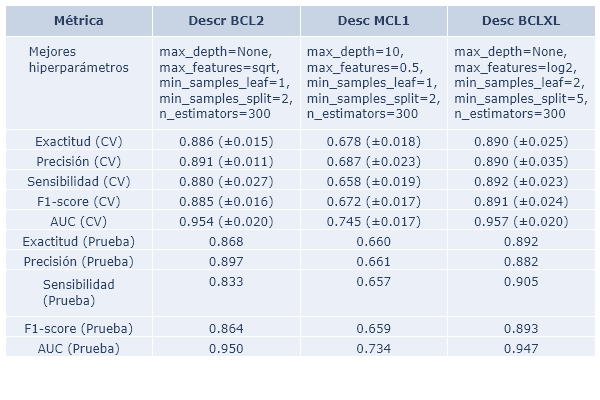

In [ ]:
# Random Forest
resultados_rf_tabla = pd.concat([resultados_random_forest, resultados_random_forest_MCL1, resultados_random_forest_BCLXL], axis=1)
resultados_rf_tabla.columns = ['Descr BCL2', 'Desc MCL1', 'Desc BCLXL']

# Crear imagen
fig = df2img.plot_dataframe(
    resultados_rf_tabla,
    fig_size=(600,400),
)

# Guardar imagen
df2img.save_dataframe(fig, filename='resultados_rf_tabla.png')

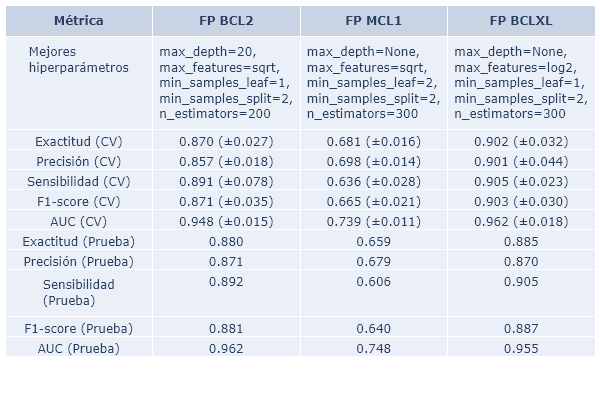

In [ ]:
# Tabla de resultados para fp
resultados_rf_fp_tabla = pd.concat([resultados_random_forest_fp_BCL2, resultados_random_forest_fp_MCL1, resultados_random_forest_fp_BCLXL], axis=1)
resultados_rf_fp_tabla.columns = ['FP BCL2', 'FP MCL1', 'FP BCLXL']

# Crear imagen
fig = df2img.plot_dataframe(
    resultados_rf_fp_tabla,
    fig_size=(600,400),
)

# Guardar imagen
df2img.save_dataframe(fig, filename='resultados_rf_fp_tabla.png')

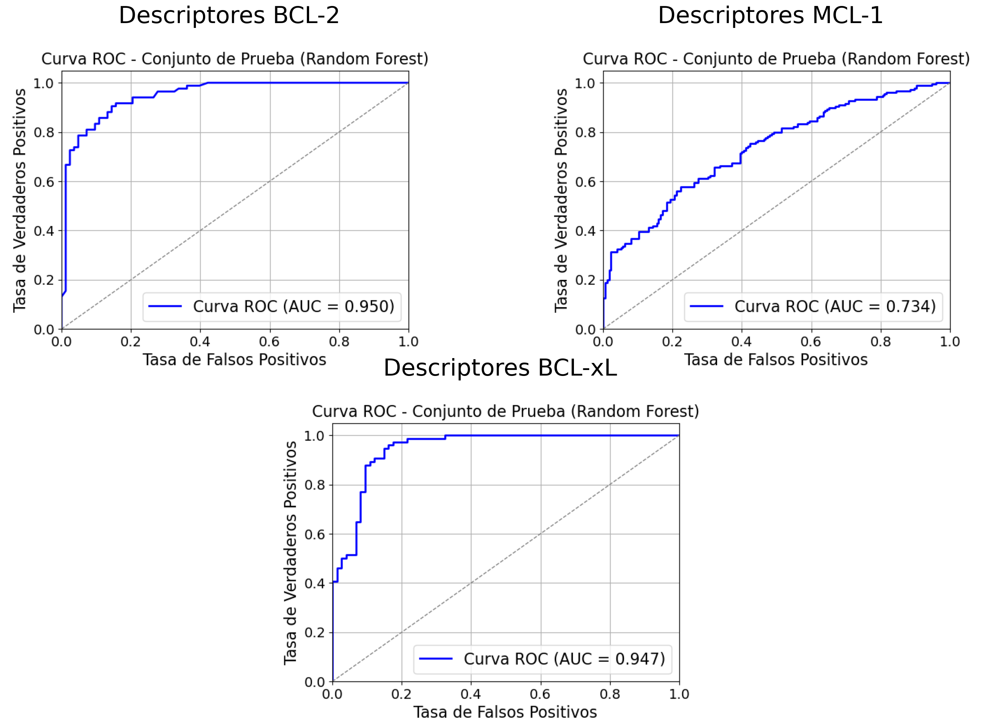

In [ ]:
# Representar curvas ROC para descriptores
visualizar_tres_roc(figura_rf, figura_rf_mcl1, figura_rf_BCLXL)

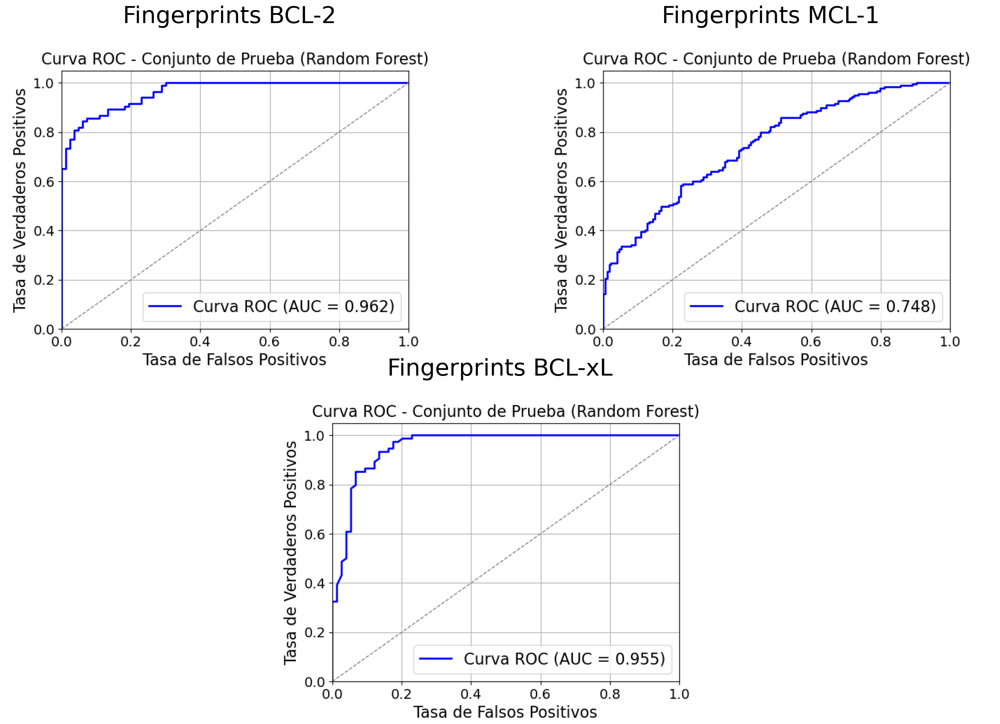

In [ ]:
# Visualizar curvas ROC para fingerprints
visualizar_tres_roc_fp(figura_rf_fp_BCL2, figura_rf_fp_MCL1, figura_rf_fp_BCLXL)

## Redes neuronales

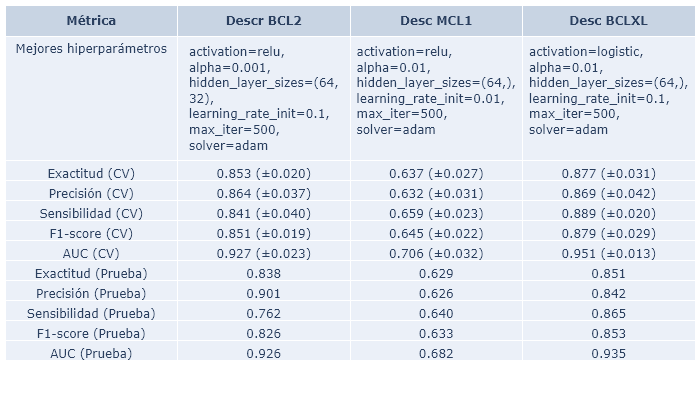

In [ ]:
# Tabla de resultados descriptores
resultados_rn_tabla = pd.concat([resultados_red_neuronal, resultados_red_neuronal_MCL1, resultados_red_neuronal_BCLXL], axis=1)
resultados_rn_tabla.columns = ['Descr BCL2', 'Desc MCL1', 'Desc BCLXL']

# Crear imagen
fig = df2img.plot_dataframe(
    resultados_rn_tabla,
    fig_size=(700,400),
)

# Guardar imagen
df2img.save_dataframe(fig, filename='resultados_rn_tabla.png')

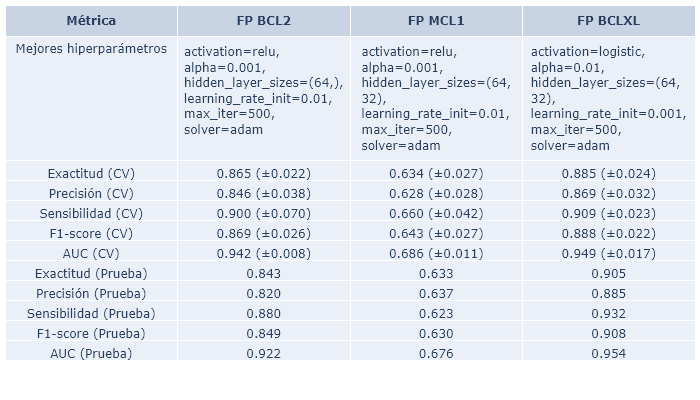

In [ ]:
# Tabla de resultados para fingerprints
resultados_rn_fp_tabla = pd.concat([resultados_red_neuronal_fp_BCL2, resultados_red_neuronal_fp_MCL1, resultados_red_neuronal_fp_BCLXL], axis=1)
resultados_rn_fp_tabla.columns = ['FP BCL2', 'FP MCL1', 'FP BCLXL']

# Crear imagen
fig = df2img.plot_dataframe(
    resultados_rn_fp_tabla,
    fig_size=(700,400),
)
# Guardar imagen
df2img.save_dataframe(fig, filename='resultados_rn_fp_tabla.png')

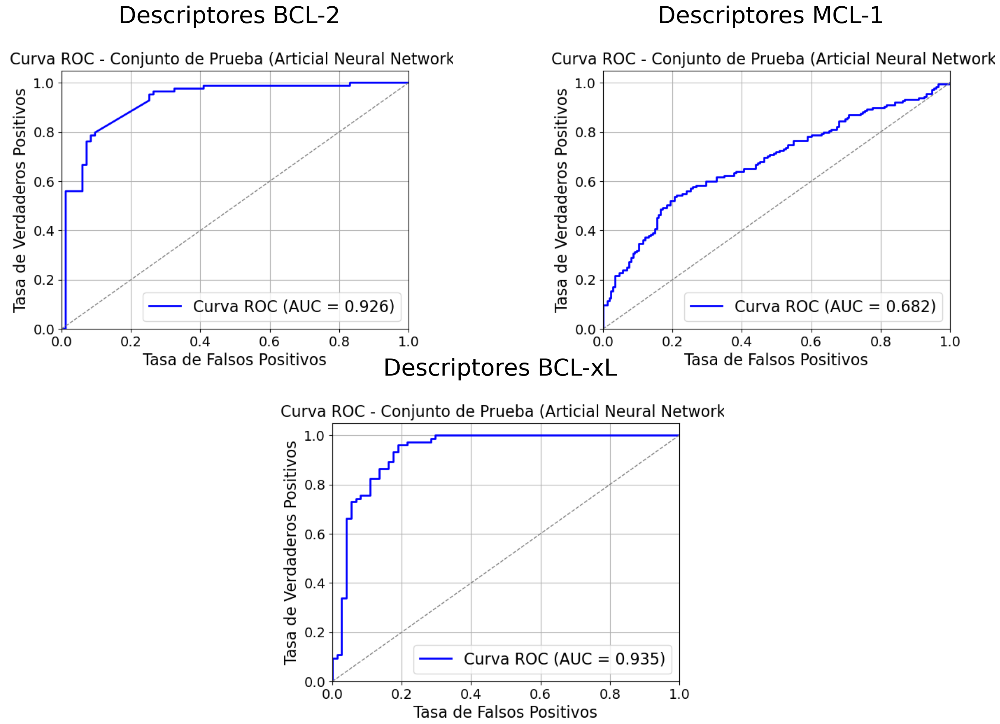

In [ ]:
# Curvas ROC para redes neuronales
visualizar_tres_roc(figura_rn, figura_rn_mcl1, figura_rn_BCLXL)

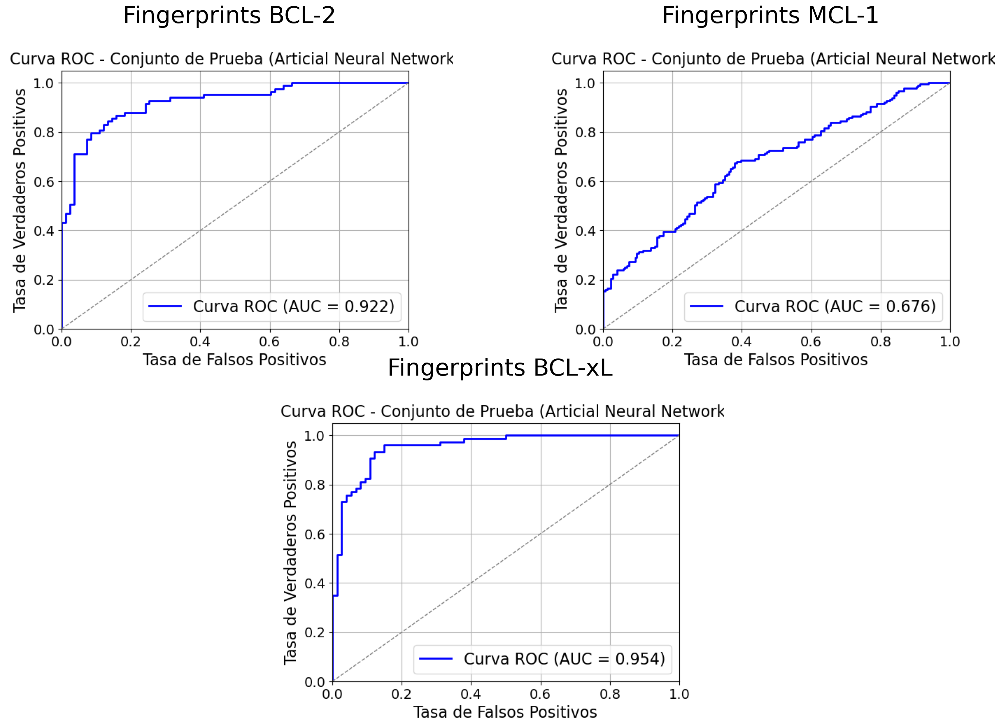

In [ ]:
# Curvas ROC para redes neuronales
visualizar_tres_roc_fp(figura_rn_fp_BCL2, figura_rn_fp_MCL1, figura_rn_fp_BCLXL)

## Resultados finales por diana


### BCL-2

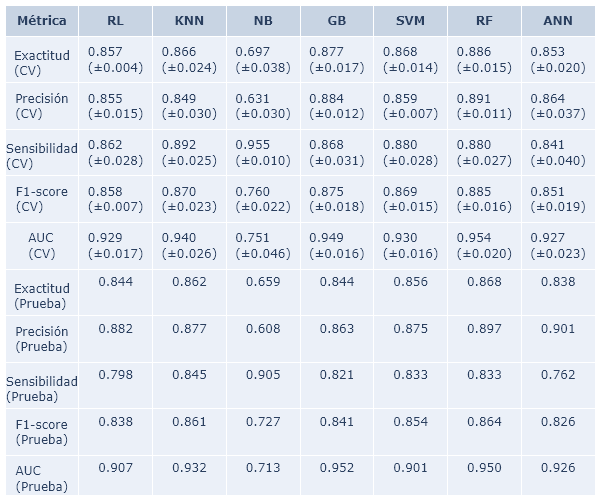

,RL,KNN,NB,GB,SVM,RF,ANN
Métrica,,,,,,,
Exactitud (CV),0.857 (±0.004),0.866 (±0.024),0.697 (±0.038),0.877 (±0.017),0.868 (±0.014),0.886 (±0.015),0.853 (±0.020)
Precisión (CV),0.855 (±0.015),0.849 (±0.030),0.631 (±0.030),0.884 (±0.012),0.859 (±0.007),0.891 (±0.011),0.864 (±0.037)
Sensibilidad (CV),0.862 (±0.028),0.892 (±0.025),0.955 (±0.010),0.868 (±0.031),0.880 (±0.028),0.880 (±0.027),0.841 (±0.040)
F1-score (CV),0.858 (±0.007),0.870 (±0.023),0.760 (±0.022),0.875 (±0.018),0.869 (±0.015),0.885 (±0.016),0.851 (±0.019)
AUC (CV),0.929 (±0.017),0.940 (±0.026),0.751 (±0.046),0.949 (±0.016),0.930 (±0.016),0.954 (±0.020),0.927 (±0.023)
Exactitud (Prueba),0.844,0.862,0.659,0.844,0.856,0.868,0.838
Precisión (Prueba),0.882,0.877,0.608,0.863,0.875,0.897,0.901
Sensibilidad (Prueba),0.798,0.845,0.905,0.821,0.833,0.833,0.762
F1-score (Prueba),0.838,0.861,0.727,0.841,0.854,0.864,0.826


In [ ]:
# Tabla con los resultados finales para BCL-2 sin hiperparametros y nombres acortados
resultados_finales_BCL2_acortados=resultados_finales_BCL2.iloc[1:,:]
resultados_finales_BCL2_acortados.columns=['RL','KNN','NB','GB','SVM','RF','ANN']

# Crear imagen
fig = df2img.plot_dataframe(
    resultados_finales_BCL2_acortados,
    fig_size=(600,500),
)

# Guardar imagen
df2img.save_dataframe(fig, filename='resultados_finales_BCL2.png')
resultados_finales_BCL2_acortados

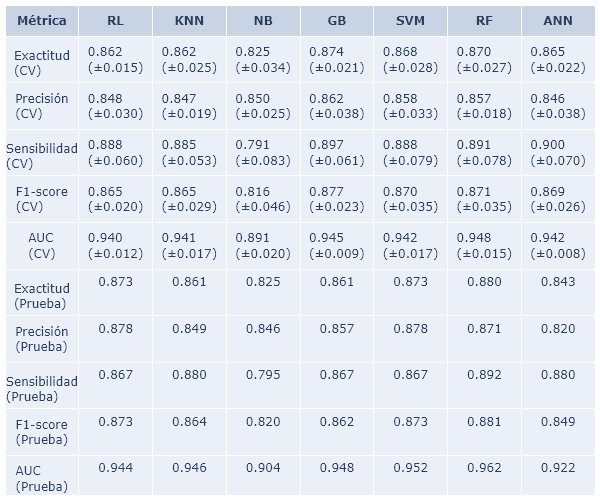

,RL,KNN,NB,GB,SVM,RF,ANN
Métrica,,,,,,,
Exactitud (CV),0.862 (±0.015),0.862 (±0.025),0.825 (±0.034),0.874 (±0.021),0.868 (±0.028),0.870 (±0.027),0.865 (±0.022)
Precisión (CV),0.848 (±0.030),0.847 (±0.019),0.850 (±0.025),0.862 (±0.038),0.858 (±0.033),0.857 (±0.018),0.846 (±0.038)
Sensibilidad (CV),0.888 (±0.060),0.885 (±0.053),0.791 (±0.083),0.897 (±0.061),0.888 (±0.079),0.891 (±0.078),0.900 (±0.070)
F1-score (CV),0.865 (±0.020),0.865 (±0.029),0.816 (±0.046),0.877 (±0.023),0.870 (±0.035),0.871 (±0.035),0.869 (±0.026)
AUC (CV),0.940 (±0.012),0.941 (±0.017),0.891 (±0.020),0.945 (±0.009),0.942 (±0.017),0.948 (±0.015),0.942 (±0.008)
Exactitud (Prueba),0.873,0.861,0.825,0.861,0.873,0.880,0.843
Precisión (Prueba),0.878,0.849,0.846,0.857,0.878,0.871,0.820
Sensibilidad (Prueba),0.867,0.880,0.795,0.867,0.867,0.892,0.880
F1-score (Prueba),0.873,0.864,0.820,0.862,0.873,0.881,0.849


In [ ]:
# Tabla con los resultados finales para BCL-2 fp sin hiperparemtros y nombres acortados
resultados_finales_fp_BCL2_acortados=resultados_finales_fp_BCL2.iloc[1:,:]
resultados_finales_fp_BCL2_acortados.columns=['RL','KNN','NB','GB','SVM','RF','ANN']


# Crear imagen
fig = df2img.plot_dataframe(
    resultados_finales_fp_BCL2_acortados,
    fig_size=(600,500),
)
# Guardar imagen
df2img.save_dataframe(fig, filename='resultados_finales_fp_BCL2.png')

resultados_finales_fp_BCL2_acortados

### MCL-1

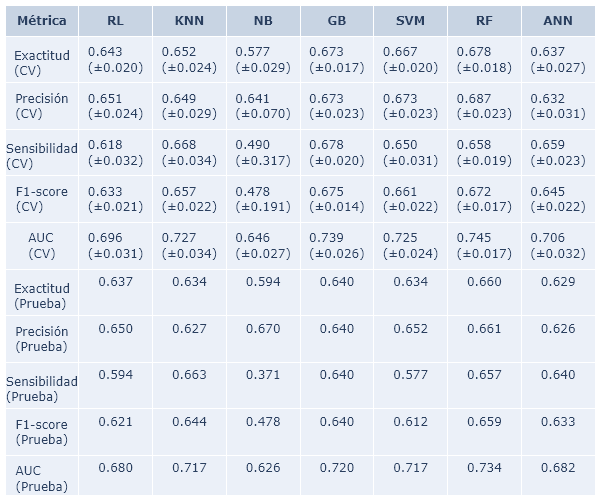

,RL,KNN,NB,GB,SVM,RF,ANN
Métrica,,,,,,,
Exactitud (CV),0.643 (±0.020),0.652 (±0.024),0.577 (±0.029),0.673 (±0.017),0.667 (±0.020),0.678 (±0.018),0.637 (±0.027)
Precisión (CV),0.651 (±0.024),0.649 (±0.029),0.641 (±0.070),0.673 (±0.023),0.673 (±0.023),0.687 (±0.023),0.632 (±0.031)
Sensibilidad (CV),0.618 (±0.032),0.668 (±0.034),0.490 (±0.317),0.678 (±0.020),0.650 (±0.031),0.658 (±0.019),0.659 (±0.023)
F1-score (CV),0.633 (±0.021),0.657 (±0.022),0.478 (±0.191),0.675 (±0.014),0.661 (±0.022),0.672 (±0.017),0.645 (±0.022)
AUC (CV),0.696 (±0.031),0.727 (±0.034),0.646 (±0.027),0.739 (±0.026),0.725 (±0.024),0.745 (±0.017),0.706 (±0.032)
Exactitud (Prueba),0.637,0.634,0.594,0.640,0.634,0.660,0.629
Precisión (Prueba),0.650,0.627,0.670,0.640,0.652,0.661,0.626
Sensibilidad (Prueba),0.594,0.663,0.371,0.640,0.577,0.657,0.640
F1-score (Prueba),0.621,0.644,0.478,0.640,0.612,0.659,0.633


In [ ]:
# Tabla con los resultados finales para MCL-1
resultados_finales_MCL1_acortados=resultados_finales_MCL1.iloc[1:,:]
resultados_finales_MCL1_acortados.columns=['RL','KNN','NB','GB','SVM','RF','ANN']

# Crear imagen
fig = df2img.plot_dataframe(
    resultados_finales_MCL1_acortados,
    fig_size=(600,500),
)

# Guardar imagen
df2img.save_dataframe(fig, filename='resultados_finales_MCL1.png')
resultados_finales_MCL1_acortados

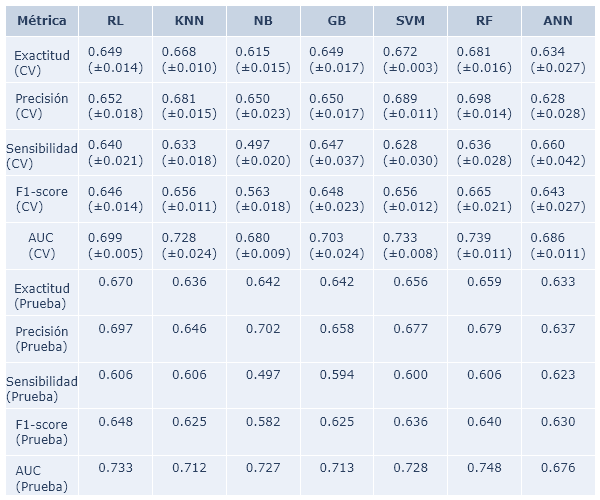

In [ ]:
# Tabla con los resultados para fp
resultados_finales_fp_MCL1_acortados=resultados_finales_fp_MCL1.iloc[1:,:]
resultados_finales_fp_MCL1_acortados.columns=['RL','KNN','NB','GB','SVM','RF','ANN']

# Guardar imagen
fig = df2img.plot_dataframe(
    resultados_finales_fp_MCL1_acortados,
    fig_size=(600,500),
)

### MCL-1 alternativo

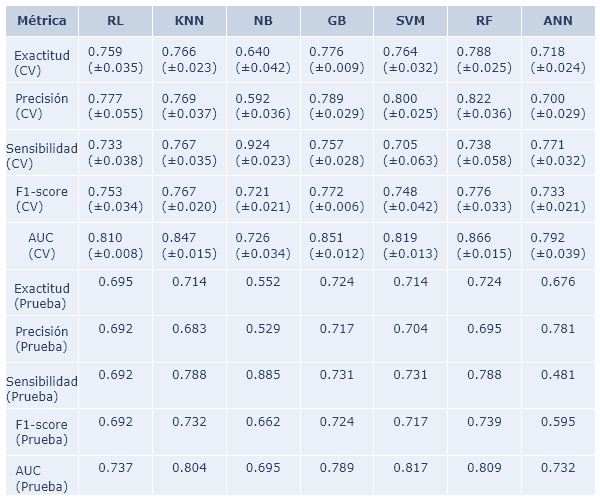

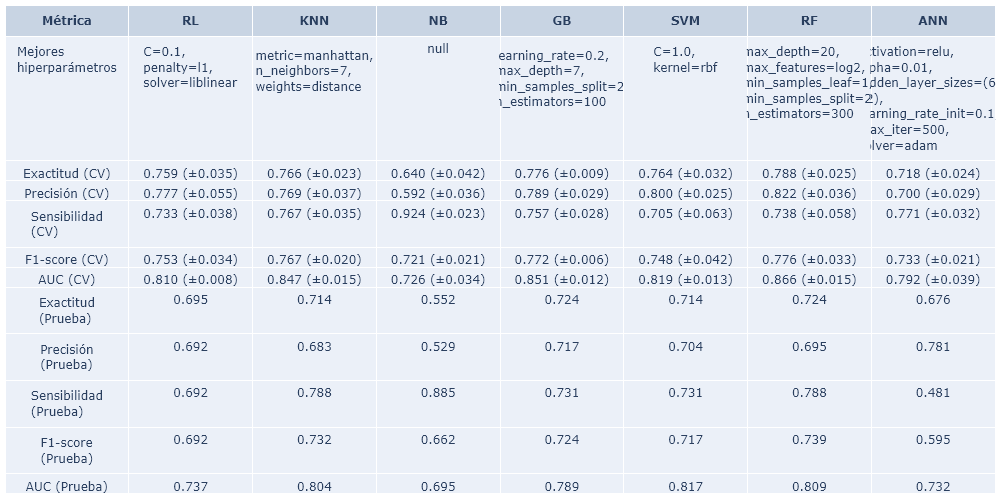

In [ ]:
# Tabla con los resultados para MCL-1 alternativo
resultados_finales_MCL1_del_acortados=resultados_finales_MCL1_del.iloc[1:,:]
resultados_finales_MCL1_del_acortados.columns=['RL','KNN','NB','GB','SVM','RF','ANN']

# Crear imagen datos sin hiperparametros
fig = df2img.plot_dataframe(
    resultados_finales_MCL1_del_acortados,
    fig_size=(600,500),
)



resultados_finales_MCL1_del_acortados_hip=resultados_finales_MCL1_del.copy()
resultados_finales_MCL1_del_acortados_hip.columns=['RL','KNN','NB','GB','SVM','RF','ANN']
resultados_finales_MCL1_del_acortados_hip
# crear imagen
fig = df2img.plot_dataframe(
    resultados_finales_MCL1_del_acortados_hip,
    fig_size=(1000,500),
)

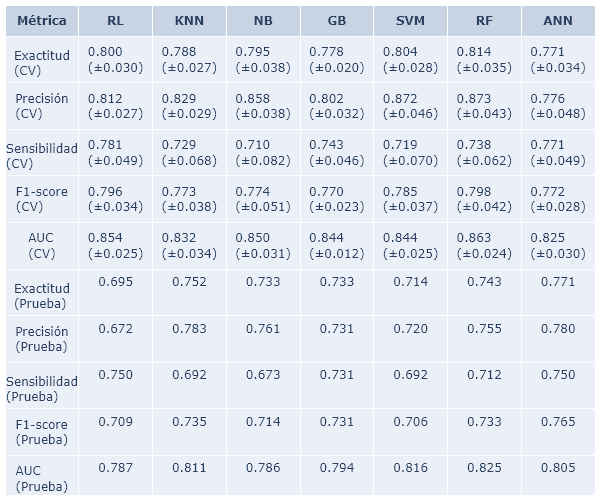

,RL,KNN,NB,GB,SVM,RF,ANN
Métrica,,,,,,,
Exactitud (CV),0.800 (±0.030),0.788 (±0.027),0.795 (±0.038),0.778 (±0.020),0.804 (±0.028),0.814 (±0.035),0.771 (±0.034)
Precisión (CV),0.812 (±0.027),0.829 (±0.029),0.858 (±0.038),0.802 (±0.032),0.872 (±0.046),0.873 (±0.043),0.776 (±0.048)
Sensibilidad (CV),0.781 (±0.049),0.729 (±0.068),0.710 (±0.082),0.743 (±0.046),0.719 (±0.070),0.738 (±0.062),0.771 (±0.049)
F1-score (CV),0.796 (±0.034),0.773 (±0.038),0.774 (±0.051),0.770 (±0.023),0.785 (±0.037),0.798 (±0.042),0.772 (±0.028)
AUC (CV),0.854 (±0.025),0.832 (±0.034),0.850 (±0.031),0.844 (±0.012),0.844 (±0.025),0.863 (±0.024),0.825 (±0.030)
Exactitud (Prueba),0.695,0.752,0.733,0.733,0.714,0.743,0.771
Precisión (Prueba),0.672,0.783,0.761,0.731,0.720,0.755,0.780
Sensibilidad (Prueba),0.750,0.692,0.673,0.731,0.692,0.712,0.750
F1-score (Prueba),0.709,0.735,0.714,0.731,0.706,0.733,0.765


In [ ]:
# Resultados para MCL alternativo fp
resultados_finales_fp_MCL1_del_acortados=resultados_finales_fp_MCL1_del.iloc[1:,:]
resultados_finales_fp_MCL1_del_acortados.columns=['RL','KNN','NB','GB','SVM','RF','ANN']

# Guardar imagen
fig = df2img.plot_dataframe(
    resultados_finales_fp_MCL1_del_acortados,
    fig_size=(600,500),
)
resultados_finales_fp_MCL1_del_acortados

### BCL-xL

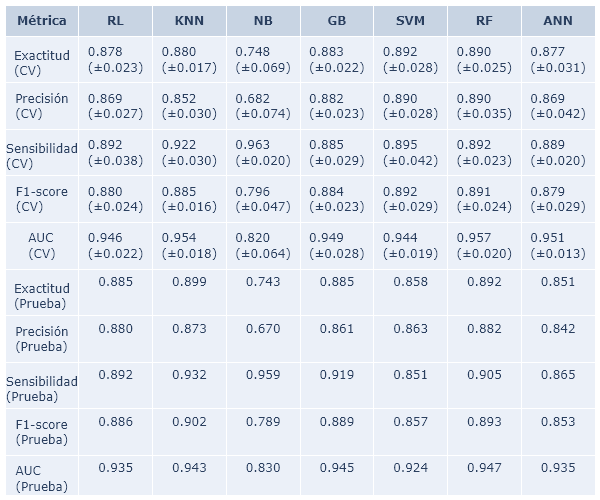

,RL,KNN,NB,GB,SVM,RF,ANN
Métrica,,,,,,,
Exactitud (CV),0.878 (±0.023),0.880 (±0.017),0.748 (±0.069),0.883 (±0.022),0.892 (±0.028),0.890 (±0.025),0.877 (±0.031)
Precisión (CV),0.869 (±0.027),0.852 (±0.030),0.682 (±0.074),0.882 (±0.023),0.890 (±0.028),0.890 (±0.035),0.869 (±0.042)
Sensibilidad (CV),0.892 (±0.038),0.922 (±0.030),0.963 (±0.020),0.885 (±0.029),0.895 (±0.042),0.892 (±0.023),0.889 (±0.020)
F1-score (CV),0.880 (±0.024),0.885 (±0.016),0.796 (±0.047),0.884 (±0.023),0.892 (±0.029),0.891 (±0.024),0.879 (±0.029)
AUC (CV),0.946 (±0.022),0.954 (±0.018),0.820 (±0.064),0.949 (±0.028),0.944 (±0.019),0.957 (±0.020),0.951 (±0.013)
Exactitud (Prueba),0.885,0.899,0.743,0.885,0.858,0.892,0.851
Precisión (Prueba),0.880,0.873,0.670,0.861,0.863,0.882,0.842
Sensibilidad (Prueba),0.892,0.932,0.959,0.919,0.851,0.905,0.865
F1-score (Prueba),0.886,0.902,0.789,0.889,0.857,0.893,0.853


In [ ]:
# Resultados finales para BCL-xL
resultados_finales_BCLXL_acortados=resultados_finales_BCLXL.iloc[1:,:]
resultados_finales_BCLXL_acortados.columns=['RL','KNN','NB','GB','SVM','RF','ANN']

# Guardar imagen
fig = df2img.plot_dataframe(
    resultados_finales_BCLXL_acortados,
    fig_size=(600,500),
)

# Guardar imagen
df2img.save_dataframe(fig, filename='resultados_finales_BCLXL.png')

resultados_finales_BCLXL_acortados

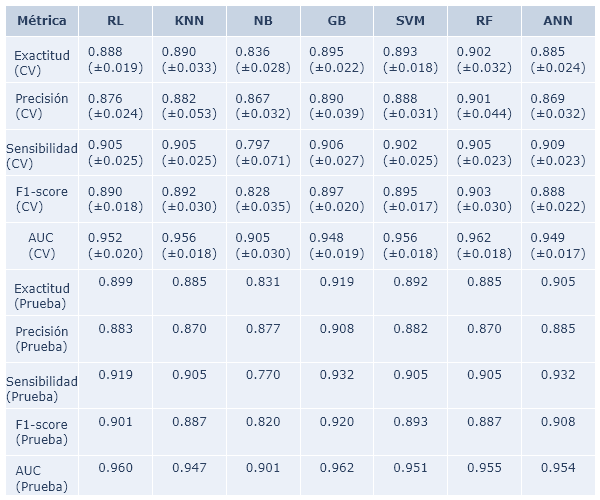

,RL,KNN,NB,GB,SVM,RF,ANN
Métrica,,,,,,,
Exactitud (CV),0.888 (±0.019),0.890 (±0.033),0.836 (±0.028),0.895 (±0.022),0.893 (±0.018),0.902 (±0.032),0.885 (±0.024)
Precisión (CV),0.876 (±0.024),0.882 (±0.053),0.867 (±0.032),0.890 (±0.039),0.888 (±0.031),0.901 (±0.044),0.869 (±0.032)
Sensibilidad (CV),0.905 (±0.025),0.905 (±0.025),0.797 (±0.071),0.906 (±0.027),0.902 (±0.025),0.905 (±0.023),0.909 (±0.023)
F1-score (CV),0.890 (±0.018),0.892 (±0.030),0.828 (±0.035),0.897 (±0.020),0.895 (±0.017),0.903 (±0.030),0.888 (±0.022)
AUC (CV),0.952 (±0.020),0.956 (±0.018),0.905 (±0.030),0.948 (±0.019),0.956 (±0.018),0.962 (±0.018),0.949 (±0.017)
Exactitud (Prueba),0.899,0.885,0.831,0.919,0.892,0.885,0.905
Precisión (Prueba),0.883,0.870,0.877,0.908,0.882,0.870,0.885
Sensibilidad (Prueba),0.919,0.905,0.770,0.932,0.905,0.905,0.932
F1-score (Prueba),0.901,0.887,0.820,0.920,0.893,0.887,0.908


In [ ]:
# Resultados finales para BCL-xL fingerprints
resultados_finales_fp_BCLXL_acortados=resultados_finales_fp_BCLXL.iloc[1:,:]
resultados_finales_fp_BCLXL_acortados.columns=['RL','KNN','NB','GB','SVM','RF','ANN']

# Guardar
fig = df2img.plot_dataframe(
    resultados_finales_fp_BCLXL_acortados,
    fig_size=(600,500),
)

resultados_finales_fp_BCLXL_acortados

### Matrices de confusión de los mejores modelos

In [ ]:
# Modificicamos la función de random forest para que extraiga la matriz de confusion
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve
from sklearn.metrics import ConfusionMatrixDisplay, confusion_matrix
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

def evaluar_random_forest_mc(X_train, y_train, X_test, y_test):
    # Modelo base
    rf = RandomForestClassifier(random_state=999)

    # Ajuste de hiperparámetros con GridSearchCV
    param_grid = {
        'n_estimators': [100, 200, 300],
        'max_depth': [None, 10, 20],
        'min_samples_split': [2, 5],
        'min_samples_leaf': [1, 2],
        'max_features': [0.5, 'sqrt', 'log2']
    }
    metricas = ['accuracy', 'precision', 'recall', 'f1', 'roc_auc']
    grid_rf = GridSearchCV(rf, param_grid, cv=5, scoring=metricas, refit='roc_auc', n_jobs=-1)
    grid_rf.fit(X_train, y_train)

    # Mostrar mejores parámetros y la exactitud (accuracy)
    print("Mejores parámetros:", grid_rf.best_params_)
    print("Mejor precisión en CV (GridSearch):", grid_rf.best_score_)

    # Extraer métricas de validación cruzada para el mejor modelo
    resultados = {
        'Mejores hiperparámetros': ', '.join([f'{k}={v}' for k, v in grid_rf.best_params_.items()]), # Por cada par (k, v) (clave, valor) en el diccionario, se crea una cadena con formato clave=valor.
        'Exactitud (CV)': f"{grid_rf.cv_results_['mean_test_accuracy'][grid_rf.best_index_]:.3f} (±{grid_rf.cv_results_['std_test_accuracy'][grid_rf.best_index_]:.3f})",
        'Precisión (CV)': f"{grid_rf.cv_results_['mean_test_precision'][grid_rf.best_index_]:.3f} (±{grid_rf.cv_results_['std_test_precision'][grid_rf.best_index_]:.3f})",
        'Sensibilidad (CV)': f"{grid_rf.cv_results_['mean_test_recall'][grid_rf.best_index_]:.3f} (±{grid_rf.cv_results_['std_test_recall'][grid_rf.best_index_]:.3f})",
        'F1-score (CV)': f"{grid_rf.cv_results_['mean_test_f1'][grid_rf.best_index_]:.3f} (±{grid_rf.cv_results_['std_test_f1'][grid_rf.best_index_]:.3f})",
        'AUC (CV)': f"{grid_rf.cv_results_['mean_test_roc_auc'][grid_rf.best_index_]:.3f} (±{grid_rf.cv_results_['std_test_roc_auc'][grid_rf.best_index_]:.3f})"
    }

    # Evaluación en el conjunto de prueba
    modelo_optimizado = grid_rf.best_estimator_
    y_pred = modelo_optimizado.predict(X_test)
    y_pred_proba = modelo_optimizado.predict_proba(X_test)[:, 1]  # Probabilidades para la clase positiva
    resultados['Exactitud (Prueba)'] = f"{accuracy_score(y_test, y_pred):.3f}"
    resultados['Precisión (Prueba)'] = f"{precision_score(y_test, y_pred):.3f}"
    resultados['Sensibilidad (Prueba)'] = f"{recall_score(y_test, y_pred):.3f}"
    resultados['F1-score (Prueba)'] = f"{f1_score(y_test, y_pred):.3f}"
    resultados['AUC (Prueba)'] = f"{roc_auc_score(y_test, y_pred_proba):.3f}"

    # Cálculo de la curva ROC para el conjunto de prueba
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

    # Visualización de la curva ROC
    fig = plt.figure()
    plt.plot(fpr, tpr, color='blue', lw=2, label=f'Curva ROC (AUC = {roc_auc_score(y_test, y_pred_proba):.3f})')
    plt.plot([0, 1], [0, 1], color='gray', lw=1, linestyle='--')  # Línea diagonal
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('Tasa de Falsos Positivos',fontsize=16)
    plt.ylabel('Tasa de Verdaderos Positivos',fontsize=16)
    plt.title('Curva ROC - Conjunto de Prueba (Random Forest)',fontsize=16)
    plt.legend(loc="lower right",fontsize=16)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.grid(True)

    # Tabla de resultados
    tabla_resultados = pd.DataFrame.from_dict(resultados, orient='index', columns=['Valor'])
    tabla_resultados.index.name = 'Métrica'

    # Matriz de confusión para el conjunto de prueba
    fig_confusion = plt.figure()
    cm = confusion_matrix(y_test, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    disp.plot(cmap='Blues', values_format='d')
    plt.title('Matriz de Confusión - Conjunto de Prueba (Random Forest)', fontsize=16)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.xlabel('Predicción', fontsize=16)
    plt.ylabel('Real', fontsize=16)
    plt.grid(False)

    return tabla_resultados, fig, fig_confusion, modelo_optimizado

Mejores parámetros: {'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 300}
Mejor precisión en CV (GridSearch): 0.9539841498072731


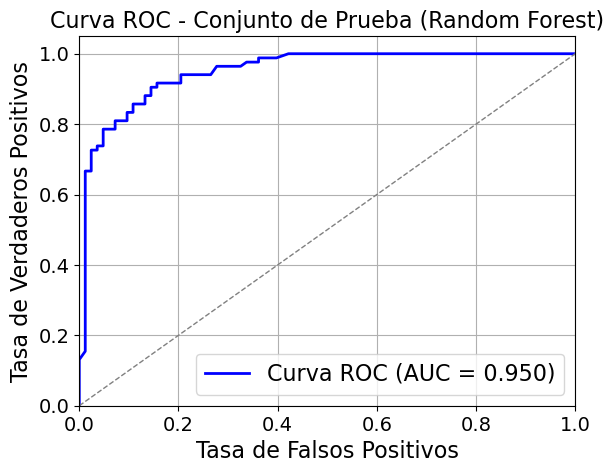

<Figure size 640x480 with 0 Axes>

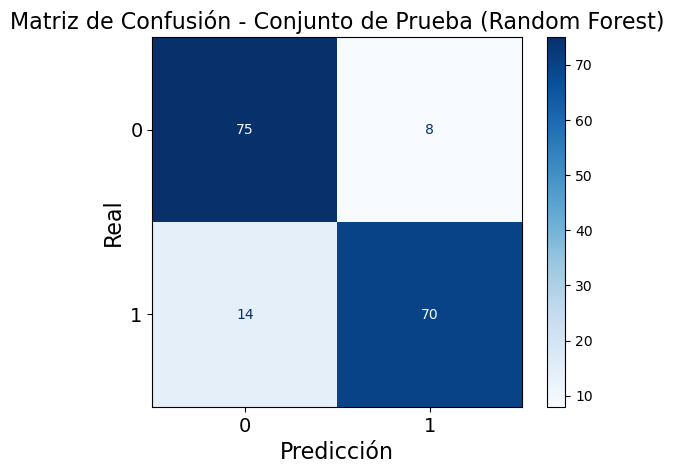

In [ ]:
# Resultados para desc bcl-2
resultados_rf_mc_BCL2, figura_rf_mc_BCL2, figura_confusion_rf_mc_BCL2, modelo_optimizado_rf = evaluar_random_forest_mc(X_train, y_train, X_test, y_test)

Mejores parámetros: {'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 300}
Mejor precisión en CV (GridSearch): 0.7388147849067683


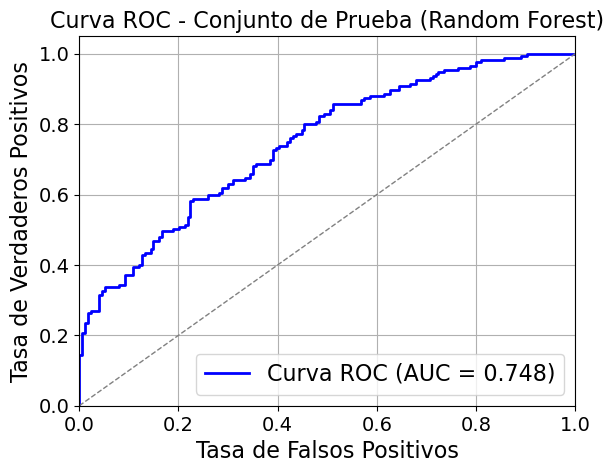

<Figure size 640x480 with 0 Axes>

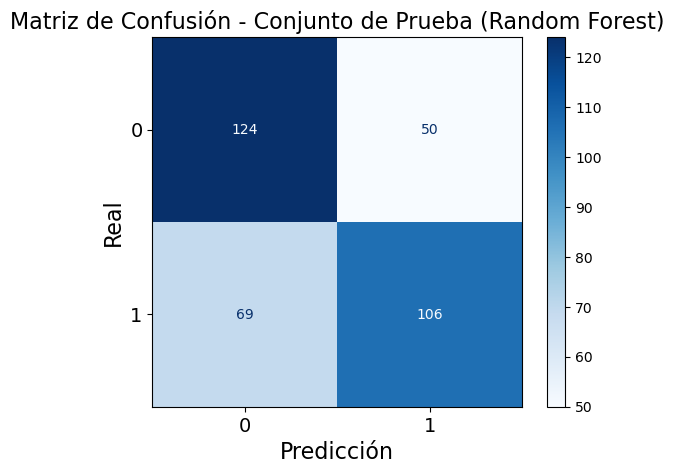

In [ ]:
# Resultados para fp MCL-1
resultados_rf_mc_fp_MCL1, figura_rf_mc_fp_MCL1, figura_confusion_rf_mc_fp_MCL1, modelo_optimizado_rf_fp_MCL1_del = evaluar_random_forest_mc(X_train_fp_MCL1, y_train_fp_MCL1, X_test_fp_MCL1, y_test_fp_MCL1)

Mejores parámetros: {'max_depth': None, 'max_features': 'log2', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 300}
Mejor precisión en CV (GridSearch): 0.8626845860295338


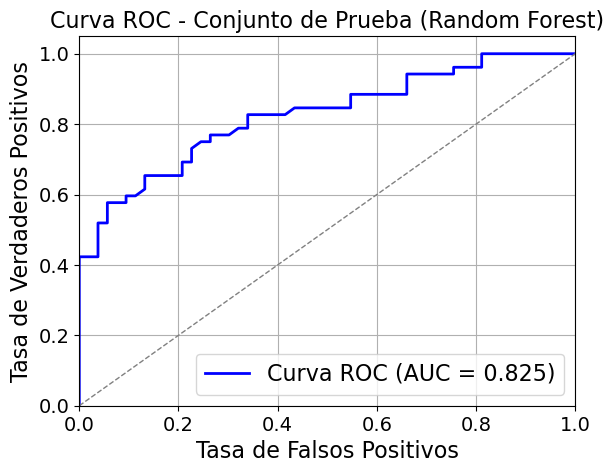

<Figure size 640x480 with 0 Axes>

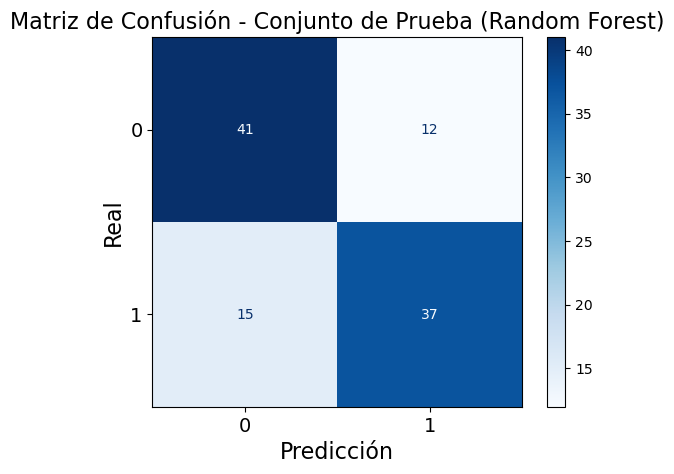

In [ ]:
# Resultados para fp MCL-1 del
resultados_rf_mc_fp_MCL1_del, figura_rf_mc_fp_MCL1_del, figura_confusion_rf_mc_fp_MCL1_del, modelo_optimizado_rf_fp_MCL1_del = evaluar_random_forest_mc(X_train_fp_MCL1_del, y_train_fp_MCL1_del, X_test_fp_MCL1_del, y_test_fp_MCL1_del)

In [ ]:
# Modificamos la funcion de knn  para generar la matriz de confusión
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve
from sklearn.metrics import ConfusionMatrixDisplay, confusion_matrix
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

def evaluar_knn_mc(X_train, y_train, X_test, y_test):
    # Modelo base
    knn = KNeighborsClassifier()

    # Ajuste de hiperparámetros con GridSearchCV
    param_grid = {
        'n_neighbors': [3, 5, 7, 9, 11],
        'weights': ['uniform', 'distance'],
        'metric': ['euclidean', 'manhattan']
    }
    metricas = ['accuracy', 'precision', 'recall', 'f1', 'roc_auc']
    grid_knn = GridSearchCV(knn, param_grid, cv=5, scoring=metricas, refit='roc_auc', n_jobs=-1)
    grid_knn.fit(X_train, y_train)

    # Mostrar mejores parámetros y la exactitud (accuracy)
    print("Mejores parámetros:", grid_knn.best_params_)
    print("Mejor precisión en CV (GridSearch):", grid_knn.best_score_)

    # Extraer métricas de validación cruzada para el mejor modelo
    resultados = {
        'Mejores hiperparámetros': ', '.join([f'{k}={v}' for k, v in grid_knn.best_params_.items()]), # Por cada par (k, v) (clave, valor) en el diccionario, se crea una cadena con formato clave=valor.
        'Exactitud (CV)': f"{grid_knn.cv_results_['mean_test_accuracy'][grid_knn.best_index_]:.3f} (±{grid_knn.cv_results_['std_test_accuracy'][grid_knn.best_index_]:.3f})",
        'Precisión (CV)': f"{grid_knn.cv_results_['mean_test_precision'][grid_knn.best_index_]:.3f} (±{grid_knn.cv_results_['std_test_precision'][grid_knn.best_index_]:.3f})",
        'Sensibilidad (CV)': f"{grid_knn.cv_results_['mean_test_recall'][grid_knn.best_index_]:.3f} (±{grid_knn.cv_results_['std_test_recall'][grid_knn.best_index_]:.3f})",
        'F1-score (CV)': f"{grid_knn.cv_results_['mean_test_f1'][grid_knn.best_index_]:.3f} (±{grid_knn.cv_results_['std_test_f1'][grid_knn.best_index_]:.3f})",
        'AUC (CV)': f"{grid_knn.cv_results_['mean_test_roc_auc'][grid_knn.best_index_]:.3f} (±{grid_knn.cv_results_['std_test_roc_auc'][grid_knn.best_index_]:.3f})"
    }

    # Evaluación en el conjunto de prueba
    modelo_optimizado = grid_knn.best_estimator_
    y_pred = modelo_optimizado.predict(X_test)
    y_pred_proba = modelo_optimizado.predict_proba(X_test)[:, 1]  # Probabilidades para la clase positiva
    resultados['Exactitud (Prueba)'] = f"{accuracy_score(y_test, y_pred):.3f}"
    resultados['Precisión (Prueba)'] = f"{precision_score(y_test, y_pred):.3f}"
    resultados['Sensibilidad (Prueba)'] = f"{recall_score(y_test, y_pred):.3f}"
    resultados['F1-score (Prueba)'] = f"{f1_score(y_test, y_pred):.3f}"
    resultados['AUC (Prueba)'] = f"{roc_auc_score(y_test, y_pred_proba):.3f}"

    # Cálculo de la curva ROC para el conjunto de prueba
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

    # Visualización de la curva ROC
    fig = plt.figure()
    plt.plot(fpr, tpr, color='blue', lw=2, label=f'Curva ROC (AUC = {roc_auc_score(y_test, y_pred_proba):.3f})')
    plt.plot([0, 1], [0, 1], color='gray', lw=1, linestyle='--')  # Línea diagonal
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('Tasa de Falsos Positivos',fontsize=16)
    plt.ylabel('Tasa de Verdaderos Positivos',fontsize=16)
    plt.title('Curva ROC - Conjunto de Prueba (k-NN)',fontsize=16)
    plt.legend(loc="lower right",fontsize=16)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.grid(True)

    # Tabla de resultados
    tabla_resultados = pd.DataFrame.from_dict(resultados, orient='index', columns=['Valor'])
    tabla_resultados.index.name = 'Métrica'

    # Matriz de confusión para el conjunto de prueba
    fig_confusion = plt.figure()
    cm = confusion_matrix(y_test, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    disp.plot(cmap='Blues', values_format='d')
    plt.title('Matriz de Confusión - Conjunto de Prueba (k-NN)', fontsize=16)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.xlabel('Predicción', fontsize=16)
    plt.ylabel('Real', fontsize=16)
    plt.grid(False)

    return tabla_resultados, fig, fig_confusion,modelo_optimizado


Mejores parámetros: {'metric': 'manhattan', 'n_neighbors': 11, 'weights': 'distance'}
Mejor precisión en CV (GridSearch): 0.9541664272718566


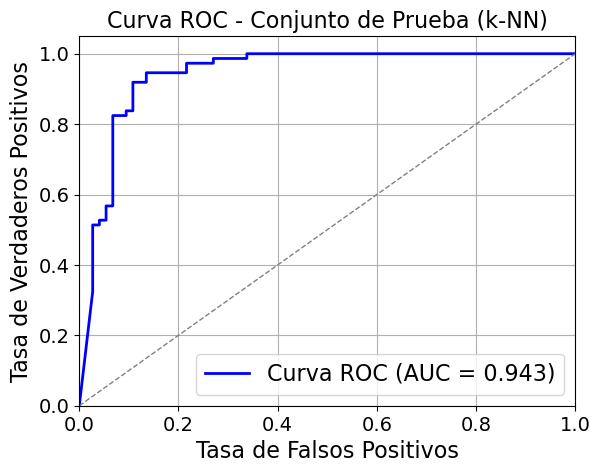

<Figure size 640x480 with 0 Axes>

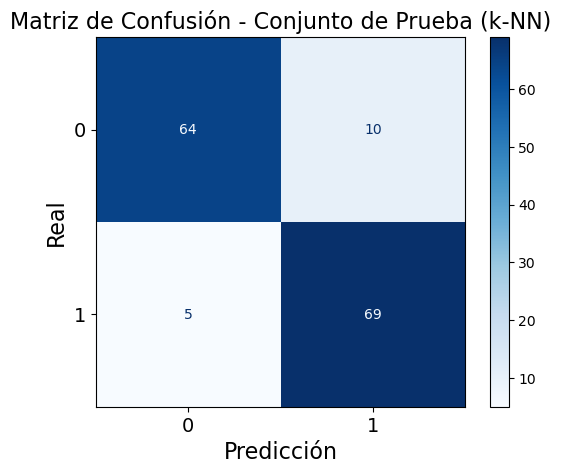

In [ ]:
# Usamos la funcion en BCL-xL descriptores, donde el mejor modelo fue knn
resultados_knn_mc_BCLXL, figura_knn_mc_BCLXL, figura_confusion_knn_mc_BCLXL,modelo_optimizado_knn_BCLXL = evaluar_knn_mc(X_train_BCLXL, y_train_BCLXL, X_test_BCLXL, y_test_BCLXL)
